In [1]:
import numpy as np
from ete3 import Tree, TreeStyle, TextFace, add_face_to_node
import pandas as pd
import seaborn as sn

In [2]:
df_white = pd.read_csv('winequality-white.csv', ";")
df_red = pd.read_csv('winequality-red.csv', ";")

In [3]:
print(np.asarray(df_white))
full_data_white = np.asarray(df_white)
full_data_red = np.asarray(df_red)
feature_names = df_white.columns
f_names = np.asarray(feature_names)
print(f_names)

[[ 7.    0.27  0.36 ...  8.8   6.    2.  ]
 [ 6.3   0.3   0.34 ...  9.5   6.    2.  ]
 [ 8.1   0.28  0.4  ... 10.1   6.    2.  ]
 ...
 [ 6.5   0.24  0.19 ...  9.4   6.    2.  ]
 [ 5.5   0.29  0.3  ... 12.8   7.    2.  ]
 [ 6.    0.21  0.38 ... 11.8   6.    2.  ]]
['fixed acidity' 'volatile acidity' 'citric acid' 'residual sugar'
 'chlorides' 'free sulfur dioxide' 'total sulfur dioxide' 'density' 'pH'
 'sulphates' 'alcohol' 'quality' 'Quality']


In [4]:
y_values_white = full_data_white[:,-2:]
data_white = full_data_white[:,:11]

y_values_red = full_data_red[:,-2:]
data_red = full_data_red[:,:11]
f_names = f_names[:11]

# Normalisation of the datapoints
data_norm_white = data_white
data_norm_red = data_red
for i in range(data_norm_white.shape[1]):
    data_norm_white[:,i] = data_norm_white[:,i]/np.max(data_norm_white[:,i])
    
for i in range(data_norm_red.shape[1]):
    data_norm_red[:,i] = data_norm_red[:,i]/np.max(data_norm_red[:,i])
    
print("Feature Names:")
print(f_names)
print('\n')
print("Target Columns (White wine):") #First column is before pre-proccessing
print(y_values_white)
print('\n')
print("Data Normalized (White wine):")
print(data_norm_white)
print('\n')

# Class problem refers to the column number of the target values

class_problem = 0

# Training / Test split for white wine data
no_of_datapoints_white = data_white.shape[0]
no_of_y_values_white = y_values_white.shape[0]

training_data_white = data_white[:round(no_of_datapoints_white*.6),:]
testing_data_white = data_white[-round(no_of_datapoints_white*.4):,:]

training_y_values_white = y_values_white[:round(no_of_y_values_white*.6),:]
testing_y_values_white = y_values_white[-round(no_of_y_values_white*.4):,:]

no_of_test_datapoints_white = testing_data_white.shape[0]
no_of_test_y_values_white = testing_y_values_white.shape[0]

# Training / Test split for red wine data
no_of_datapoints_red = data_red.shape[0]
no_of_y_values_red = y_values_red.shape[0]

training_data_red = data_red[:round(no_of_datapoints_red*.6),:]
testing_data_red = data_red[-round(no_of_datapoints_red*.4):,:]

training_y_values_red = y_values_red[:round(no_of_y_values_red*.6),:]
testing_y_values_red = y_values_red[-round(no_of_y_values_red*.4):,:]

#print(validation_data_white)
print(.2*data_white.shape[0])



Feature Names:
['fixed acidity' 'volatile acidity' 'citric acid' 'residual sugar'
 'chlorides' 'free sulfur dioxide' 'total sulfur dioxide' 'density' 'pH'
 'sulphates' 'alcohol']


Target Columns (White wine):
[[6. 2.]
 [6. 2.]
 [6. 2.]
 ...
 [6. 2.]
 [7. 2.]
 [6. 2.]]


Data Normalized (White wine):
[[0.49295775 0.24545455 0.21686747 ... 0.78534031 0.41666667 0.61971831]
 [0.44366197 0.27272727 0.20481928 ... 0.86387435 0.4537037  0.66901408]
 [0.57042254 0.25454545 0.24096386 ... 0.85340314 0.40740741 0.71126761]
 ...
 [0.45774648 0.21818182 0.11445783 ... 0.78272251 0.42592593 0.66197183]
 [0.38732394 0.26363636 0.18072289 ... 0.87434555 0.35185185 0.90140845]
 [0.42253521 0.19090909 0.22891566 ... 0.85340314 0.2962963  0.83098592]]


979.6


In [5]:
def calc_entropy(data):
    unique, counts = np.unique(data, return_counts = True)
    for (u, c) in zip(unique, counts):
        continue
        #print("Node has {} elements of Class {}".format(c, u))
    count_table = np.array([unique,counts]).T
    prob = np.array(count_table[:,1]/len(data))
    data_entropy = -sum(prob*np.log2(prob))
    
    entropy = np.sum(
        [
            (-counts[i] / np.sum(counts)) * np.log2(counts[i] / np.sum(counts))
            for i in range(len(unique))
        ]
    )
    return([entropy, unique])

def info_gain(data, left, right, node_entropy, split_values):
        total = data.shape[0]
        entropy_left = calc_entropy(left)[0]
        entropy_right = calc_entropy(right)[0]
        weighted_entropy = ((int(left.shape[0]) / total) * entropy_left) + (
            (right.shape[0] / total) * entropy_right
        )
        info_gain = node_entropy - weighted_entropy
        print("Info gain at split {} is {} \n".format(split_values, info_gain))
        return info_gain
    

In [6]:
class tree_node:
    def __init__(self, data, labels, diagram_node, available_features, splits):
        self.data = data
        self.labels = labels
        self.diagram_node = diagram_node 
        self.available_features = available_features 
        self.feature_index = None 
        self.feature_name = None 
        self.node_values = None
        self.is_leaf = False 
        self.class_value = None
        self.children = None
        self.split_val = None
        self.node_entropy = calc_entropy(labels[:,class_problem])[0]
        self.split_array = np.zeros(self.data.shape[1])
        self.splits = splits
       
        if not (self.node_entropy == 0.0 or self.node_entropy == -0.0 or self.data.shape[1] == 0):
            self.children = np.array([])
            self.split_val = None
            self.node_values = None
            self.find_feature()
            self.descend_tree()
        elif self.data.shape[1] == 0:
            self.is_leaf = True
            unique, counts = np.unique(labels[:,class_problem],return_counts = True)
            majority_class = np.argmax(counts)
            self.class_value = unique[majority_class]  
            #print('labels: {}'.format(self.labels[:,:]))
            #print("CLASS VALUE {}".format(self.class_value))
            self.feature_name = str(self.class_value)
            self.diagram_node.name = self.feature_name
        else:
            self.is_leaf = True
            #print('labels: {}'.format(self.labels))
            self.class_value = labels[0,class_problem]
            self.feature_name = str(labels[0,class_problem])
            self.diagram_node.name = self.feature_name


    
    # To pick the best feature with highest information gain
    def find_feature(self):
        print("Finding feature for new node")
        feature_entropies = np.zeros(self.data.shape[1])
        max_split_array = ([]) 
        feature_info_array = ([])
        for i in range(self.data.shape[1]): # For each feature
            print("Working on feature: ", i)
            d = self.labels[:,class_problem]
            feature_entropies[i], uniqueValues =  calc_entropy(d)
            feature_sub_classes = np.unique(self.data)
            #print('feature subclasses: {}'.format(feature_sub_classes))
            
            # choosing size of increment changes amount of split points
            increment = (np.max(self.data[:,i])-np.min(self.data[:,i]))/self.splits
            print("increment : {}".format(increment))
            
            #print(self.data[:,:])
            print('max: {}'.format(np.max(self.data[:,i])))
            print('min: {}'.format(np.min(self.data[:,i])))
            #print('increment: {}'.format(increment))
            if increment == 0:
                split_values = ([])
            else:    
                split_values = np.arange(np.min(self.data[:,i]+increment),np.max(self.data[:,i]-increment),increment)
            #print('split values array: {}'.format(split_values))
            info_gains_array = ([])

            for j in split_values:
                left_node_data = np.where(self.data[:,i]<j)
                right_node_data = np.where(self.data[:,i]>=j)
                left_node_data = self.labels[left_node_data,class_problem]
                right_node_data = self.labels[right_node_data,class_problem]
                
                info_gains_array.append(info_gain(self.data,left_node_data,right_node_data,feature_entropies[i],j))
                #print(info_gains_array)

            if increment == 0:
                feature_split_value = 0
                feature_info_array = ([])
            else:        
                feature_split_value = split_values[np.argmax(info_gains_array)]
                feature_info_array.append(np.argmax(info_gains_array))
            max_split_array.append(feature_split_value)
            print('feature_split_value')
            print(feature_split_value)
            
            
            
        #print(feature_info_array)
        print('index of feature with max info gain:')
        #print(max_split_array[0][:])
        max_index = np.argmax(feature_info_array)
        print(max_index)
        #print(f_names)
        #print(f_names[max_index])
        #print('val of split_value max info gain:')
        #print(feature_info_array[max_index])
        self.split_val = max_split_array[max_index]
        #self.split_array = ([])
        chosen_feature = max_index                 
        self.feature_index = chosen_feature
        self.feature_name = self.available_features[self.feature_index]
        self.diagram_node.name = self.feature_name
        print("Found feature: ", self.feature_name)
        print("Found feature index: ", self.feature_index)
        print('split val for feature = ', self.split_val)
        #split_array[max_index] = self.split_val
        self.split_array[max_index] = self.split_val
        print('split array', self.split_array )
        
    # This function is used to add nodes to the tree once the best feature to split the data is found
    def descend_tree(self):
        print("Descending tree with node entropy value: ", self.node_entropy)
        data_for_feature_value_greater = np.where(self.data[:,self.feature_index] >= self.split_val)
        data_for_feature_value_lower = np.where(self.data[:,self.feature_index] < self.split_val)
        #print('data_for_feature_value_greater')
        #print(data_for_feature_value_greater)
        #print('data_for_feature_value_lower')
        #print(data_for_feature_value_lower)
        remaining_features = np.arange(self.data.shape[1])!=self.feature_index 
        new_child_diagram_node = self.diagram_node.add_child(name="Temp")
        print('self.split_val {}'.format(self.split_val))
        
        self.node_values = self.split_val
        print("self.node_values {}".format(self.node_values))
        
        self.children = np.append(self.children, 
            tree_node(self.data[data_for_feature_value_lower][:,remaining_features],self.labels[data_for_feature_value_lower],
            new_child_diagram_node, self.available_features[remaining_features],self.splits))
        
        remaining_features = np.arange(self.data.shape[1])!=self.feature_index 
        new_child_diagram_node = self.diagram_node.add_child(name="Temp")
        
        self.children = np.append(self.children, 
            tree_node(self.data[data_for_feature_value_greater][:,remaining_features],self.labels[data_for_feature_value_greater],
            new_child_diagram_node, self.available_features[remaining_features],self.splits))
        #print("Children:")
        #print(self.children)
        
    # This function infers (predicts) the class of a new/unseen data point. We call this on the test data points
    def infer(self, data_point):
        sv = self.split_val
        if not self.is_leaf:
            print(data_point)
            print(self.feature_index)
            print(self.feature_name)
            print(data_point[self.feature_index])
            if sv > data_point[self.feature_index]:
                print('data point less than split value')
                print('sv: ',sv)
                child = self.children[0]
                sv = child.split_val
                print('child sv less: ',sv)
                #print(type(self.children[0]))
                allocated_class = self.children[0].infer(data_point[np.arange(data_point.shape[0])!=self.feature_index])
                #print('allocated class1:',allocated_class)
                return(allocated_class)
            else:
                print('data point more than split value')
                print('sv: ',sv)
                child = self.children[1]
                sv = child.split_val
                print('child sv more: ',sv)
                allocated_class = self.children[1].infer(data_point[np.arange(data_point.shape[0])!=self.feature_index])
                #print('allocated class2:',allocated_class)
                return(allocated_class)
            print("Error found new value, can't classify")
        else:
            print("Classified data point as: ", self.class_value)
            return(self.class_value)
    

In [7]:
# Testing hyperparameters - max tree depth

t = Tree()
splits = 6
tree_white = tree_node(training_data_white[:,[0,1,2,3,4,5,6,7]], training_y_values_white, t, f_names[[0,1,2,3,4,5,6,7]], splits)
print(t.get_ascii(show_internal=True))

ts = TreeStyle()
ts.show_leaf_name = False
def my_layout(node):
    F = TextFace(node.name, tight_text=True)
    F.rotable = True
    F.border.width = 0
    F.margin_top = 2
    F.margin_bottom = 2
    F.margin_left = 2
    F.margin_right = 2
    add_face_to_node(F, node, column=0, position="branch-right")
ts.layout_fn = my_layout
ts.mode = 'r'
ts.arc_start = 270
ts.arc_span = 185
ts.draw_guiding_lines = True
ts.scale = 100
ts.branch_vertical_margin = 100
ts.min_leaf_separation = 100
ts.show_scale = True

Finding feature for new node
Working on feature:  0
increment : 0.11737089201877933
max: 1.0
min: 0.295774647887324
Info gain at split 0.4131455399061033 is 1.9010072587715556 

Info gain at split 0.5305164319248826 is 1.901031804088286 

Info gain at split 0.647887323943662 is 1.901039710192721 

Info gain at split 0.7652582159624413 is 1.9013401335091475 

feature_split_value
0.7652582159624413
Working on feature:  1
increment : 0.1401515151515151
max: 0.9136363636363635
min: 0.07272727272727272
Info gain at split 0.21287878787878783 is 1.9010728690339131 

Info gain at split 0.3530303030303029 is 1.900996896152861 

Info gain at split 0.493181818181818 is 1.9010329885173516 

Info gain at split 0.6333333333333331 is 1.9011720989553527 

Info gain at split 0.7734848484848482 is 1.9012141653486638 

feature_split_value
0.7734848484848482
Working on feature:  2
increment : 0.16666666666666666
max: 1.0
min: 0.0
Info gain at split 0.16666666666666666 is 1.9010614747638288 

Info gain at 

self.split_val 0.7652582159624413
self.node_values 0.7652582159624413
Finding feature for new node
Working on feature:  0
increment : 0.16666666666666666
max: 1.0
min: 0.0
Info gain at split 0.16666666666666666 is 1.894928551470879 

Info gain at split 0.3333333333333333 is 1.895014631920205 

Info gain at split 0.5 is 1.8951209245939684 

Info gain at split 0.6666666666666666 is 1.8955481781521644 

Info gain at split 0.8333333333333333 is 1.8955481781521644 

feature_split_value
0.6666666666666666
Working on feature:  1
increment : 0.07852077001013173
max: 0.480243161094225
min: 0.00911854103343465
Info gain at split 0.08763931104356638 is 1.8949271254787985 

Info gain at split 0.16616008105369812 is 1.894955942872536 

Info gain at split 0.24468085106382986 is 1.8951244591229925 

Info gain at split 0.32320162107396155 is 1.8952165069291842 

feature_split_value
0.32320162107396155
Working on feature:  2
increment : 0.1608863198458574
max: 1.0
min: 0.03468208092485549
Info gain at 

In [8]:
count_correct = 0
conf_matrix_white = np.zeros(100).reshape((10,10))

for i in range(testing_data_white.shape[0]):
    out = tree_white.infer(testing_data_white[i])
    x = int(out)
    y = int(testing_y_values_white[i,class_problem])
    conf_matrix_white[x,y] = conf_matrix_white[x,y]+1
    is_correct = out == testing_y_values_white[i,class_problem]
    print('Actual data class: {}'.format(testing_y_values_white[i,class_problem]))
    if is_correct:
        print('CLASSIFIED CORRECTLY')
        count_correct = count_correct + 1
    else:
        print('CLASSIFIED INCORRECTLY')
    
print('Amount of guesses correct: {}'.format(count_correct))
print('Amount of total guesses: {}'.format(testing_y_values_white.shape[0]))
print("Final Testing Accuracy: ", count_correct/testing_y_values_white.shape[0])

[0.49295775 0.10909091 0.1746988  0.15653495 0.11271676 0.14186851
 0.22272727 0.95828601 0.83507853 0.35185185 0.69014085]
1
volatile acidity
0.10909090909090907
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.49295775 0.1746988  0.15653495 0.11271676 0.14186851 0.22272727
 0.95828601 0.83507853 0.35185185 0.69014085]
5
total sulfur dioxide
0.22272727272727272
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.49295775 0.1746988  0.15653495 0.11271676 0.14186851 0.95828601
 0.83507853 0.35185185 0.69014085]
0
fixed acidity
0.49295774647887325
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1746988  0.15653495 0.11271676 0.14186851 0.95828601 0.83507853
 0.35185185 0.69014085]
0
citric acid
0.1746987951807229
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.15653495 0.11271676 0.14186851 0.95828601 0.835

0.5
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.20481928 0.11854103 0.10404624 0.16955017 0.95667867 0.84031414
 0.37037037 0.75352113]
0
citric acid
0.20481927710843376
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.11854103 0.10404624 0.16955017 0.95667867 0.84031414 0.37037037
 0.75352113]
0
residual sugar
0.11854103343465046
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10404624 0.16955017 0.95667867 0.84031414 0.37037037 0.75352113]
1
free sulfur dioxide
0.1695501730103806
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10404624 0.95667867 0.84031414 0.37037037 0.75352113]
1
density
0.9566786656143526
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10404624 0.84031414 0.37037037 0.75352113]
0
chlorides
0.10404624277456648
data point less t

0
chlorides
0.12138728323699421
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.50704225 0.18181818 0.13253012 0.02431611 0.12716763 0.05882353
 0.22954545 0.9573909  0.88219895 0.49074074 0.70422535]
1
volatile acidity
0.18181818181818182
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.50704225 0.13253012 0.02431611 0.12716763 0.05882353 0.22954545
 0.9573909  0.88219895 0.49074074 0.70422535]
5
total sulfur dioxide
0.22954545454545455
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.50704225 0.13253012 0.02431611 0.12716763 0.05882353 0.9573909
 0.88219895 0.49074074 0.70422535]
0
fixed acidity
0.5070422535211268
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.13253012 0.02431611 0.12716763 0.05882353 0.9573909  0.88219895
 0.49074074 0.7

sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01671733 0.08959538 0.12802768 0.95272286 0.78795812 0.51851852
 0.82394366]
0
residual sugar
0.016717325227963528
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.08959538 0.12802768 0.95272286 0.78795812 0.51851852 0.82394366]
1
free sulfur dioxide
0.12802768166089964
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.08959538 0.95272286 0.78795812 0.51851852 0.82394366]
1
density
0.9527228628077539
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.08959538 0.78795812 0.51851852 0.82394366]
0
chlorides
0.08959537572254335
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.50704225 0.18181818 0.13253012 0.02431611 0.12716763 0.05882353
 0.22954545 0.9573909  0.88219895 0.49074074 0.70

CLASSIFIED INCORRECTLY
[0.4084507  0.17272727 0.14457831 0.01975684 0.12716763 0.13148789
 0.29090909 0.9563418  0.98691099 0.55555556 0.74647887]
1
volatile acidity
0.1727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.4084507  0.14457831 0.01975684 0.12716763 0.13148789 0.29090909
 0.9563418  0.98691099 0.55555556 0.74647887]
5
total sulfur dioxide
0.2909090909090909
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.4084507  0.14457831 0.01975684 0.12716763 0.13148789 0.9563418
 0.98691099 0.55555556 0.74647887]
0
fixed acidity
0.4084507042253521
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.14457831 0.01975684 0.12716763 0.13148789 0.9563418  0.98691099
 0.55555556 0.74647887]
0
citric acid
0.14457831325301204
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01975684 0.12716763 0.13148

child sv less:  0.34140715109573244
[0.06069364 0.1799308  0.95322335 0.76701571 0.2962963  0.80985915]
1
free sulfur dioxide
0.17993079584775087
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.06069364 0.95322335 0.76701571 0.2962963  0.80985915]
1
density
0.9532233536737954
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.06069364 0.76701571 0.2962963  0.80985915]
0
chlorides
0.06069364161849711
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.51408451 0.23636364 0.14457831 0.02583587 0.14450867 0.03460208
 0.25454545 0.95561031 0.81413613 0.39814815 0.6971831 ]
1
volatile acidity
0.23636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.51408451 0.14457831 0.02583587 0.14450867 0.03460208 0.25454545
 0.95561031 0.81413613 0.398

5
total sulfur dioxide
0.29772727272727273
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.46478873 0.12048193 0.17325228 0.12716763 0.15570934 0.958671
 0.77486911 0.47222222 0.68309859]
0
fixed acidity
0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.12048193 0.17325228 0.12716763 0.15570934 0.958671   0.77486911
 0.47222222 0.68309859]
0
citric acid
0.12048192771084339
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.17325228 0.12716763 0.15570934 0.958671   0.77486911 0.47222222
 0.68309859]
0
residual sugar
0.17325227963525838
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.12716763 0.15570934 0.958671   0.77486911 0.47222222 0.68309859]
1
free sulfur dioxide
0.15570934256055363
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.127

[0.08381503 0.95296348 0.82460733 0.31481481 0.84507042]
1
density
0.9529634834164277
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.08381503 0.82460733 0.31481481 0.84507042]
0
chlorides
0.08381502890173409
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.48591549 0.27272727 0.18072289 0.16033435 0.10693642 0.01384083
 0.06363636 0.95462858 0.80366492 0.2962963  0.8943662 ]
1
volatile acidity
0.2727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.48591549 0.18072289 0.16033435 0.10693642 0.01384083 0.06363636
 0.95462858 0.80366492 0.2962963  0.8943662 ]
5
total sulfur dioxide
0.06363636363636363
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.48591549 0.18072289 0.16033435 0.10693642 0.01384083 0.95462858
 0.80366492 0.2962963 

0.35211267605633806
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.19277108 0.06838906 0.09248555 0.20069204 0.95243412 0.90314136
 0.28703704 0.88732394]
0
citric acid
0.1927710843373494
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.06838906 0.09248555 0.20069204 0.95243412 0.90314136 0.28703704
 0.88732394]
0
residual sugar
0.06838905775075989
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.09248555 0.20069204 0.95243412 0.90314136 0.28703704 0.88732394]
1
free sulfur dioxide
0.20069204152249134
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.09248555 0.95243412 0.90314136 0.28703704 0.88732394]
1
density
0.952434118077345
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.09248555 0.90314136 0.28703704 0.88732394]
0
chlorides
0.09248554913294797
da

chlorides
0.09826589595375722
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 8.0
CLASSIFIED INCORRECTLY
[0.48591549 0.22727273 0.19879518 0.01823708 0.10115607 0.12110727
 0.35909091 0.95364685 0.79057592 0.53703704 0.79577465]
1
volatile acidity
0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.48591549 0.19879518 0.01823708 0.10115607 0.12110727 0.35909091
 0.95364685 0.79057592 0.53703704 0.79577465]
5
total sulfur dioxide
0.35909090909090907
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.48591549 0.19879518 0.01823708 0.10115607 0.12110727 0.95364685
 0.79057592 0.53703704 0.79577465]
0
fixed acidity
0.48591549295774655
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.19879518 0.01823708 0.10115607 0.12110727 0.95364685 0.79057592
 0.53703704 0.7

sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.09574468 0.0982659  0.05882353 0.95579318 0.82460733 0.48148148
 0.8028169 ]
0
residual sugar
0.09574468085106383
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.0982659  0.05882353 0.95579318 0.82460733 0.48148148 0.8028169 ]
1
free sulfur dioxide
0.058823529411764705
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.0982659  0.95579318 0.82460733 0.48148148 0.8028169 ]
1
density
0.9557931817744326
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.0982659  0.82460733 0.48148148 0.8028169 ]
0
chlorides
0.09826589595375722
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.44366197 0.16363636 0.21686747 0.01823708 0.0982659  0.0899654
 0.25227273 0.95356985 0.82722513 0.47222222 0.7

[0.47183099 0.22727273 0.18674699 0.02051672 0.17630058 0.10553633
 0.49545455 0.95659204 0.82722513 0.49074074 0.66901408]
1
volatile acidity
0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47183099 0.18674699 0.02051672 0.17630058 0.10553633 0.49545455
 0.95659204 0.82722513 0.49074074 0.66901408]
5
total sulfur dioxide
0.4954545454545455
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.47183099 0.18674699 0.02051672 0.17630058 0.10553633 0.95659204
 0.82722513 0.49074074 0.66901408]
0
fixed acidity
0.471830985915493
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18674699 0.02051672 0.17630058 0.10553633 0.95659204 0.82722513
 0.49074074 0.66901408]
0
citric acid
0.18674698795180725
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.02051672 0.17630058 0.10553633 0.95659204 0.82722

child sv less:  0.34140715109573244
[0.12138728 0.12456747 0.95844963 0.79842932 0.50925926 0.75352113]
1
free sulfur dioxide
0.1245674740484429
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12138728 0.95844963 0.79842932 0.50925926 0.75352113]
1
density
0.9584496332941924
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12138728 0.79842932 0.50925926 0.75352113]
0
chlorides
0.12138728323699421
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.41549296 0.30909091 0.18072289 0.05775076 0.10115607 0.19723183
 0.30681818 0.95301161 0.80890052 0.31481481 0.84507042]
1
volatile acidity
0.3090909090909091
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.41549296 0.18072289 0.05775076 0.10115607 0.19723183 0.30681818
 0.95301161 0.80890052 0.3148148

total sulfur dioxide
0.15227272727272728
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.49295775 0.20481928 0.30091185 0.11560694 0.04152249 0.96017248
 0.80366492 0.35185185 0.77464789]
0
fixed acidity
0.49295774647887325
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.20481928 0.30091185 0.11560694 0.04152249 0.96017248 0.80366492
 0.35185185 0.77464789]
0
citric acid
0.20481927710843376
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.30091185 0.11560694 0.04152249 0.96017248 0.80366492 0.35185185
 0.77464789]
0
residual sugar
0.3009118541033435
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11560694 0.04152249 0.96017248 0.80366492 0.35185185 0.77464789]
1
free sulfur dioxide
0.04152249134948097
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.115

[0.06936416 0.95784327 0.81675393 0.44444444 0.84507042]
1
density
0.9578432693603341
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.06936416 0.81675393 0.44444444 0.84507042]
0
chlorides
0.06936416184971098
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 8.0
CLASSIFIED INCORRECTLY
[0.5        0.42727273 0.1746988  0.22492401 0.06936416 0.07612457
 0.32272727 0.95784327 0.81675393 0.44444444 0.84507042]
1
volatile acidity
0.4272727272727272
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.5        0.1746988  0.22492401 0.06936416 0.07612457 0.32272727
 0.95784327 0.81675393 0.44444444 0.84507042]
5
total sulfur dioxide
0.32272727272727275
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.5        0.1746988  0.22492401 0.06936416 0.07612457 0.95784327
 0.81675393 0.444444

 0.46296296 0.79577465]
0
citric acid
0.1987951807228916
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.03799392 0.07514451 0.10726644 0.95299236 0.81937173 0.46296296
 0.79577465]
0
residual sugar
0.037993920972644375
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.07514451 0.10726644 0.95299236 0.81937173 0.46296296 0.79577465]
1
free sulfur dioxide
0.10726643598615918
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.07514451 0.95299236 0.81937173 0.46296296 0.79577465]
1
density
0.9529923578894685
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.07514451 0.81937173 0.46296296 0.79577465]
0
chlorides
0.07514450867052024
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.47887324 0.26363636 0

 0.85078534 0.52777778 0.66197183]
0
fixed acidity
0.4366197183098592
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.24698795 0.25531915 0.10693642 0.20069204 0.96134671 0.85078534
 0.52777778 0.66197183]
0
citric acid
0.2469879518072289
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.25531915 0.10693642 0.20069204 0.96134671 0.85078534 0.52777778
 0.66197183]
0
residual sugar
0.25531914893617025
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10693642 0.20069204 0.96134671 0.85078534 0.52777778 0.66197183]
1
free sulfur dioxide
0.20069204152249134
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10693642 0.96134671 0.85078534 0.52777778 0.66197183]
1
density
0.961346705422626
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.10693642 0.85078534 0.52777

Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.54225352 0.16363636 0.31927711 0.01823708 0.11849711 0.14532872
 0.37954545 0.9536276  0.81413613 0.40740741 0.83802817]
1
volatile acidity
0.1636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.54225352 0.31927711 0.01823708 0.11849711 0.14532872 0.37954545
 0.9536276  0.81413613 0.40740741 0.83802817]
5
total sulfur dioxide
0.3795454545454545
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.54225352 0.31927711 0.01823708 0.11849711 0.14532872 0.9536276
 0.81413613 0.40740741 0.83802817]
0
fixed acidity
0.5422535211267606
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.31927711 0.01823708 0.11849711 0.14532872 0.9536276  0.81413613
 0.40740741 0.83802817]
0
citric acid
0.31927710843373497
data point less than split value
sv:  0.6666666666666666
child sv less:

 0.952232   0.83246073 0.37037037 0.88028169]
5
total sulfur dioxide
0.2636363636363636
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.44366197 0.26506024 0.02583587 0.06936416 0.12456747 0.952232
 0.83246073 0.37037037 0.88028169]
0
fixed acidity
0.44366197183098594
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.26506024 0.02583587 0.06936416 0.12456747 0.952232   0.83246073
 0.37037037 0.88028169]
0
citric acid
0.26506024096385544
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.02583587 0.06936416 0.12456747 0.952232   0.83246073 0.37037037
 0.88028169]
0
residual sugar
0.025835866261398176
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.06936416 0.12456747 0.952232   0.83246073 0.37037037 0.88028169]
1
free sulfur dioxide
0.1245674740484429
data point less than split value
sv:  0.3414071510957

[0.0867052  0.10380623 0.95443608 0.80628272 0.5462963  0.88028169]
1
free sulfur dioxide
0.10380622837370242
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.0867052  0.95443608 0.80628272 0.5462963  0.88028169]
1
density
0.9544360815415118
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.0867052  0.80628272 0.5462963  0.88028169]
0
chlorides
0.08670520231213871
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 8.0
CLASSIFIED INCORRECTLY
[0.43661972 0.22727273 0.3253012  0.10638298 0.13294798 0.20069204
 0.4        0.95722728 0.83507853 0.64814815 0.73239437]
1
volatile acidity
0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.43661972 0.3253012  0.10638298 0.13294798 0.20069204 0.4
 0.95722728 0.83507853 0.64814815 0.73239437]
5
total sulfur dioxide
0.

0.10034602076124567
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.09537572 0.9548307  0.82984293 0.39814815 0.75352113]
1
density
0.9548306993397371
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.09537572 0.82984293 0.39814815 0.75352113]
0
chlorides
0.0953757225433526
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 4.0
CLASSIFIED INCORRECTLY
[0.42957746 0.16363636 0.22891566 0.03495441 0.09537572 0.09688581
 0.25227273 0.95249187 0.82722513 0.4537037  0.87323944]
1
volatile acidity
0.1636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.42957746 0.22891566 0.03495441 0.09537572 0.09688581 0.25227273
 0.95249187 0.82722513 0.4537037  0.87323944]
5
total sulfur dioxide
0.25227272727272726
data point less than split value
sv:  0.7013257575757574
child sv l

0.9533581012146529
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.11271676 0.85078534 0.39814815 0.84507042]
0
chlorides
0.11271676300578033
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.46478873 0.22727273 0.19879518 0.12917933 0.12138728 0.10034602
 0.32045455 0.95811276 0.85863874 0.55555556 0.73239437]
1
volatile acidity
0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.46478873 0.19879518 0.12917933 0.12138728 0.10034602 0.32045455
 0.95811276 0.85863874 0.55555556 0.73239437]
5
total sulfur dioxide
0.32045454545454544
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.46478873 0.19879518 0.12917933 0.12138728 0.10034602 0.95811276
 0.85863874 0.55555556 0.73239437]
0
fixed acidity
0.4647887323943662
data point less 

chlorides
0.06936416184971098
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.43661972 0.32727273 0.22891566 0.04863222 0.08959538 0.06920415
 0.20227273 0.95243412 0.80104712 0.30555556 0.84507042]
1
volatile acidity
0.3272727272727272
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.43661972 0.22891566 0.04863222 0.08959538 0.06920415 0.20227273
 0.95243412 0.80104712 0.30555556 0.84507042]
5
total sulfur dioxide
0.20227272727272727
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.43661972 0.22891566 0.04863222 0.08959538 0.06920415 0.95243412
 0.80104712 0.30555556 0.84507042]
0
fixed acidity
0.4366197183098592
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.22891566 0.04863222 0.08959538 0.06920415 0.95243412 0.80104712
 0.30555556 0.84507

sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.07446809 0.09248555 0.01038062 0.95639955 0.7460733  0.5
 0.70422535]
0
residual sugar
0.07446808510638299
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.09248555 0.01038062 0.95639955 0.7460733  0.5        0.70422535]
1
free sulfur dioxide
0.010380622837370242
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.09248555 0.95639955 0.7460733  0.5        0.70422535]
1
density
0.9563995457082907
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.09248555 0.7460733  0.5        0.70422535]
0
chlorides
0.09248554913294797
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.47887324 0.11818182 0.23493976 0.0212766  0.0982659  0.06574394
 0.23181818 0.95402221 0.84554974 0.55555556 0.79577465]

[0.45774648 0.26363636 0.15662651 0.10638298 0.11560694 0.06228374
 0.25681818 0.9563803  0.82984293 0.35185185 0.71830986]
1
volatile acidity
0.2636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45774648 0.15662651 0.10638298 0.11560694 0.06228374 0.25681818
 0.9563803  0.82984293 0.35185185 0.71830986]
5
total sulfur dioxide
0.25681818181818183
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45774648 0.15662651 0.10638298 0.11560694 0.06228374 0.9563803
 0.82984293 0.35185185 0.71830986]
0
fixed acidity
0.45774647887323944
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.15662651 0.10638298 0.11560694 0.06228374 0.9563803  0.82984293
 0.35185185 0.71830986]
0
citric acid
0.1566265060240964
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.10638298 0.11560694 0.06228374 0.9563803  0.82984

child sv less:  0.34140715109573244
[0.13583815 0.11418685 0.95968161 0.79319372 0.49074074 0.72535211]
1
free sulfur dioxide
0.11418685121107267
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13583815 0.95968161 0.79319372 0.49074074 0.72535211]
1
density
0.9596816108106027
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13583815 0.79319372 0.49074074 0.72535211]
0
chlorides
0.13583815028901733
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.48591549 0.27272727 0.21686747 0.06838906 0.15606936 0.10726644
 0.46136364 0.95779515 0.89005236 0.52777778 0.73239437]
1
volatile acidity
0.2727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.48591549 0.21686747 0.06838906 0.15606936 0.10726644 0.46136364
 0.95779515 0.89005236 0.5277

total sulfur dioxide
0.26590909090909093
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.44366197 0.19277108 0.06382979 0.11560694 0.12802768 0.95460933
 0.84816754 0.39814815 0.79577465]
0
fixed acidity
0.44366197183098594
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.19277108 0.06382979 0.11560694 0.12802768 0.95460933 0.84816754
 0.39814815 0.79577465]
0
citric acid
0.1927710843373494
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.06382979 0.11560694 0.12802768 0.95460933 0.84816754 0.39814815
 0.79577465]
0
residual sugar
0.06382978723404256
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11560694 0.12802768 0.95460933 0.84816754 0.39814815 0.79577465]
1
free sulfur dioxide
0.12802768166089964
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.115

[0.12427746 0.95579318 0.81675393 0.64814815 0.73239437]
1
density
0.9557931817744326
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12427746 0.81675393 0.64814815 0.73239437]
0
chlorides
0.12427745664739882
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.3943662  0.16363636 0.1626506  0.02583587 0.0867052  0.10726644
 0.23409091 0.95181813 0.87696335 0.34259259 0.9084507 ]
1
volatile acidity
0.1636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.3943662  0.1626506  0.02583587 0.0867052  0.10726644 0.23409091
 0.95181813 0.87696335 0.34259259 0.9084507 ]
5
total sulfur dioxide
0.2340909090909091
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.3943662  0.1626506  0.02583587 0.0867052  0.10726644 0.95181813
 0.87696335 0.3425925

 0.83769634 0.39814815 0.84507042]
0
fixed acidity
0.4295774647887324
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.22891566 0.02279635 0.11271676 0.12802768 0.95258812 0.83769634
 0.39814815 0.84507042]
0
citric acid
0.22891566265060243
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.02279635 0.11271676 0.12802768 0.95258812 0.83769634 0.39814815
 0.84507042]
0
residual sugar
0.022796352583586626
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11271676 0.12802768 0.95258812 0.83769634 0.39814815 0.84507042]
1
free sulfur dioxide
0.12802768166089964
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11271676 0.95258812 0.83769634 0.39814815 0.84507042]
1
density
0.9525881152668965
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.11271676 0.83769634 0.39

chlorides
0.12427745664739882
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.46478873 0.35454545 0.23493976 0.18085106 0.16473988 0.17647059
 0.50227273 0.96104834 0.85340314 0.47222222 0.62676056]
1
volatile acidity
0.35454545454545455
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.46478873 0.23493976 0.18085106 0.16473988 0.17647059 0.50227273
 0.96104834 0.85340314 0.47222222 0.62676056]
5
total sulfur dioxide
0.5022727272727273
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.46478873 0.23493976 0.18085106 0.16473988 0.17647059 0.96104834
 0.85340314 0.47222222 0.62676056]
0
fixed acidity
0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.23493976 0.18085106 0.16473988 0.17647059 0.96104834 0.85340314
 0.47222222 0.62676

sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.1231003  0.10982659 0.03114187 0.95391634 0.84293194 0.33333333
 0.8943662 ]
0
residual sugar
0.12310030395136778
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10982659 0.03114187 0.95391634 0.84293194 0.33333333 0.8943662 ]
1
free sulfur dioxide
0.031141868512110725
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10982659 0.95391634 0.84293194 0.33333333 0.8943662 ]
1
density
0.9539163410267762
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10982659 0.84293194 0.33333333 0.8943662 ]
0
chlorides
0.10982658959537571
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.54929577 0.15454545 0.30120482 0.01975684 0.1300578  0.12110727
 0.31818182 0.9532426  0.82722513 0.37037037 0.

CLASSIFIED CORRECTLY
[0.43661972 0.20909091 0.21686747 0.26139818 0.11271676 0.12802768
 0.29545455 0.96196269 0.84554974 0.39814815 0.61971831]
1
volatile acidity
0.20909090909090908
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.43661972 0.21686747 0.26139818 0.11271676 0.12802768 0.29545455
 0.96196269 0.84554974 0.39814815 0.61971831]
5
total sulfur dioxide
0.29545454545454547
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.43661972 0.21686747 0.26139818 0.11271676 0.12802768 0.96196269
 0.84554974 0.39814815 0.61971831]
0
fixed acidity
0.4366197183098592
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.21686747 0.26139818 0.11271676 0.12802768 0.96196269 0.84554974
 0.39814815 0.61971831]
0
citric acid
0.21686746987951808
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.26139818 0.11271676 0.1280

 0.43518519 0.66901408]
0
citric acid
0.25301204819277107
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.22948328 0.09537572 0.09688581 0.95944099 0.7513089  0.43518519
 0.66901408]
0
residual sugar
0.22948328267477205
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.09537572 0.09688581 0.95944099 0.7513089  0.43518519 0.66901408]
1
free sulfur dioxide
0.09688581314878893
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.09537572 0.95944099 0.7513089  0.43518519 0.66901408]
1
density
0.9594409902019287
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.09537572 0.7513089  0.43518519 0.66901408]
0
chlorides
0.0953757225433526
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.47887324 0.35454545 0.

1
free sulfur dioxide
0.09688581314878893
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.09537572 0.95944099 0.7513089  0.43518519 0.66901408]
1
density
0.9594409902019287
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.09537572 0.7513089  0.43518519 0.66901408]
0
chlorides
0.0953757225433526
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.47887324 0.35454545 0.20481928 0.11246201 0.05780347 0.13148789
 0.30227273 0.95489807 0.83246073 0.40740741 0.84507042]
1
volatile acidity
0.35454545454545455
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47887324 0.20481928 0.11246201 0.05780347 0.13148789 0.30227273
 0.95489807 0.83246073 0.40740741 0.84507042]
5
total sulfur dioxide
0.30227272727272725
data point less than split value
sv:  0.7013

sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12427746 0.80104712 0.53703704 0.6971831 ]
0
chlorides
0.12427745664739882
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.53521127 0.15454545 0.27710843 0.01367781 0.10404624 0.21799308
 0.33409091 0.95407034 0.79057592 0.37962963 0.75352113]
1
volatile acidity
0.15454545454545454
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.53521127 0.27710843 0.01367781 0.10404624 0.21799308 0.33409091
 0.95407034 0.79057592 0.37962963 0.75352113]
5
total sulfur dioxide
0.3340909090909091
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.53521127 0.27710843 0.01367781 0.10404624 0.21799308 0.95407034
 0.79057592 0.37962963 0.75352113]
0
fixed acidity
0.5352112676056338
data point less than split value
sv:  0.7652582159624413
child sv less:

chlorides
0.13872832369942195
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.3943662  0.37272727 0.13253012 0.10790274 0.14450867 0.15224913
 0.35       0.95584131 0.86387435 0.37037037 0.73943662]
1
volatile acidity
0.3727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.3943662  0.13253012 0.10790274 0.14450867 0.15224913 0.35
 0.95584131 0.86387435 0.37037037 0.73943662]
5
total sulfur dioxide
0.35
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.3943662  0.13253012 0.10790274 0.14450867 0.15224913 0.95584131
 0.86387435 0.37037037 0.73943662]
0
fixed acidity
0.39436619718309857
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.13253012 0.10790274 0.14450867 0.15224913 0.95584131 0.86387435
 0.37037037 0.73943662]
0
citric acid
0

1
free sulfur dioxide
0.10726643598615918
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.07803468 0.95214537 0.84816754 0.33333333 0.86619718]
1
density
0.9521453733469364
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.07803468 0.84816754 0.33333333 0.86619718]
0
chlorides
0.07803468208092486
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.43661972 0.09090909 0.24698795 0.01519757 0.11560694 0.05882353
 0.17272727 0.95274211 0.82198953 0.51851852 0.8028169 ]
1
volatile acidity
0.09090909090909091
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.43661972 0.24698795 0.01519757 0.11560694 0.05882353 0.17272727
 0.95274211 0.82198953 0.51851852 0.8028169 ]
5
total sulfur dioxide
0.17272727272727273
data point less than split value
sv:  0.70132

sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.46478873 0.19879518 0.02735562 0.10115607 0.14532872 0.33636364
 0.95474408 0.82460733 0.33333333 0.71830986]
5
total sulfur dioxide
0.33636363636363636
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.46478873 0.19879518 0.02735562 0.10115607 0.14532872 0.95474408
 0.82460733 0.33333333 0.71830986]
0
fixed acidity
0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.19879518 0.02735562 0.10115607 0.14532872 0.95474408 0.82460733
 0.33333333 0.71830986]
0
citric acid
0.1987951807228916
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.02735562 0.10115607 0.14532872 0.95474408 0.82460733 0.33333333
 0.71830986]
0
residual sugar
0.02735562310030395
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10115607 0.14532872 0.95474408 0.

[0.1300578  0.08304498 0.95510982 0.80890052 0.80555556 0.76760563]
1
free sulfur dioxide
0.08304498269896193
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.1300578  0.95510982 0.80890052 0.80555556 0.76760563]
1
density
0.9551098192457987
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.1300578  0.80890052 0.80555556 0.76760563]
0
chlorides
0.13005780346820808
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.47887324 0.22727273 0.14457831 0.02431611 0.1300578  0.1349481
 0.37272727 0.95672679 0.92408377 0.53703704 0.76056338]
1
volatile acidity
0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47887324 0.14457831 0.02431611 0.1300578  0.1349481  0.37272727
 0.95672679 0.92408377 0.53703704 0.76056338]
5
total sulfur dioxid

data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.36619718 0.12048193 0.02583587 0.09537572 0.05882353 0.95287686
 0.87434555 0.44444444 0.86619718]
0
fixed acidity
0.36619718309859156
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.12048193 0.02583587 0.09537572 0.05882353 0.95287686 0.87434555
 0.44444444 0.86619718]
0
citric acid
0.12048192771084339
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.02583587 0.09537572 0.05882353 0.95287686 0.87434555 0.44444444
 0.86619718]
0
residual sugar
0.025835866261398176
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.09537572 0.05882353 0.95287686 0.87434555 0.44444444 0.86619718]
1
free sulfur dioxide
0.058823529411764705
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.09537572 0.95287686 0.87434555 0.44444444

sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.22289157 0.12462006 0.15895954 0.1799308  0.95849776 0.81413613
 0.48148148 0.66901408]
0
citric acid
0.22289156626506024
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.12462006 0.15895954 0.1799308  0.95849776 0.81413613 0.48148148
 0.66901408]
0
residual sugar
0.12462006079027355
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.15895954 0.1799308  0.95849776 0.81413613 0.48148148 0.66901408]
1
free sulfur dioxide
0.17993079584775087
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.15895954 0.95849776 0.81413613 0.48148148 0.66901408]
1
density
0.9584977574159272
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.15895954 0.81413613 0.48148148 0.66901408]
0
chlorides
0.1589595375722543
data point less than split value
sv:  0.67822736030828

sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.46478873 0.22727273 0.20481928 0.04559271 0.15606936 0.07612457
 0.32045455 0.9561108  0.85340314 0.43518519 0.73239437]
1
volatile acidity
0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.46478873 0.20481928 0.04559271 0.15606936 0.07612457 0.32045455
 0.9561108  0.85340314 0.43518519 0.73239437]
5
total sulfur dioxide
0.32045454545454544
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.46478873 0.20481928 0.04559271 0.15606936 0.07612457 0.9561108
 0.85340314 0.43518519 0.73239437]
0
fixed acidity
0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.20481928 0.04559271 0.15606936 0.07612457 0.9561108  0.85340314
 0.43518519 0.73239437]
0
citric acid
0.20481927710843376
data point less than spl

0.24545454545454545
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.54225352 0.29518072 0.05775076 0.10693642 0.15916955 0.31590909
 0.95397409 0.79581152 0.35185185 0.81690141]
5
total sulfur dioxide
0.3159090909090909
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.54225352 0.29518072 0.05775076 0.10693642 0.15916955 0.95397409
 0.79581152 0.35185185 0.81690141]
0
fixed acidity
0.5422535211267606
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.29518072 0.05775076 0.10693642 0.15916955 0.95397409 0.79581152
 0.35185185 0.81690141]
0
citric acid
0.29518072289156627
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.05775076 0.10693642 0.15916955 0.95397409 0.79581152 0.35185185
 0.81690141]
0
residual sugar
0.057750759878419454
data point less than split value
sv:  0.32320162107396155
child sv less:  0.

0.3732394366197183
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.09638554 0.06382979 0.08381503 0.12802768 0.95333885 0.86387435
 0.33333333 0.83098592]
0
citric acid
0.0963855421686747
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.06382979 0.08381503 0.12802768 0.95333885 0.86387435 0.33333333
 0.83098592]
0
residual sugar
0.06382978723404256
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.08381503 0.12802768 0.95333885 0.86387435 0.33333333 0.83098592]
1
free sulfur dioxide
0.12802768166089964
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.08381503 0.95333885 0.86387435 0.33333333 0.83098592]
1
density
0.953338851565959
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.08381503 0.86387435 0.33333333 0.83098592]
0
chlorides
0.08381502890173409
dat

 0.96261718 0.81151832 0.46296296 0.65492958]
5
total sulfur dioxide
0.43863636363636366
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.53521127 0.19277108 0.28495441 0.13583815 0.11072664 0.96261718
 0.81151832 0.46296296 0.65492958]
0
fixed acidity
0.5352112676056338
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.19277108 0.28495441 0.13583815 0.11072664 0.96261718 0.81151832
 0.46296296 0.65492958]
0
citric acid
0.1927710843373494
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.28495441 0.13583815 0.11072664 0.96261718 0.81151832 0.46296296
 0.65492958]
0
residual sugar
0.28495440729483285
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13583815 0.11072664 0.96261718 0.81151832 0.46296296 0.65492958]
1
free sulfur dioxide
0.11072664359861592
data point less than split value
sv:  0.341407151095

data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.0867052  0.81413613 0.38888889 0.83098592]
0
chlorides
0.08670520231213871
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.4084507  0.20909091 0.12048193 0.03039514 0.12427746 0.1349481
 0.35       0.95503282 0.84031414 0.36111111 0.71830986]
1
volatile acidity
0.20909090909090908
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.4084507  0.12048193 0.03039514 0.12427746 0.1349481  0.35
 0.95503282 0.84031414 0.36111111 0.71830986]
5
total sulfur dioxide
0.35
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.4084507  0.12048193 0.03039514 0.12427746 0.1349481  0.95503282
 0.84031414 0.36111111 0.71830986]
0
fixed acidity
0.4084507042253521
data point less than split value
sv:  0.7652582159624413
ch

sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.45070423 0.13636364 0.1746988  0.02735562 0.12716763 0.07266436
 0.26136364 0.95445533 0.81151832 0.35185185 0.71830986]
1
volatile acidity
0.13636363636363635
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45070423 0.1746988  0.02735562 0.12716763 0.07266436 0.26136364
 0.95445533 0.81151832 0.35185185 0.71830986]
5
total sulfur dioxide
0.26136363636363635
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45070423 0.1746988  0.02735562 0.12716763 0.07266436 0.95445533
 0.81151832 0.35185185 0.71830986]
0
fixed acidity
0.45070422535211274
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1746988  0.02735562 0.12716763 0.07266436 0.95445533 0.81151832
 0.35185185 0.71830986]
0
citric acid
0.1746987951807229
data point less than sp

0
residual sugar
0.0425531914893617
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13583815 0.1384083  0.95407034 0.80104712 0.59259259 0.76760563]
1
free sulfur dioxide
0.1384083044982699
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13583815 0.95407034 0.80104712 0.59259259 0.76760563]
1
density
0.9540703382163276
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13583815 0.80104712 0.59259259 0.76760563]
0
chlorides
0.13583815028901733
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.47887324 0.19090909 0.18674699 0.04407295 0.13294798 0.1384083
 0.275      0.95410884 0.80366492 0.60185185 0.76760563]
1
volatile acidity
0.1909090909090909
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.4

0.10726643598615918
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.08381503 0.95426283 0.78534031 0.31481481 0.86619718]
1
density
0.9542628347032667
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.08381503 0.78534031 0.31481481 0.86619718]
0
chlorides
0.08381502890173409
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.54929577 0.22727273 0.22289157 0.01519757 0.12427746 0.03460208
 0.18181818 0.95408959 0.80628272 0.35185185 0.8028169 ]
1
volatile acidity
0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.54929577 0.22289157 0.01519757 0.12427746 0.03460208 0.18181818
 0.95408959 0.80628272 0.35185185 0.8028169 ]
5
total sulfur dioxide
0.18181818181818182
data point less than split value
sv:  0.7013257575757574
child sv

child sv less:  0.7652582159624413
[0.42253521 0.18072289 0.02887538 0.09537572 0.14186851 0.95201063
 0.86125654 0.38888889 0.90140845]
0
fixed acidity
0.4225352112676057
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18072289 0.02887538 0.09537572 0.14186851 0.95201063 0.86125654
 0.38888889 0.90140845]
0
citric acid
0.18072289156626506
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.02887538 0.09537572 0.14186851 0.95201063 0.86125654 0.38888889
 0.90140845]
0
residual sugar
0.028875379939209727
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.09537572 0.14186851 0.95201063 0.86125654 0.38888889 0.90140845]
1
free sulfur dioxide
0.14186851211072665
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.09537572 0.95201063 0.86125654 0.38888889 0.90140845]
1
density
0.9520106258060791
data point less t

 0.4537037  0.73239437]
0
citric acid
0.16867469879518074
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.0212766  0.13583815 0.16608997 0.95447458 0.91623037 0.4537037
 0.73239437]
0
residual sugar
0.02127659574468085
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13583815 0.16608997 0.95447458 0.91623037 0.4537037  0.73239437]
1
free sulfur dioxide
0.16608996539792387
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13583815 0.95447458 0.91623037 0.4537037  0.73239437]
1
density
0.9544745808388996
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13583815 0.91623037 0.4537037  0.73239437]
0
chlorides
0.13583815028901733
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.52816901 0.26363636 0.

[0.13583815 0.95432058 0.82722513 0.47222222 0.81690141]
1
density
0.9543205836493485
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13583815 0.82722513 0.47222222 0.81690141]
0
chlorides
0.13583815028901733
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.47887324 0.22727273 0.1686747  0.07598784 0.10115607 0.14532872
 0.28636364 0.9533196  0.81675393 0.35185185 0.88732394]
1
volatile acidity
0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47887324 0.1686747  0.07598784 0.10115607 0.14532872 0.28636364
 0.9533196  0.81675393 0.35185185 0.88732394]
5
total sulfur dioxide
0.2863636363636364
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.47887324 0.1686747  0.07598784 0.10115607 0.14532872 0.9533196
 0.81675393 0.35185185 

data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.46478873 0.15060241 0.03571429 0.0982659  0.07958478 0.95364685
 0.79842932 0.37962963 0.8028169 ]
0
fixed acidity
0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.15060241 0.03571429 0.0982659  0.07958478 0.95364685 0.79842932
 0.37962963 0.8028169 ]
0
citric acid
0.15060240963855423
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.03571429 0.0982659  0.07958478 0.95364685 0.79842932 0.37962963
 0.8028169 ]
0
residual sugar
0.03571428571428572
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.0982659  0.07958478 0.95364685 0.79842932 0.37962963 0.8028169 ]
1
free sulfur dioxide
0.07958477508650519
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.0982659  0.95364685 0.79842932 0.37962963 0.

[0.15895954 0.82460733 0.48148148 0.76056338]
0
chlorides
0.1589595375722543
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.50704225 0.24545455 0.1686747  0.23100304 0.13294798 0.02076125
 0.09318182 0.95925812 0.82984293 0.36111111 0.76760563]
1
volatile acidity
0.24545454545454545
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.50704225 0.1686747  0.23100304 0.13294798 0.02076125 0.09318182
 0.95925812 0.82984293 0.36111111 0.76760563]
5
total sulfur dioxide
0.09318181818181819
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.50704225 0.1686747  0.23100304 0.13294798 0.02076125 0.95925812
 0.82984293 0.36111111 0.76760563]
0
fixed acidity
0.5070422535211268
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1686747  0.23100304 0.13294798 0.02

child sv less:  0.6666666666666666
[0.1626506  0.15045593 0.13583815 0.0899654  0.95859401 0.87434555
 0.46296296 0.6971831 ]
0
citric acid
0.16265060240963858
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.15045593 0.13583815 0.0899654  0.95859401 0.87434555 0.46296296
 0.6971831 ]
0
residual sugar
0.15045592705167174
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13583815 0.0899654  0.95859401 0.87434555 0.46296296 0.6971831 ]
1
free sulfur dioxide
0.08996539792387544
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13583815 0.95859401 0.87434555 0.46296296 0.6971831 ]
1
density
0.9585940056593968
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13583815 0.87434555 0.46296296 0.6971831 ]
0
chlorides
0.13583815028901733
data point less than split value
sv:  0.6782273603082852
child sv less:  None

child sv less:  0.7652582159624413
[0.46478873 0.1686747  0.02583587 0.11849711 0.183391   0.95484995
 0.81937173 0.41666667 0.71830986]
0
fixed acidity
0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1686747  0.02583587 0.11849711 0.183391   0.95484995 0.81937173
 0.41666667 0.71830986]
0
citric acid
0.16867469879518074
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.02583587 0.11849711 0.183391   0.95484995 0.81937173 0.41666667
 0.71830986]
0
residual sugar
0.025835866261398176
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11849711 0.183391   0.95484995 0.81937173 0.41666667 0.71830986]
1
free sulfur dioxide
0.18339100346020762
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11849711 0.95484995 0.81937173 0.41666667 0.71830986]
1
density
0.954849948988431
data point less th

0
residual sugar
0.1048632218844985
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.1300578  0.17647059 0.9560338  0.81151832 0.40740741 0.75352113]
1
free sulfur dioxide
0.17647058823529413
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.1300578  0.9560338  0.81151832 0.40740741 0.75352113]
1
density
0.9560338023831064
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.1300578  0.81151832 0.40740741 0.75352113]
0
chlorides
0.13005780346820808
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.45774648 0.25454545 0.20481928 0.05471125 0.11560694 0.10034602
 0.275      0.95392597 0.85863874 0.44444444 0.85211268]
1
volatile acidity
0.2545454545454546
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0

data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.12462006 0.07514451 0.12110727 0.95424359 0.78534031 0.34259259
 0.86619718]
0
residual sugar
0.12462006079027355
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.07514451 0.12110727 0.95424359 0.78534031 0.34259259 0.86619718]
1
free sulfur dioxide
0.12110726643598616
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.07514451 0.95424359 0.78534031 0.34259259 0.86619718]
1
density
0.9542435850545727
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.07514451 0.78534031 0.34259259 0.86619718]
0
chlorides
0.07514450867052024
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.48591549 0.25454545 0.18072289 0.12613982 0.07514451 0.12802768
 0.25681818 0.954

 0.81675393 0.4537037  0.71830986]
0
fixed acidity
0.5
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18072289 0.15045593 0.11849711 0.21799308 0.95903675 0.81675393
 0.4537037  0.71830986]
0
citric acid
0.18072289156626506
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.15045593 0.11849711 0.21799308 0.95903675 0.81675393 0.4537037
 0.71830986]
0
residual sugar
0.15045592705167174
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11849711 0.21799308 0.95903675 0.81675393 0.4537037  0.71830986]
1
free sulfur dioxide
0.2179930795847751
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11849711 0.95903675 0.81675393 0.4537037  0.71830986]
1
density
0.9590367475793568
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.11849711 0.81675393 0.4537037  0.71830986]

data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.0982659  0.06228374 0.95439758 0.87958115 0.65740741 0.88028169]
1
free sulfur dioxide
0.06228373702422145
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.0982659  0.95439758 0.87958115 0.65740741 0.88028169]
1
density
0.9543975822441241
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.0982659  0.87958115 0.65740741 0.88028169]
0
chlorides
0.09826589595375722
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.5        0.15454545 0.24096386 0.22112462 0.13583815 0.16262976
 0.35454545 0.96195307 0.87434555 0.72222222 0.64084507]
1
volatile acidity
0.15454545454545454
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.5        0.24096386 0.22112462 0.135

child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.42253521 0.14545455 0.13253012 0.02431611 0.12138728 0.12456747
 0.24090909 0.95333885 0.84816754 0.2962963  0.8028169 ]
1
volatile acidity
0.14545454545454545
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.42253521 0.13253012 0.02431611 0.12138728 0.12456747 0.24090909
 0.95333885 0.84816754 0.2962963  0.8028169 ]
5
total sulfur dioxide
0.2409090909090909
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.42253521 0.13253012 0.02431611 0.12138728 0.12456747 0.95333885
 0.84816754 0.2962963  0.8028169 ]
0
fixed acidity
0.4225352112676057
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.13253012 0.02431611 0.12138728 0.12456747 0.95333885 0.84816754
 0.2962963  0.8028169 ]
0
citric acid
0.13253012048192772
data point less than split value
sv:  0.666666

0.18674698795180725
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01975684 0.10693642 0.19031142 0.95401259 0.89267016 0.37962963
 0.78169014]
0
residual sugar
0.01975683890577508
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10693642 0.19031142 0.95401259 0.89267016 0.37962963 0.78169014]
1
free sulfur dioxide
0.1903114186851211
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10693642 0.95401259 0.89267016 0.37962963 0.78169014]
1
density
0.9540125892702458
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10693642 0.89267016 0.37962963 0.78169014]
0
chlorides
0.1069364161849711
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.4084507  0.29090909 0.12048193 0.03951368 0.07803468 0.058823

child sv less:  0.7652582159624413
[0.45774648 0.1626506  0.06079027 0.10982659 0.12802768 0.95310786
 0.83769634 0.55555556 0.88732394]
0
fixed acidity
0.45774647887323944
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1626506  0.06079027 0.10982659 0.12802768 0.95310786 0.83769634
 0.55555556 0.88732394]
0
citric acid
0.16265060240963858
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.06079027 0.10982659 0.12802768 0.95310786 0.83769634 0.55555556
 0.88732394]
0
residual sugar
0.060790273556231005
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10982659 0.12802768 0.95310786 0.83769634 0.55555556 0.88732394]
1
free sulfur dioxide
0.12802768166089964
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10982659 0.95310786 0.83769634 0.55555556 0.88732394]
1
density
0.953107855781632
data point less t

sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10404624 0.95370459 0.79319372 0.42592593 0.82394366]
1
density
0.9537045948911431
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10404624 0.79319372 0.42592593 0.82394366]
0
chlorides
0.10404624277456648
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.47183099 0.25454545 0.18674699 0.11246201 0.11849711 0.02422145
 0.18409091 0.95530232 0.79581152 0.43518519 0.8028169 ]
1
volatile acidity
0.2545454545454546
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47183099 0.18674699 0.11246201 0.11849711 0.02422145 0.18409091
 0.95530232 0.79581152 0.43518519 0.8028169 ]
5
total sulfur dioxide
0.18409090909090908
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.47183099 0.18674699 0.1124

data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.06382979 0.11560694 0.07266436 0.95247262 0.83246073 0.44444444
 0.94366197]
0
residual sugar
0.06382978723404256
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11560694 0.07266436 0.95247262 0.83246073 0.44444444 0.94366197]
1
free sulfur dioxide
0.0726643598615917
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11560694 0.95247262 0.83246073 0.44444444 0.94366197]
1
density
0.9524726173747329
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.11560694 0.83246073 0.44444444 0.94366197]
0
chlorides
0.11560693641618497
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.45774648 0.14545455 0.20481928 0.0212766  0.08381503 0.10034602
 0.30227273 0.95

child sv less:  0.6666666666666666
[0.15060241 0.16261398 0.13294798 0.2283737  0.95869025 0.82984293
 0.50925926 0.6971831 ]
0
citric acid
0.15060240963855423
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.16261398 0.13294798 0.2283737  0.95869025 0.82984293 0.50925926
 0.6971831 ]
0
residual sugar
0.16261398176291794
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13294798 0.2283737  0.95869025 0.82984293 0.50925926 0.6971831 ]
1
free sulfur dioxide
0.22837370242214533
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13294798 0.95869025 0.82984293 0.50925926 0.6971831 ]
1
density
0.9586902539028663
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13294798 0.82984293 0.50925926 0.6971831 ]
0
chlorides
0.1329479768786127
data point less than split value
sv:  0.6782273603082852
child sv less:  None


 0.29772727 0.95413771 0.83507853 0.48148148 0.78169014]
1
volatile acidity
0.18181818181818182
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.52816901 0.24698795 0.01823708 0.14450867 0.0899654  0.29772727
 0.95413771 0.83507853 0.48148148 0.78169014]
5
total sulfur dioxide
0.29772727272727273
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.52816901 0.24698795 0.01823708 0.14450867 0.0899654  0.95413771
 0.83507853 0.48148148 0.78169014]
0
fixed acidity
0.5281690140845071
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.24698795 0.01823708 0.14450867 0.0899654  0.95413771 0.83507853
 0.48148148 0.78169014]
0
citric acid
0.2469879518072289
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01823708 0.14450867 0.0899654  0.95413771 0.83507853 0.48148148
 0.78169014]
0
residual sugar
0.0182370820668693
da

0
fixed acidity
0.4225352112676057
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.09036145 0.14741641 0.13872832 0.34948097 0.95835339 0.79842932
 0.27777778 0.64084507]
0
citric acid
0.09036144578313253
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.14741641 0.13872832 0.34948097 0.95835339 0.79842932 0.27777778
 0.64084507]
0
residual sugar
0.1474164133738602
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13872832 0.34948097 0.95835339 0.79842932 0.27777778 0.64084507]
1
free sulfur dioxide
0.3494809688581315
data point more than split value
sv:  0.34140715109573244
child sv more:  0.13872832369942195
[0.13872832 0.95835339 0.79842932 0.27777778 0.64084507]
0
chlorides
0.13872832369942195
data point more than split value
sv:  0.13872832369942195
child sv more:  None
Classified data point as:  5.0
Actual data class: 5.0
CLASSIFIED CORRECTLY

0
citric acid
0.18072289156626506
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.22340426 0.1300578  0.17301038 0.95963349 0.82198953 0.34259259
 0.74647887]
0
residual sugar
0.22340425531914893
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.1300578  0.17301038 0.95963349 0.82198953 0.34259259 0.74647887]
1
free sulfur dioxide
0.17301038062283736
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.1300578  0.95963349 0.82198953 0.34259259 0.74647887]
1
density
0.9596334866888678
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.1300578  0.82198953 0.34259259 0.74647887]
0
chlorides
0.13005780346820808
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.50704225 0.28181818 0.21084337 0.10942249 0.132

child sv less:  0.6666666666666666
[0.19277108 0.01671733 0.06358382 0.16608997 0.95495582 0.79581152
 0.62037037 0.70422535]
0
citric acid
0.1927710843373494
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01671733 0.06358382 0.16608997 0.95495582 0.79581152 0.62037037
 0.70422535]
0
residual sugar
0.016717325227963528
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.06358382 0.16608997 0.95495582 0.79581152 0.62037037 0.70422535]
1
free sulfur dioxide
0.16608996539792387
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.06358382 0.95495582 0.79581152 0.62037037 0.70422535]
1
density
0.9549558220562474
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.06358382 0.79581152 0.62037037 0.70422535]
0
chlorides
0.06358381502890173
data point less than split value
sv:  0.6782273603082852
child sv less:  None

[0.33802817 0.12650602 0.1550152  0.10693642 0.05882353 0.95597605
 0.95811518 0.44444444 0.85915493]
0
fixed acidity
0.3380281690140845
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.12650602 0.1550152  0.10693642 0.05882353 0.95597605 0.95811518
 0.44444444 0.85915493]
0
citric acid
0.12650602409638553
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.1550152  0.10693642 0.05882353 0.95597605 0.95811518 0.44444444
 0.85915493]
0
residual sugar
0.15501519756838905
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10693642 0.05882353 0.95597605 0.95811518 0.44444444 0.85915493]
1
free sulfur dioxide
0.058823529411764705
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10693642 0.95597605 0.95811518 0.44444444 0.85915493]
1
density
0.9559760534370247
data point less than split value
sv:  0.959848441099

 0.78534031 0.37962963 0.88732394]
0
fixed acidity
0.5352112676056338
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1686747  0.06382979 0.08381503 0.02422145 0.9534351  0.78534031
 0.37962963 0.88732394]
0
citric acid
0.16867469879518074
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.06382979 0.08381503 0.02422145 0.9534351  0.78534031 0.37962963
 0.88732394]
0
residual sugar
0.06382978723404256
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.08381503 0.02422145 0.9534351  0.78534031 0.37962963 0.88732394]
1
free sulfur dioxide
0.02422145328719723
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.08381503 0.9534351  0.78534031 0.37962963 0.88732394]
1
density
0.9534350998094285
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.08381503 0.78534031 0.379

1
density
0.9539163410267762
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.07803468 0.82460733 0.44444444 0.83802817]
0
chlorides
0.07803468208092486
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.57042254 0.15454545 0.12650602 0.02431611 0.10404624 0.08304498
 0.27045455 0.95666904 0.83246073 0.48148148 0.71126761]
1
volatile acidity
0.15454545454545454
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.57042254 0.12650602 0.02431611 0.10404624 0.08304498 0.27045455
 0.95666904 0.83246073 0.48148148 0.71126761]
5
total sulfur dioxide
0.27045454545454545
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.57042254 0.12650602 0.02431611 0.10404624 0.08304498 0.95666904
 0.83246073 0.48148148 0.71126761]
0
fixed acidity
0.5704225352112676
data poi

[0.02279635 0.10693642 0.04152249 0.95279024 0.86387435 0.42592593
 0.86619718]
0
residual sugar
0.022796352583586626
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10693642 0.04152249 0.95279024 0.86387435 0.42592593 0.86619718]
1
free sulfur dioxide
0.04152249134948097
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10693642 0.95279024 0.86387435 0.42592593 0.86619718]
1
density
0.9527902365781824
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10693642 0.86387435 0.42592593 0.86619718]
0
chlorides
0.1069364161849711
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.54225352 0.21818182 0.18072289 0.0212766  0.11849711 0.05190311
 0.23181818 0.95564881 0.85340314 0.49074074 0.73239437]
1
volatile acidity
0.21818181818181814
data point les

0
fixed acidity
0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.14457831 0.10942249 0.10982659 0.09688581 0.95786252 0.87696335
 0.55555556 0.73239437]
0
citric acid
0.14457831325301204
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.10942249 0.10982659 0.09688581 0.95786252 0.87696335 0.55555556
 0.73239437]
0
residual sugar
0.1094224924012158
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10982659 0.09688581 0.95786252 0.87696335 0.55555556 0.73239437]
1
free sulfur dioxide
0.09688581314878893
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10982659 0.95786252 0.87696335 0.55555556 0.73239437]
1
density
0.9578625190090281
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10982659 0.87696335 0.55555556 0.73239437]
0
chlorides
0.1098

[0.12716763 0.7617801  0.42592593 0.64788732]
0
chlorides
0.12716763005780346
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 6.0
CLASSIFIED INCORRECTLY
[0.49295775 0.14545455 0.15060241 0.21732523 0.12716763 0.09342561
 0.33863636 0.96055747 0.7617801  0.42592593 0.64788732]
1
volatile acidity
0.14545454545454545
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.49295775 0.15060241 0.21732523 0.12716763 0.09342561 0.33863636
 0.96055747 0.7617801  0.42592593 0.64788732]
5
total sulfur dioxide
0.3386363636363636
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.49295775 0.15060241 0.21732523 0.12716763 0.09342561 0.96055747
 0.7617801  0.42592593 0.64788732]
0
fixed acidity
0.49295774647887325
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.15060241 0.21732523 0.12716763 0

Classified data point as:  5.0
Actual data class: 5.0
CLASSIFIED CORRECTLY
[0.49295775 0.26363636 0.19879518 0.01367781 0.11849711 0.06920415
 0.26590909 0.9533196  0.84031414 0.46296296 0.8028169 ]
1
volatile acidity
0.2636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.49295775 0.19879518 0.01367781 0.11849711 0.06920415 0.26590909
 0.9533196  0.84031414 0.46296296 0.8028169 ]
5
total sulfur dioxide
0.26590909090909093
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.49295775 0.19879518 0.01367781 0.11849711 0.06920415 0.9533196
 0.84031414 0.46296296 0.8028169 ]
0
fixed acidity
0.49295774647887325
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.19879518 0.01367781 0.11849711 0.06920415 0.9533196  0.84031414
 0.46296296 0.8028169 ]
0
citric acid
0.1987951807228916
data point less than split value
sv:  0.6666666666666666
child sv less

child sv less:  0.6666666666666666
[0.36746988 0.17933131 0.11849711 0.2283737  0.96049972 0.78534031
 0.5        0.65492958]
0
citric acid
0.3674698795180723
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.17933131 0.11849711 0.2283737  0.96049972 0.78534031 0.5
 0.65492958]
0
residual sugar
0.17933130699088148
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11849711 0.2283737  0.96049972 0.78534031 0.5        0.65492958]
1
free sulfur dioxide
0.22837370242214533
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11849711 0.96049972 0.78534031 0.5        0.65492958]
1
density
0.9604997208800938
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.11849711 0.78534031 0.5        0.65492958]
0
chlorides
0.11849710982658956
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classif

 0.35185185 0.76056338]
0
citric acid
0.15060240963855423
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.12158055 0.10404624 0.07266436 0.9563418  0.80104712 0.35185185
 0.76056338]
0
residual sugar
0.12158054711246201
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10404624 0.07266436 0.9563418  0.80104712 0.35185185 0.76056338]
1
free sulfur dioxide
0.0726643598615917
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10404624 0.9563418  0.80104712 0.35185185 0.76056338]
1
density
0.9563417967622091
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10404624 0.80104712 0.35185185 0.76056338]
0
chlorides
0.10404624277456648
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.53521127 0.28181818 0.16

data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.42253521 0.24096386 0.08662614 0.15028902 0.19377163 0.95668829
 0.82722513 0.81481481 0.73943662]
0
fixed acidity
0.4225352112676057
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.24096386 0.08662614 0.15028902 0.19377163 0.95668829 0.82722513
 0.81481481 0.73943662]
0
citric acid
0.24096385542168677
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.08662614 0.15028902 0.19377163 0.95668829 0.82722513 0.81481481
 0.73943662]
0
residual sugar
0.08662613981762919
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.15028902 0.19377163 0.95668829 0.82722513 0.81481481 0.73943662]
1
free sulfur dioxide
0.19377162629757785
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.15028902 0.95668829 0.82722513 0.81481481 0.

density
0.9552060674892683
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.09248555 0.7591623  0.34259259 0.78169014]
0
chlorides
0.09248554913294797
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.49295775 0.26363636 0.22289157 0.02431611 0.10115607 0.11764706
 0.28636364 0.95341585 0.85340314 0.43518519 0.86619718]
1
volatile acidity
0.2636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.49295775 0.22289157 0.02431611 0.10115607 0.11764706 0.28636364
 0.95341585 0.85340314 0.43518519 0.86619718]
5
total sulfur dioxide
0.2863636363636364
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.49295775 0.22289157 0.02431611 0.10115607 0.11764706 0.95341585
 0.85340314 0.43518519 0.86619718]
0
fixed acidity
0.49295774647887325
data poin

 0.95147164 0.83769634 0.49074074 0.92957746]
5
total sulfur dioxide
0.2909090909090909
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.38028169 0.09638554 0.04103343 0.10404624 0.11764706 0.95147164
 0.83769634 0.49074074 0.92957746]
0
fixed acidity
0.3802816901408451
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.09638554 0.04103343 0.10404624 0.11764706 0.95147164 0.83769634
 0.49074074 0.92957746]
0
citric acid
0.0963855421686747
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.04103343 0.10404624 0.11764706 0.95147164 0.83769634 0.49074074
 0.92957746]
0
residual sugar
0.04103343465045593
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10404624 0.11764706 0.95147164 0.83769634 0.49074074 0.92957746]
1
free sulfur dioxide
0.11764705882352941
data point less than split value
sv:  0.3414071510957

 0.91549296]
0
residual sugar
0.06534954407294832
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.09248555 0.15916955 0.95233787 0.82722513 0.52777778 0.91549296]
1
free sulfur dioxide
0.15916955017301038
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.09248555 0.95233787 0.82722513 0.52777778 0.91549296]
1
density
0.9523378698338755
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.09248555 0.82722513 0.52777778 0.91549296]
0
chlorides
0.09248554913294797
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 8.0
CLASSIFIED INCORRECTLY
[0.45774648 0.24545455 0.15662651 0.16717325 0.0867052  0.00692042
 0.18636364 0.95672679 0.80366492 0.33333333 0.78873239]
1
volatile acidity
0.24545454545454545
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013

0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.3943662  0.11445783 0.03647416 0.1416185  0.14532872 0.37727273
 0.95478258 0.85078534 0.39814815 0.73239437]
5
total sulfur dioxide
0.37727272727272726
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.3943662  0.11445783 0.03647416 0.1416185  0.14532872 0.95478258
 0.85078534 0.39814815 0.73239437]
0
fixed acidity
0.39436619718309857
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.11445783 0.03647416 0.1416185  0.14532872 0.95478258 0.85078534
 0.39814815 0.73239437]
0
citric acid
0.11445783132530121
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.03647416 0.1416185  0.14532872 0.95478258 0.85078534 0.39814815
 0.73239437]
0
residual sugar
0.0364741641337386
data point less than split value
sv:  0.32320162107396155
child sv less:  0.

total sulfur dioxide
0.2772727272727273
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45070423 0.26506024 0.01823708 0.14739884 0.1349481  0.95341585
 0.81413613 0.69444444 0.79577465]
0
fixed acidity
0.45070422535211274
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.26506024 0.01823708 0.14739884 0.1349481  0.95341585 0.81413613
 0.69444444 0.79577465]
0
citric acid
0.26506024096385544
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01823708 0.14739884 0.1349481  0.95341585 0.81413613 0.69444444
 0.79577465]
0
residual sugar
0.0182370820668693
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.14739884 0.1349481  0.95341585 0.81413613 0.69444444 0.79577465]
1
free sulfur dioxide
0.13494809688581316
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.1473

[0.08092486 0.95443608 0.81937173 0.58333333 0.88732394]
1
density
0.9544360815415118
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.08092486 0.81937173 0.58333333 0.88732394]
0
chlorides
0.08092485549132947
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.50704225 0.20909091 0.15060241 0.28571429 0.24566474 0.06574394
 0.25227273 0.96290593 0.81151832 0.47222222 0.61267606]
1
volatile acidity
0.20909090909090908
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.50704225 0.15060241 0.28571429 0.24566474 0.06574394 0.25227273
 0.96290593 0.81151832 0.47222222 0.61267606]
5
total sulfur dioxide
0.25227272727272726
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.50704225 0.15060241 0.28571429 0.24566474 0.06574394 0.96290593
 0.81151832 0.47222

sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.46478873 0.23636364 0.13253012 0.27583587 0.14450867 0.07958478
 0.31590909 0.96155845 0.80104712 0.46296296 0.64788732]
1
volatile acidity
0.23636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.46478873 0.13253012 0.27583587 0.14450867 0.07958478 0.31590909
 0.96155845 0.80104712 0.46296296 0.64788732]
5
total sulfur dioxide
0.3159090909090909
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.46478873 0.13253012 0.27583587 0.14450867 0.07958478 0.96155845
 0.80104712 0.46296296 0.64788732]
0
fixed acidity
0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.13253012 0.27583587 0.14450867 0.07958478 0.96155845 0.80104712
 0.46296296 0.64788732]
0
citric acid
0.13253012048192772
data point less than s

sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.54225352 0.31818182 0.27710843 0.17933131 0.25433526 0.21107266
 0.41590909 0.96042272 0.7486911  0.43518519 0.63380282]
1
volatile acidity
0.3181818181818181
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.54225352 0.27710843 0.17933131 0.25433526 0.21107266 0.41590909
 0.96042272 0.7486911  0.43518519 0.63380282]
5
total sulfur dioxide
0.4159090909090909
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.54225352 0.27710843 0.17933131 0.25433526 0.21107266 0.96042272
 0.7486911  0.43518519 0.63380282]
0
fixed acidity
0.5422535211267606
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.27710843 0.17933131 0.25433526 0.21107266 0.96042272 0.7486911
 0.43518519 0.63380282]
0
citric acid
0.27710843373493976
data point less than split

0
residual sugar
0.016717325227963528
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.08092486 0.11764706 0.95547556 0.7408377  0.33333333 0.70422535]
1
free sulfur dioxide
0.11764705882352941
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.08092486 0.95547556 0.7408377  0.33333333 0.70422535]
1
density
0.9554755625709831
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.08092486 0.7408377  0.33333333 0.70422535]
0
chlorides
0.08092485549132947
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 4.0
CLASSIFIED INCORRECTLY
[0.45774648 0.31818182 0.22891566 0.11246201 0.10404624 0.06920415
 0.44545455 0.95971049 0.90837696 0.44444444 0.64084507]
1
volatile acidity
0.3181818181818181
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574


 0.88219895 0.61111111 0.79577465]
0
fixed acidity
0.3802816901408451
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.19879518 0.01823708 0.14739884 0.10034602 0.9533196  0.88219895
 0.61111111 0.79577465]
0
citric acid
0.1987951807228916
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01823708 0.14739884 0.10034602 0.9533196  0.88219895 0.61111111
 0.79577465]
0
residual sugar
0.0182370820668693
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.14739884 0.10034602 0.9533196  0.88219895 0.61111111 0.79577465]
1
free sulfur dioxide
0.10034602076124567
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.14739884 0.9533196  0.88219895 0.61111111 0.79577465]
1
density
0.953319601917265
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.14739884 0.88219895 0.611111

 0.81413613 0.49074074 0.63380282]
0
fixed acidity
0.4366197183098592
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.12048193 0.31610942 0.10115607 0.20069204 0.96269418 0.81413613
 0.49074074 0.63380282]
0
citric acid
0.12048192771084339
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.31610942 0.10115607 0.20069204 0.96269418 0.81413613 0.49074074
 0.63380282]
0
residual sugar
0.31610942249240126
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10115607 0.20069204 0.96269418 0.81413613 0.49074074 0.63380282]
1
free sulfur dioxide
0.20069204152249134
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10115607 0.96269418 0.81413613 0.49074074 0.63380282]
1
density
0.9626941808312
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.10115607 0.81413613 0.490740

sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.14739884 0.77486911 0.36111111 0.63380282]
0
chlorides
0.14739884393063582
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.49295775 0.13636364 0.1686747  0.22340426 0.14739884 0.10034602
 0.33863636 0.96048047 0.77486911 0.36111111 0.63380282]
1
volatile acidity
0.13636363636363635
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.49295775 0.1686747  0.22340426 0.14739884 0.10034602 0.33863636
 0.96048047 0.77486911 0.36111111 0.63380282]
5
total sulfur dioxide
0.3386363636363636
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.49295775 0.1686747  0.22340426 0.14739884 0.10034602 0.96048047
 0.77486911 0.36111111 0.63380282]
0
fixed acidity
0.49295774647887325
data point less than split value
sv:  0.7652582159624413
child sv le

[0.20231214 0.7565445  0.38888889 0.63380282]
0
chlorides
0.2023121387283237
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.43661972 0.21818182 0.15060241 0.1899696  0.15895954 0.16262976
 0.30454545 0.96015323 0.86387435 0.47222222 0.63380282]
1
volatile acidity
0.21818181818181814
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.43661972 0.15060241 0.1899696  0.15895954 0.16262976 0.30454545
 0.96015323 0.86387435 0.47222222 0.63380282]
5
total sulfur dioxide
0.30454545454545456
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.43661972 0.15060241 0.1899696  0.15895954 0.16262976 0.96015323
 0.86387435 0.47222222 0.63380282]
0
fixed acidity
0.4366197183098592
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.15060241 0.1899696  0.15895954 0.16

child sv less:  0.7652582159624413
[0.46478873 0.19879518 0.0212766  0.12138728 0.08304498 0.95492695
 0.86125654 0.42592593 0.75352113]
0
fixed acidity
0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.19879518 0.0212766  0.12138728 0.08304498 0.95492695 0.86125654
 0.42592593 0.75352113]
0
citric acid
0.1987951807228916
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.0212766  0.12138728 0.08304498 0.95492695 0.86125654 0.42592593
 0.75352113]
0
residual sugar
0.02127659574468085
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.12138728 0.08304498 0.95492695 0.86125654 0.42592593 0.75352113]
1
free sulfur dioxide
0.08304498269896193
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12138728 0.95492695 0.86125654 0.42592593 0.75352113]
1
density
0.9549269475832066
data point less tha

child sv less:  0.34140715109573244
[0.09537572 0.20415225 0.96011473 0.80628272 0.4537037  0.66197183]
1
free sulfur dioxide
0.2041522491349481
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.09537572 0.96011473 0.80628272 0.4537037  0.66197183]
1
density
0.9601147279062157
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.09537572 0.80628272 0.4537037  0.66197183]
0
chlorides
0.0953757225433526
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 5.0
CLASSIFIED CORRECTLY
[0.48591549 0.36363636 0.10240964 0.19604863 0.09537572 0.20415225
 0.42272727 0.96011473 0.80628272 0.4537037  0.66197183]
1
volatile acidity
0.36363636363636365
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.48591549 0.10240964 0.19604863 0.09537572 0.20415225 0.42272727
 0.96011473 0.80628272 0.4537037

child sv less:  0.9598484410992834
[0.05202312 0.95403184 0.84816754 0.2962963  0.85915493]
1
density
0.9540318389189398
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.05202312 0.84816754 0.2962963  0.85915493]
0
chlorides
0.05202312138728324
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.48591549 0.3        0.18674699 0.11702128 0.11560694 0.10034602
 0.30681818 0.95503282 0.81413613 0.52777778 0.86619718]
1
volatile acidity
0.3
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.48591549 0.18674699 0.11702128 0.11560694 0.10034602 0.30681818
 0.95503282 0.81413613 0.52777778 0.86619718]
5
total sulfur dioxide
0.3068181818181818
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.48591549 0.18674699 0.11702128 0.11560694 0.10034602 0.95503282
 0.

0
fixed acidity
0.5352112676056338
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18072289 0.13981763 0.05202312 0.07958478 0.95651504 0.80628272
 0.26851852 0.77464789]
0
citric acid
0.18072289156626506
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.13981763 0.05202312 0.07958478 0.95651504 0.80628272 0.26851852
 0.77464789]
0
residual sugar
0.1398176291793313
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.05202312 0.07958478 0.95651504 0.80628272 0.26851852 0.77464789]
1
free sulfur dioxide
0.07958477508650519
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.05202312 0.95651504 0.80628272 0.26851852 0.77464789]
1
density
0.9565150436004543
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.05202312 0.80628272 0.26851852 0.77464789]
0
chlorides
0.0520

5
total sulfur dioxide
0.44545454545454544
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45070423 0.27108434 0.12613982 0.14450867 0.1799308  0.95815126
 0.83246073 0.44444444 0.66901408]
0
fixed acidity
0.45070422535211274
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.27108434 0.12613982 0.14450867 0.1799308  0.95815126 0.83246073
 0.44444444 0.66901408]
0
citric acid
0.27108433734939763
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.12613982 0.14450867 0.1799308  0.95815126 0.83246073 0.44444444
 0.66901408]
0
residual sugar
0.12613981762917933
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.14450867 0.1799308  0.95815126 0.83246073 0.44444444 0.66901408]
1
free sulfur dioxide
0.17993079584775087
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.

0
residual sugar
0.16261398176291794
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.28323699 0.0449827  0.95918112 0.79319372 0.43518519 0.65492958]
1
free sulfur dioxide
0.04498269896193772
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.28323699 0.95918112 0.79319372 0.43518519 0.65492958]
1
density
0.959181119944561
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.28323699 0.79319372 0.43518519 0.65492958]
0
chlorides
0.28323699421965315
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.55633803 0.19090909 0.23493976 0.03039514 0.16473988 0.07266436
 0.31363636 0.95455158 0.79842932 0.48148148 0.76760563]
1
volatile acidity
0.1909090909090909
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0

child sv less:  0.7013257575757574
[0.49295775 0.1686747  0.03343465 0.12138728 0.07266436 0.40227273
 0.95445533 0.83769634 0.52777778 0.8028169 ]
5
total sulfur dioxide
0.4022727272727273
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.49295775 0.1686747  0.03343465 0.12138728 0.07266436 0.95445533
 0.83769634 0.52777778 0.8028169 ]
0
fixed acidity
0.49295774647887325
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1686747  0.03343465 0.12138728 0.07266436 0.95445533 0.83769634
 0.52777778 0.8028169 ]
0
citric acid
0.16867469879518074
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.03343465 0.12138728 0.07266436 0.95445533 0.83769634 0.52777778
 0.8028169 ]
0
residual sugar
0.033434650455927056
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.12138728 0.07266436 0.95445533 0.83769634 0.52777778 0.

sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.0982659  0.95466708 0.88481675 0.37037037 0.80985915]
1
density
0.9546670773258387
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.0982659  0.88481675 0.37037037 0.80985915]
0
chlorides
0.09826589595375722
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.44366197 0.27272727 0.12048193 0.056231   0.11271676 0.11764706
 0.3        0.95437833 0.78534031 0.35185185 0.75352113]
1
volatile acidity
0.2727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.44366197 0.12048193 0.056231   0.11271676 0.11764706 0.3
 0.95437833 0.78534031 0.35185185 0.75352113]
5
total sulfur dioxide
0.3
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.44366197 0.12048193 0.056231   0.11271676 0.11764

child sv less:  0.6782273603082852
[0.24855491 0.7408377  0.40740741 0.67605634]
0
chlorides
0.24855491329479765
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.49295775 0.13636364 0.1746988  0.24924012 0.16763006 0.15570934
 0.25       0.96036497 0.82460733 0.34259259 0.68309859]
1
volatile acidity
0.13636363636363635
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.49295775 0.1746988  0.24924012 0.16763006 0.15570934 0.25
 0.96036497 0.82460733 0.34259259 0.68309859]
5
total sulfur dioxide
0.25
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.49295775 0.1746988  0.24924012 0.16763006 0.15570934 0.96036497
 0.82460733 0.34259259 0.68309859]
0
fixed acidity
0.49295774647887325
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1746988  0.249240

citric acid
0.13855421686746988
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.05015198 0.15028902 0.11764706 0.95698666 0.82722513 0.44444444
 0.5915493 ]
0
residual sugar
0.05015197568389058
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.15028902 0.11764706 0.95698666 0.82722513 0.44444444 0.5915493 ]
1
free sulfur dioxide
0.11764705882352941
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.15028902 0.95698666 0.82722513 0.44444444 0.5915493 ]
1
density
0.9569866599934551
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.15028902 0.82722513 0.44444444 0.5915493 ]
0
chlorides
0.15028901734104047
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.47183099 0.33636364 0.15060241 0.03799392 0.080

sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10693642 0.13148789 0.95305973 0.87958115 0.4537037  0.84507042]
1
free sulfur dioxide
0.1314878892733564
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10693642 0.95305973 0.87958115 0.4537037  0.84507042]
1
density
0.9530597316598972
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10693642 0.87958115 0.4537037  0.84507042]
0
chlorides
0.1069364161849711
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.46478873 0.29090909 0.15662651 0.06990881 0.08959538 0.0899654
 0.27272727 0.95476333 0.89005236 0.67592593 0.88028169]
1
volatile acidity
0.2909090909090909
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.46478873 0.15662651 0.06990881 0.08959538 0.0899654  0.27272727
 0.954763

child sv less:  0.7013257575757574
[0.51408451 0.15662651 0.10942249 0.13872832 0.1799308  0.47045455
 0.95850738 0.81675393 0.34259259 0.64788732]
5
total sulfur dioxide
0.47045454545454546
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.51408451 0.15662651 0.10942249 0.13872832 0.1799308  0.95850738
 0.81675393 0.34259259 0.64788732]
0
fixed acidity
0.5140845070422535
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.15662651 0.10942249 0.13872832 0.1799308  0.95850738 0.81675393
 0.34259259 0.64788732]
0
citric acid
0.1566265060240964
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.10942249 0.13872832 0.1799308  0.95850738 0.81675393 0.34259259
 0.64788732]
0
residual sugar
0.1094224924012158
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13872832 0.1799308  0.95850738 0.81675393 0.34259259 0.647

free sulfur dioxide
0.2179930795847751
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.15606936 0.96117346 0.80104712 0.4537037  0.6056338 ]
1
density
0.9611734585843807
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.15606936 0.80104712 0.4537037  0.6056338 ]
0
chlorides
0.15606936416184972
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 4.0
CLASSIFIED INCORRECTLY
[0.53521127 0.33636364 0.30722892 0.17781155 0.2716763  0.20069204
 0.41136364 0.96032647 0.7617801  0.47222222 0.63380282]
1
volatile acidity
0.3363636363636363
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.53521127 0.30722892 0.17781155 0.2716763  0.20069204 0.41136364
 0.96032647 0.7617801  0.47222222 0.63380282]
5
total sulfur dioxide
0.4113636363636364
data point less than split value
sv:  0.70132575

sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.47887324 0.12048193 0.10030395 0.15606936 0.08650519 0.95597605
 0.81675393 0.25925926 0.78169014]
0
fixed acidity
0.47887323943661975
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.12048193 0.10030395 0.15606936 0.08650519 0.95597605 0.81675393
 0.25925926 0.78169014]
0
citric acid
0.12048192771084339
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.10030395 0.15606936 0.08650519 0.95597605 0.81675393 0.25925926
 0.78169014]
0
residual sugar
0.10030395136778116
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.15606936 0.08650519 0.95597605 0.81675393 0.25925926 0.78169014]
1
free sulfur dioxide
0.08650519031141868
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.15606936 0.95597605 0.81675393 0.25925926 0.78169014]
1
density
0.9559760534

child sv less:  0.6666666666666666
[0.18072289 0.13221884 0.10404624 0.16262976 0.95639955 0.83246073
 0.36111111 0.74647887]
0
citric acid
0.18072289156626506
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.13221884 0.10404624 0.16262976 0.95639955 0.83246073 0.36111111
 0.74647887]
0
residual sugar
0.13221884498480244
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10404624 0.16262976 0.95639955 0.83246073 0.36111111 0.74647887]
1
free sulfur dioxide
0.16262975778546712
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10404624 0.95639955 0.83246073 0.36111111 0.74647887]
1
density
0.9563995457082907
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10404624 0.83246073 0.36111111 0.74647887]
0
chlorides
0.10404624277456648
data point less than split value
sv:  0.6782273603082852
child sv less:  None

sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.42253521 0.19090909 0.18072289 0.13221884 0.10404624 0.16262976
 0.28863636 0.95639955 0.83246073 0.36111111 0.74647887]
1
volatile acidity
0.1909090909090909
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.42253521 0.18072289 0.13221884 0.10404624 0.16262976 0.28863636
 0.95639955 0.83246073 0.36111111 0.74647887]
5
total sulfur dioxide
0.28863636363636364
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.42253521 0.18072289 0.13221884 0.10404624 0.16262976 0.95639955
 0.83246073 0.36111111 0.74647887]
0
fixed acidity
0.4225352112676057
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18072289 0.13221884 0.10404624 0.16262976 0.95639955 0.83246073
 0.36111111 0.74647887]
0
citric acid
0.18072289156626506
data point less than s

sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45774648 0.18072289 0.05775076 0.10404624 0.11764706 0.2
 0.95312711 0.85078534 0.58333333 0.88028169]
5
total sulfur dioxide
0.2
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45774648 0.18072289 0.05775076 0.10404624 0.11764706 0.95312711
 0.85078534 0.58333333 0.88028169]
0
fixed acidity
0.45774647887323944
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18072289 0.05775076 0.10404624 0.11764706 0.95312711 0.85078534
 0.58333333 0.88028169]
0
citric acid
0.18072289156626506
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.05775076 0.10404624 0.11764706 0.95312711 0.85078534 0.58333333
 0.88028169]
0
residual sugar
0.057750759878419454
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10404624 0.11764706 0.95312711 0.85078534 0.58333333 

0.10726643598615918
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10693642 0.95073052 0.81675393 0.37037037 1.        ]
1
density
0.9507305241679339
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10693642 0.81675393 0.37037037 1.        ]
0
chlorides
0.1069364161849711
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.46478873 0.28181818 0.1686747  0.0212766  0.10115607 0.09688581
 0.24318182 0.95127914 0.78534031 0.37037037 0.92957746]
1
volatile acidity
0.2818181818181818
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.46478873 0.1686747  0.0212766  0.10115607 0.09688581 0.24318182
 0.95127914 0.78534031 0.37037037 0.92957746]
5
total sulfur dioxide
0.2431818181818182
data point less than split value
sv:  0.7013257575757574
child sv le

sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10404624 0.82198953 0.37962963 0.93661972]
0
chlorides
0.10404624277456648
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.48591549 0.2        0.1686747  0.11854103 0.14450867 0.14878893
 0.26363636 0.9559953  0.84293194 0.55555556 0.80985915]
1
volatile acidity
0.19999999999999998
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.48591549 0.1686747  0.11854103 0.14450867 0.14878893 0.26363636
 0.9559953  0.84293194 0.55555556 0.80985915]
5
total sulfur dioxide
0.2636363636363636
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.48591549 0.1686747  0.11854103 0.14450867 0.14878893 0.9559953
 0.84293194 0.55555556 0.80985915]
0
fixed acidity
0.48591549295774655
data point less than split value
sv:  0.7652582159624413
child sv less:

 0.55555556 0.84507042]
0
citric acid
0.22891566265060243
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01671733 0.11560694 0.14186851 0.95345435 0.7539267  0.55555556
 0.84507042]
0
residual sugar
0.016717325227963528
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11560694 0.14186851 0.95345435 0.7539267  0.55555556 0.84507042]
1
free sulfur dioxide
0.14186851211072665
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11560694 0.95345435 0.7539267  0.55555556 0.84507042]
1
density
0.9534543494581225
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.11560694 0.7539267  0.55555556 0.84507042]
0
chlorides
0.11560693641618497
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.43661972 0.24545455 0.

0.27203647416413373
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.19075145 0.12456747 0.9616162  0.82198953 0.47222222 0.61971831]
1
free sulfur dioxide
0.1245674740484429
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.19075145 0.9616162  0.82198953 0.47222222 0.61971831]
1
density
0.9616162005043408
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.19075145 0.82198953 0.47222222 0.61971831]
0
chlorides
0.1907514450867052
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 5.0
CLASSIFIED CORRECTLY
[0.49295775 0.14545455 0.18072289 0.03951368 0.12427746 0.11764706
 0.20454545 0.95330998 0.7539267  0.43518519 0.78873239]
1
volatile acidity
0.14545454545454545
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.49295775 0.1807228

[0.07514451 0.81413613 0.44444444 0.84507042]
0
chlorides
0.07514450867052024
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.3943662  0.16818182 0.11445783 0.10790274 0.13872832 0.12456747
 0.25       0.95707328 0.85340314 0.37962963 0.66901408]
1
volatile acidity
0.16818181818181815
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.3943662  0.11445783 0.10790274 0.13872832 0.12456747 0.25
 0.95707328 0.85340314 0.37962963 0.66901408]
5
total sulfur dioxide
0.25
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.3943662  0.11445783 0.10790274 0.13872832 0.12456747 0.95707328
 0.85340314 0.37962963 0.66901408]
0
fixed acidity
0.39436619718309857
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.11445783 0.10790274 0.13872832 0.12456747 0.95707328

free sulfur dioxide
0.11418685121107267
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.0982659  0.95432058 0.79319372 0.4537037  0.73239437]
1
density
0.9543205836493485
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.0982659  0.79319372 0.4537037  0.73239437]
0
chlorides
0.09826589595375722
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.47183099 0.16363636 0.18674699 0.16109422 0.10115607 0.14532872
 0.325      0.95836301 0.80628272 0.4537037  0.69014085]
1
volatile acidity
0.1636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47183099 0.18674699 0.16109422 0.10115607 0.14532872 0.325
 0.95836301 0.80628272 0.4537037  0.69014085]
5
total sulfur dioxide
0.325
data point less than split value
sv:  0.7013257575757574
child sv l

 0.83769634 0.34259259 0.6971831 ]
0
fixed acidity
0.47887323943661975
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1626506  0.13069909 0.12716763 0.15570934 0.95722728 0.83769634
 0.34259259 0.6971831 ]
0
citric acid
0.16265060240963858
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.13069909 0.12716763 0.15570934 0.95722728 0.83769634 0.34259259
 0.6971831 ]
0
residual sugar
0.13069908814589665
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.12716763 0.15570934 0.95722728 0.83769634 0.34259259 0.6971831 ]
1
free sulfur dioxide
0.15570934256055363
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12716763 0.95722728 0.83769634 0.34259259 0.6971831 ]
1
density
0.957227280602129
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12716763 0.83769634 0.342

Classified data point as:  5.0
Actual data class: 6.0
CLASSIFIED INCORRECTLY
[0.48591549 0.18181818 0.24698795 0.01671733 0.1734104  0.12456747
 0.23636364 0.95590868 0.78272251 0.36111111 0.64788732]
1
volatile acidity
0.18181818181818182
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.48591549 0.24698795 0.01671733 0.1734104  0.12456747 0.23636364
 0.95590868 0.78272251 0.36111111 0.64788732]
5
total sulfur dioxide
0.23636363636363636
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.48591549 0.24698795 0.01671733 0.1734104  0.12456747 0.95590868
 0.78272251 0.36111111 0.64788732]
0
fixed acidity
0.48591549295774655
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.24698795 0.01671733 0.1734104  0.12456747 0.95590868 0.78272251
 0.36111111 0.64788732]
0
citric acid
0.2469879518072289
data point less than split value
sv:  0.6666666666666666
child sv 

sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 6.0
CLASSIFIED INCORRECTLY
[0.47887324 0.12727273 0.21084337 0.02279635 0.13583815 0.1384083
 0.26590909 0.95392597 0.80366492 0.66666667 0.78169014]
1
volatile acidity
0.1272727272727273
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47887324 0.21084337 0.02279635 0.13583815 0.1384083  0.26590909
 0.95392597 0.80366492 0.66666667 0.78169014]
5
total sulfur dioxide
0.26590909090909093
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.47887324 0.21084337 0.02279635 0.13583815 0.1384083  0.95392597
 0.80366492 0.66666667 0.78169014]
0
fixed acidity
0.47887323943661975
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.21084337 0.02279635 0.13583815 0.1384083  0.95392597 0.80366492
 0.66666667 0.78169014]
0
citric acid
0.2108433734939759
data point less than sp

volatile acidity
0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.42957746 0.28915663 0.24012158 0.15028902 0.08650519 0.21363636
 0.96038422 0.80366492 0.41666667 0.64788732]
5
total sulfur dioxide
0.21363636363636362
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.42957746 0.28915663 0.24012158 0.15028902 0.08650519 0.96038422
 0.80366492 0.41666667 0.64788732]
0
fixed acidity
0.4295774647887324
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.28915663 0.24012158 0.15028902 0.08650519 0.96038422 0.80366492
 0.41666667 0.64788732]
0
citric acid
0.2891566265060241
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.24012158 0.15028902 0.08650519 0.96038422 0.80366492 0.41666667
 0.64788732]
0
residual sugar
0.2401215805471125
data point less than split value
sv:  0.32320162107396155
chi

volatile acidity
0.3363636363636363
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45070423 0.07228916 0.08966565 0.16184971 0.02076125 0.20681818
 0.95801652 0.80104712 0.42592593 0.5915493 ]
5
total sulfur dioxide
0.20681818181818182
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45070423 0.07228916 0.08966565 0.16184971 0.02076125 0.95801652
 0.80104712 0.42592593 0.5915493 ]
0
fixed acidity
0.45070422535211274
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.07228916 0.08966565 0.16184971 0.02076125 0.95801652 0.80104712
 0.42592593 0.5915493 ]
0
citric acid
0.07228915662650602
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.08966565 0.16184971 0.02076125 0.95801652 0.80104712 0.42592593
 0.5915493 ]
0
residual sugar
0.08966565349544074
data point less than split value
sv:  0.32320162107396155
c

child sv less:  0.9598484410992834
[0.0982659  0.9614237  0.80366492 0.49074074 0.64788732]
1
density
0.9614237040174016
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.0982659  0.80366492 0.49074074 0.64788732]
0
chlorides
0.09826589595375722
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 5.0
CLASSIFIED CORRECTLY
[0.52816901 0.23636364 0.22891566 0.08662614 0.06069364 0.07958478
 0.28409091 0.9561108  0.81937173 0.57407407 0.78169014]
1
volatile acidity
0.23636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.52816901 0.22891566 0.08662614 0.06069364 0.07958478 0.28409091
 0.9561108  0.81937173 0.57407407 0.78169014]
5
total sulfur dioxide
0.2840909090909091
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.52816901 0.22891566 0.08662614 0.06069364 0.0795847

5
total sulfur dioxide
0.3068181818181818
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.52112676 0.1626506  0.23556231 0.14450867 0.08650519 0.96094246
 0.7591623  0.39814815 0.61267606]
0
fixed acidity
0.5211267605633804
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1626506  0.23556231 0.14450867 0.08650519 0.96094246 0.7591623
 0.39814815 0.61267606]
0
citric acid
0.16265060240963858
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.23556231 0.14450867 0.08650519 0.96094246 0.7591623  0.39814815
 0.61267606]
0
residual sugar
0.23556231003039516
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.14450867 0.08650519 0.96094246 0.7591623  0.39814815 0.61267606]
1
free sulfur dioxide
0.08650519031141868
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.144

data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.17629179 0.08092486 0.07612457 0.95587981 0.77486911 0.35185185
 0.82394366]
0
residual sugar
0.1762917933130699
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.08092486 0.07612457 0.95587981 0.77486911 0.35185185 0.82394366]
1
free sulfur dioxide
0.07612456747404844
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.08092486 0.95587981 0.77486911 0.35185185 0.82394366]
1
density
0.9558798051935551
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.08092486 0.77486911 0.35185185 0.82394366]
0
chlorides
0.08092485549132947
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.43661972 0.21818182 0.13253012 0.12006079 0.15317919 0.15570934
 0.33863636 0.9581

0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.21686747 0.02887538 0.10404624 0.13148789 0.9533966  0.79842932
 0.5        0.8028169 ]
0
citric acid
0.21686746987951808
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.02887538 0.10404624 0.13148789 0.9533966  0.79842932 0.5
 0.8028169 ]
0
residual sugar
0.028875379939209727
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10404624 0.13148789 0.9533966  0.79842932 0.5        0.8028169 ]
1
free sulfur dioxide
0.1314878892733564
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10404624 0.9533966  0.79842932 0.5        0.8028169 ]
1
density
0.9533966005120407
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10404624 0.79842932 0.5        0.8028169 ]
0
chlorides
0.10404624277456648
data poi

chlorides
0.26011560693641617
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.38732394 0.25454545 0.12650602 0.02431611 0.09248555 0.07958478
 0.19318182 0.95311748 0.89528796 0.38888889 0.88028169]
1
volatile acidity
0.2545454545454546
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.38732394 0.12650602 0.02431611 0.09248555 0.07958478 0.19318182
 0.95311748 0.89528796 0.38888889 0.88028169]
5
total sulfur dioxide
0.19318181818181818
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.38732394 0.12650602 0.02431611 0.09248555 0.07958478 0.95311748
 0.89528796 0.38888889 0.88028169]
0
fixed acidity
0.38732394366197187
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.12650602 0.02431611 0.09248555 0.07958478 0.95311748 0.89528796
 0.38888889 0.88

sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.12158055 0.13872832 0.14186851 0.95765077 0.84031414 0.47222222
 0.6971831 ]
0
residual sugar
0.12158054711246201
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13872832 0.14186851 0.95765077 0.84031414 0.47222222 0.6971831 ]
1
free sulfur dioxide
0.14186851211072665
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13872832 0.95765077 0.84031414 0.47222222 0.6971831 ]
1
density
0.9576507728733951
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13872832 0.84031414 0.47222222 0.6971831 ]
0
chlorides
0.13872832369942195
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.53521127 0.23636364 0.19277108 0.01975684 0.13872832 0.07958478
 0.17272727 0.95314636 0.77486911 0.42592593 0.8

[0.40140845 0.22727273 0.12650602 0.02279635 0.12716763 0.07266436
 0.24545455 0.95422434 0.86387435 0.5462963  0.77464789]
1
volatile acidity
0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.40140845 0.12650602 0.02279635 0.12716763 0.07266436 0.24545455
 0.95422434 0.86387435 0.5462963  0.77464789]
5
total sulfur dioxide
0.24545454545454545
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.40140845 0.12650602 0.02279635 0.12716763 0.07266436 0.95422434
 0.86387435 0.5462963  0.77464789]
0
fixed acidity
0.4014084507042254
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.12650602 0.02279635 0.12716763 0.07266436 0.95422434 0.86387435
 0.5462963  0.77464789]
0
citric acid
0.12650602409638553
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.02279635 0.12716763 0.07266436 0.95422434 0.863

 0.9559568  0.79319372 0.35185185 0.64788732]
5
total sulfur dioxide
0.21136363636363636
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.49295775 0.24096386 0.01671733 0.16763006 0.10380623 0.9559568
 0.79319372 0.35185185 0.64788732]
0
fixed acidity
0.49295774647887325
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.24096386 0.01671733 0.16763006 0.10380623 0.9559568  0.79319372
 0.35185185 0.64788732]
0
citric acid
0.24096385542168677
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01671733 0.16763006 0.10380623 0.9559568  0.79319372 0.35185185
 0.64788732]
0
residual sugar
0.016717325227963528
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.16763006 0.10380623 0.9559568  0.79319372 0.35185185 0.64788732]
1
free sulfur dioxide
0.10380622837370242
data point less than split value
sv:  0.3414071510

 0.23409091 0.95932549 0.80628272 0.37962963 0.63380282]
1
volatile acidity
0.3727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.46478873 0.1626506  0.16261398 0.31791908 0.06920415 0.23409091
 0.95932549 0.80628272 0.37962963 0.63380282]
5
total sulfur dioxide
0.2340909090909091
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.46478873 0.1626506  0.16261398 0.31791908 0.06920415 0.95932549
 0.80628272 0.37962963 0.63380282]
0
fixed acidity
0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1626506  0.16261398 0.31791908 0.06920415 0.95932549 0.80628272
 0.37962963 0.63380282]
0
citric acid
0.16265060240963858
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.16261398 0.31791908 0.06920415 0.95932549 0.80628272 0.37962963
 0.63380282]
0
residual sugar
0.16261398176291794
da

data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1686747  0.06231003 0.0867052  0.07612457 0.95345435 0.86649215
 0.35185185 0.82394366]
0
citric acid
0.16867469879518074
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.06231003 0.0867052  0.07612457 0.95345435 0.86649215 0.35185185
 0.82394366]
0
residual sugar
0.06231003039513677
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.0867052  0.07612457 0.95345435 0.86649215 0.35185185 0.82394366]
1
free sulfur dioxide
0.07612456747404844
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.0867052  0.95345435 0.86649215 0.35185185 0.82394366]
1
density
0.9534543494581225
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.0867052  0.86649215 0.35185185 0.82394366]
0
chlorides
0.08670520231213871
data point less than

0.43863636363636366
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.53521127 0.1626506  0.01823708 0.15317919 0.07958478 0.95443608
 0.84293194 0.35185185 0.81690141]
0
fixed acidity
0.5352112676056338
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1626506  0.01823708 0.15317919 0.07958478 0.95443608 0.84293194
 0.35185185 0.81690141]
0
citric acid
0.16265060240963858
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01823708 0.15317919 0.07958478 0.95443608 0.84293194 0.35185185
 0.81690141]
0
residual sugar
0.0182370820668693
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.15317919 0.07958478 0.95443608 0.84293194 0.35185185 0.81690141]
1
free sulfur dioxide
0.07958477508650519
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.15317919 0.95443608 0.842

[0.1416185  0.78795812 0.40740741 0.63380282]
0
chlorides
0.14161849710982657
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 5.0
CLASSIFIED CORRECTLY
[0.44366197 0.20909091 0.13253012 0.26519757 0.15606936 0.14532872
 0.34318182 0.96106759 0.81675393 0.55555556 0.65492958]
1
volatile acidity
0.20909090909090908
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.44366197 0.13253012 0.26519757 0.15606936 0.14532872 0.34318182
 0.96106759 0.81675393 0.55555556 0.65492958]
5
total sulfur dioxide
0.3431818181818182
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.44366197 0.13253012 0.26519757 0.15606936 0.14532872 0.96106759
 0.81675393 0.55555556 0.65492958]
0
fixed acidity
0.44366197183098594
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.13253012 0.26519757 0.15606936 0.1

0.2909090909090909
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.41549296 0.13855422 0.07598784 0.10115607 0.06920415 0.95301161
 0.90575916 0.44444444 0.90140845]
0
fixed acidity
0.41549295774647893
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.13855422 0.07598784 0.10115607 0.06920415 0.95301161 0.90575916
 0.44444444 0.90140845]
0
citric acid
0.13855421686746988
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.07598784 0.10115607 0.06920415 0.95301161 0.90575916 0.44444444
 0.90140845]
0
residual sugar
0.07598784194528875
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10115607 0.06920415 0.95301161 0.90575916 0.44444444 0.90140845]
1
free sulfur dioxide
0.06920415224913495
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10115607 0.95301161 0.90

density
0.9568037883308629
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.14739884 0.85078534 0.49074074 0.75352113]
0
chlorides
0.14739884393063582
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.42957746 0.22727273 0.1686747  0.15197568 0.15895954 0.19377163
 0.29772727 0.95670754 0.84293194 0.32407407 0.76760563]
1
volatile acidity
0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.42957746 0.1686747  0.15197568 0.15895954 0.19377163 0.29772727
 0.95670754 0.84293194 0.32407407 0.76760563]
5
total sulfur dioxide
0.29772727272727273
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.42957746 0.1686747  0.15197568 0.15895954 0.19377163 0.95670754
 0.84293194 0.32407407 0.76760563]
0
fixed acidity
0.4295774647887324
data point

 0.41666667 0.66901408]
0
citric acid
0.28313253012048195
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.0212766  0.1416185  0.17301038 0.95545631 0.83507853 0.41666667
 0.66901408]
0
residual sugar
0.02127659574468085
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.1416185  0.17301038 0.95545631 0.83507853 0.41666667 0.66901408]
1
free sulfur dioxide
0.17301038062283736
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.1416185  0.95545631 0.83507853 0.41666667 0.66901408]
1
density
0.9554563129222892
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.1416185  0.83507853 0.41666667 0.66901408]
0
chlorides
0.14161849710982657
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.44366197 0.30909091 0

 0.40740741 0.61267606]
0
citric acid
0.18072289156626506
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.20820669 0.16184971 0.11418685 0.96079809 0.7591623  0.40740741
 0.61267606]
0
residual sugar
0.20820668693009117
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.16184971 0.11418685 0.96079809 0.7591623  0.40740741 0.61267606]
1
free sulfur dioxide
0.11418685121107267
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.16184971 0.96079809 0.7591623  0.40740741 0.61267606]
1
density
0.9607980904348495
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.16184971 0.7591623  0.40740741 0.61267606]
0
chlorides
0.16184971098265893
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.52112676 0.14545455 0

[0.16184971 0.11418685 0.96079809 0.7591623  0.40740741 0.61267606]
1
free sulfur dioxide
0.11418685121107267
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.16184971 0.96079809 0.7591623  0.40740741 0.61267606]
1
density
0.9607980904348495
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.16184971 0.7591623  0.40740741 0.61267606]
0
chlorides
0.16184971098265893
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.46478873 0.2        0.22289157 0.02431611 0.11560694 0.10726644
 0.22954545 0.95294423 0.82460733 0.61111111 0.84507042]
1
volatile acidity
0.19999999999999998
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.46478873 0.22289157 0.02431611 0.11560694 0.10726644 0.22954545
 0.95294423 0.82460733 0.61111111 0.84507042]
5
total sulfur dio

child sv less:  0.7652582159624413
[0.47887324 0.19879518 0.04863222 0.1416185  0.23529412 0.95597605
 0.81151832 0.63888889 0.71830986]
0
fixed acidity
0.47887323943661975
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.19879518 0.04863222 0.1416185  0.23529412 0.95597605 0.81151832
 0.63888889 0.71830986]
0
citric acid
0.1987951807228916
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.04863222 0.1416185  0.23529412 0.95597605 0.81151832 0.63888889
 0.71830986]
0
residual sugar
0.04863221884498481
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.1416185  0.23529412 0.95597605 0.81151832 0.63888889 0.71830986]
1
free sulfur dioxide
0.23529411764705882
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.1416185  0.95597605 0.81151832 0.63888889 0.71830986]
1
density
0.9559760534370247
data point less th

0.10034602076124567
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11849711 0.95348322 0.86649215 0.56481481 0.83098592]
1
density
0.9534832239311632
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.11849711 0.86649215 0.56481481 0.83098592]
0
chlorides
0.11849710982658956
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.45070423 0.3        0.1686747  0.06079027 0.11560694 0.08304498
 0.18409091 0.95314636 0.85340314 0.59259259 0.88732394]
1
volatile acidity
0.3
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45070423 0.1686747  0.06079027 0.11560694 0.08304498 0.18409091
 0.95314636 0.85340314 0.59259259 0.88732394]
5
total sulfur dioxide
0.18409090909090908
data point less than split value
sv:  0.7013257575757574
child sv less:  0.765258

0
residual sugar
0.09878419452887538
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.12716763 0.09688581 0.95620705 0.81675393 0.30555556 0.71830986]
1
free sulfur dioxide
0.09688581314878893
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12716763 0.95620705 0.81675393 0.30555556 0.71830986]
1
density
0.9562070492213516
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12716763 0.81675393 0.30555556 0.71830986]
0
chlorides
0.12716763005780346
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.5        0.40909091 0.14457831 0.04103343 0.11560694 0.08304498
 0.19772727 0.95152938 0.76963351 0.35185185 0.94366197]
1
volatile acidity
0.40909090909090906
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0

child sv less:  0.32320162107396155
[0.03951368 0.09537572 0.08650519 0.95368535 0.79842932 0.31481481
 0.82394366]
0
residual sugar
0.03951367781155016
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.09537572 0.08650519 0.95368535 0.79842932 0.31481481 0.82394366]
1
free sulfur dioxide
0.08650519031141868
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.09537572 0.95368535 0.79842932 0.31481481 0.82394366]
1
density
0.9536853452424494
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.09537572 0.79842932 0.31481481 0.82394366]
0
chlorides
0.0953757225433526
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.47183099 0.21818182 0.18674699 0.03495441 0.12716763 0.12802768
 0.25681818 0.95298273 0.86125654 0.42592593 0.9084507 ]
1
volatile acidity

0.39999999999999997
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.49295775 0.14457831 0.18389058 0.16184971 0.23529412 0.47727273
 0.95976823 0.79842932 0.46296296 0.66901408]
5
total sulfur dioxide
0.4772727272727273
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.49295775 0.14457831 0.18389058 0.16184971 0.23529412 0.95976823
 0.79842932 0.46296296 0.66901408]
0
fixed acidity
0.49295774647887325
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.14457831 0.18389058 0.16184971 0.23529412 0.95976823 0.79842932
 0.46296296 0.66901408]
0
citric acid
0.14457831325301204
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.18389058 0.16184971 0.23529412 0.95976823 0.79842932 0.46296296
 0.66901408]
0
residual sugar
0.1838905775075988
data point less than split value
sv:  0.32320162107396155
child sv less:  0.3

free sulfur dioxide
0.1522491349480969
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10982659 0.95524457 0.85340314 0.26851852 0.85211268]
1
density
0.955244566786656
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10982659 0.85340314 0.26851852 0.85211268]
0
chlorides
0.10982658959537571
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.42957746 0.34545455 0.08433735 0.05927052 0.1734104  0.09342561
 0.25681818 0.95616855 0.80366492 0.31481481 0.64788732]
1
volatile acidity
0.3454545454545454
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.42957746 0.08433735 0.05927052 0.1734104  0.09342561 0.25681818
 0.95616855 0.80366492 0.31481481 0.64788732]
5
total sulfur dioxide
0.25681818181818183
data point less than split value
sv:  0.7013257575

data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.14450867 0.84816754 0.43518519 0.73239437]
0
chlorides
0.1445086705202312
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.45070423 0.26363636 0.10843373 0.22796353 0.11560694 0.07266436
 0.26363636 0.95994148 0.82198953 0.46296296 0.64788732]
1
volatile acidity
0.2636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45070423 0.10843373 0.22796353 0.11560694 0.07266436 0.26363636
 0.95994148 0.82198953 0.46296296 0.64788732]
5
total sulfur dioxide
0.2636363636363636
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45070423 0.10843373 0.22796353 0.11560694 0.07266436 0.95994148
 0.82198953 0.46296296 0.64788732]
0
fixed acidity
0.45070422535211274
data point less than split value
sv:  0

child sv less:  0.6666666666666666
[0.14457831 0.16413374 0.12138728 0.16262976 0.9586325  0.80628272
 0.37037037 0.71126761]
0
citric acid
0.14457831325301204
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.16413374 0.12138728 0.16262976 0.9586325  0.80628272 0.37037037
 0.71126761]
0
residual sugar
0.16413373860182373
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.12138728 0.16262976 0.9586325  0.80628272 0.37037037 0.71126761]
1
free sulfur dioxide
0.16262975778546712
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12138728 0.9586325  0.80628272 0.37037037 0.71126761]
1
density
0.9586325049567845
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12138728 0.80628272 0.37037037 0.71126761]
0
chlorides
0.12138728323699421
data point less than split value
sv:  0.6782273603082852
child sv less:  None

[0.15317919 0.95936399 0.83769634 0.32407407 0.69014085]
1
density
0.9593639916071532
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.15317919 0.83769634 0.32407407 0.69014085]
0
chlorides
0.15317919075144507
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.49295775 0.21818182 0.14457831 0.02735562 0.13583815 0.10034602
 0.20681818 0.95527344 0.86387435 0.39814815 0.6971831 ]
1
volatile acidity
0.21818181818181814
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.49295775 0.14457831 0.02735562 0.13583815 0.10034602 0.20681818
 0.95527344 0.86387435 0.39814815 0.6971831 ]
5
total sulfur dioxide
0.20681818181818182
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.49295775 0.14457831 0.02735562 0.13583815 0.10034602 0.95527344
 0.86387435 0.3981481

0.06920415224913495
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12716763 0.95237637 0.86649215 0.37962963 0.8943662 ]
1
density
0.9523763691312633
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12716763 0.86649215 0.37962963 0.8943662 ]
0
chlorides
0.12716763005780346
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.40140845 0.2        0.1746988  0.05319149 0.11560694 0.09342561
 0.33181818 0.95284799 0.82984293 0.33333333 0.85211268]
1
volatile acidity
0.19999999999999998
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.40140845 0.1746988  0.05319149 0.11560694 0.09342561 0.33181818
 0.95284799 0.82984293 0.33333333 0.85211268]
5
total sulfur dioxide
0.33181818181818185
data point less than split value
sv:  0.7013257575757574
child sv

child sv less:  0.7652582159624413
[0.40140845 0.12048193 0.24316109 0.12716763 0.14186851 0.96115421
 0.84293194 0.42592593 0.62676056]
0
fixed acidity
0.4014084507042254
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.12048193 0.24316109 0.12716763 0.14186851 0.96115421 0.84293194
 0.42592593 0.62676056]
0
citric acid
0.12048192771084339
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.24316109 0.12716763 0.14186851 0.96115421 0.84293194 0.42592593
 0.62676056]
0
residual sugar
0.24316109422492402
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.12716763 0.14186851 0.96115421 0.84293194 0.42592593 0.62676056]
1
free sulfur dioxide
0.14186851211072665
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12716763 0.96115421 0.84293194 0.42592593 0.62676056]
1
density
0.9611542089356869
data point more th

 0.39814815 0.70422535]
0
citric acid
0.10240963855421688
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.02431611 0.13294798 0.09688581 0.95562956 0.80628272 0.39814815
 0.70422535]
0
residual sugar
0.024316109422492405
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13294798 0.09688581 0.95562956 0.80628272 0.39814815 0.70422535]
1
free sulfur dioxide
0.09688581314878893
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13294798 0.95562956 0.80628272 0.39814815 0.70422535]
1
density
0.9556295597605342
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13294798 0.80628272 0.39814815 0.70422535]
0
chlorides
0.1329479768786127
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.49295775 0.18181818 0

child sv less:  None
Classified data point as:  5.0
Actual data class: 5.0
CLASSIFIED CORRECTLY
[0.52112676 0.2        0.1686747  0.13677812 0.13294798 0.07612457
 0.275      0.95736203 0.81151832 0.50925926 0.76056338]
1
volatile acidity
0.19999999999999998
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.52112676 0.1686747  0.13677812 0.13294798 0.07612457 0.275
 0.95736203 0.81151832 0.50925926 0.76056338]
5
total sulfur dioxide
0.275
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.52112676 0.1686747  0.13677812 0.13294798 0.07612457 0.95736203
 0.81151832 0.50925926 0.76056338]
0
fixed acidity
0.5211267605633804
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1686747  0.13677812 0.13294798 0.07612457 0.95736203 0.81151832
 0.50925926 0.76056338]
0
citric acid
0.16867469879518074
data point less than split value
sv:  0.6666666666666666
child sv 

 0.25681818 0.95730428 0.88481675 0.53703704 0.73943662]
1
volatile acidity
0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.41549296 0.14457831 0.11246201 0.12716763 0.07266436 0.25681818
 0.95730428 0.88481675 0.53703704 0.73943662]
5
total sulfur dioxide
0.25681818181818183
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.41549296 0.14457831 0.11246201 0.12716763 0.07266436 0.95730428
 0.88481675 0.53703704 0.73943662]
0
fixed acidity
0.41549295774647893
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.14457831 0.11246201 0.12716763 0.07266436 0.95730428 0.88481675
 0.53703704 0.73943662]
0
citric acid
0.14457831325301204
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.11246201 0.12716763 0.07266436 0.95730428 0.88481675 0.53703704
 0.73943662]
0
residual sugar
0.11246200607902737

[0.10982659 0.87958115 0.65740741 0.88732394]
0
chlorides
0.10982658959537571
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.3943662  0.20454545 0.14457831 0.14893617 0.15606936 0.20415225
 0.31818182 0.95810314 0.82984293 0.36111111 0.71830986]
1
volatile acidity
0.20454545454545453
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.3943662  0.14457831 0.14893617 0.15606936 0.20415225 0.31818182
 0.95810314 0.82984293 0.36111111 0.71830986]
5
total sulfur dioxide
0.3181818181818182
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.3943662  0.14457831 0.14893617 0.15606936 0.20415225 0.95810314
 0.82984293 0.36111111 0.71830986]
0
fixed acidity
0.39436619718309857
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.14457831 0.14893617 0.15606936 0.2

[0.10115607 0.07958478 0.95451308 0.83769634 0.36111111 0.84084507]
1
free sulfur dioxide
0.07958477508650519
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10115607 0.95451308 0.83769634 0.36111111 0.84084507]
1
density
0.9545130801362876
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10115607 0.83769634 0.36111111 0.84084507]
0
chlorides
0.10115606936416185
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.47183099 0.37272727 0.14457831 0.08206687 0.10115607 0.11418685
 0.26136364 0.95295386 0.81675393 0.40740741 0.90798122]
1
volatile acidity
0.3727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47183099 0.14457831 0.08206687 0.10115607 0.11418685 0.26136364
 0.95295386 0.81675393 0.40740741 0.90798122]
5
total sulfur diox

sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.52112676 0.20481928 0.12613982 0.15028902 0.15224913 0.38181818
 0.95889238 0.81413613 0.48148148 0.64788732]
5
total sulfur dioxide
0.38181818181818183
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.52112676 0.20481928 0.12613982 0.15028902 0.15224913 0.95889238
 0.81413613 0.48148148 0.64788732]
0
fixed acidity
0.5211267605633804
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.20481928 0.12613982 0.15028902 0.15224913 0.95889238 0.81413613
 0.48148148 0.64788732]
0
citric acid
0.20481927710843376
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.12613982 0.15028902 0.15224913 0.95889238 0.81413613 0.48148148
 0.64788732]
0
residual sugar
0.12613981762917933
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.15028902 0.15224913 0.95889238 0

[0.51408451 0.17272727 0.1626506  0.2112462  0.16473988 0.15570934
 0.35227273 0.96062484 0.76963351 0.37962963 0.61971831]
1
volatile acidity
0.1727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.51408451 0.1626506  0.2112462  0.16473988 0.15570934 0.35227273
 0.96062484 0.76963351 0.37962963 0.61971831]
5
total sulfur dioxide
0.3522727272727273
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.51408451 0.1626506  0.2112462  0.16473988 0.15570934 0.96062484
 0.76963351 0.37962963 0.61971831]
0
fixed acidity
0.5140845070422535
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1626506  0.2112462  0.16473988 0.15570934 0.96062484 0.76963351
 0.37962963 0.61971831]
0
citric acid
0.16265060240963858
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.2112462  0.16473988 0.15570934 0.96062484 0.76963

child sv less:  0.7013257575757574
[0.52112676 0.31325301 0.23860182 0.15606936 0.12456747 0.31590909
 0.96044197 0.79581152 0.57407407 0.70657277]
5
total sulfur dioxide
0.3159090909090909
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.52112676 0.31325301 0.23860182 0.15606936 0.12456747 0.96044197
 0.79581152 0.57407407 0.70657277]
0
fixed acidity
0.5211267605633804
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.31325301 0.23860182 0.15606936 0.12456747 0.96044197 0.79581152
 0.57407407 0.70657277]
0
citric acid
0.3132530120481928
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.23860182 0.15606936 0.12456747 0.96044197 0.79581152 0.57407407
 0.70657277]
0
residual sugar
0.23860182370820668
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.15606936 0.12456747 0.96044197 0.79581152 0.57407407 0.706

 0.31136364 0.95233787 0.84293194 0.35185185 0.8943662 ]
1
volatile acidity
0.2818181818181818
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45070423 0.1686747  0.03799392 0.11271676 0.11764706 0.31136364
 0.95233787 0.84293194 0.35185185 0.8943662 ]
5
total sulfur dioxide
0.31136363636363634
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45070423 0.1686747  0.03799392 0.11271676 0.11764706 0.95233787
 0.84293194 0.35185185 0.8943662 ]
0
fixed acidity
0.45070422535211274
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1686747  0.03799392 0.11271676 0.11764706 0.95233787 0.84293194
 0.35185185 0.8943662 ]
0
citric acid
0.16867469879518074
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.03799392 0.11271676 0.11764706 0.95233787 0.84293194 0.35185185
 0.8943662 ]
0
residual sugar
0.037993920972644375

citric acid
0.1746987951807229
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.08510638 0.13294798 0.12110727 0.95587018 0.85078534 0.47222222
 0.74178404]
0
residual sugar
0.0851063829787234
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13294798 0.12110727 0.95587018 0.85078534 0.47222222 0.74178404]
1
free sulfur dioxide
0.12110726643598616
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13294798 0.95587018 0.85078534 0.47222222 0.74178404]
1
density
0.9558701803692082
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13294798 0.85078534 0.47222222 0.74178404]
0
chlorides
0.1329479768786127
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.41549296 0.25454545 0.20481928 0.05471125 0.115606

child sv less:  0.32320162107396155
[0.17021277 0.13872832 0.11072664 0.95923887 0.82198953 0.37037037
 0.66901408]
0
residual sugar
0.1702127659574468
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13872832 0.11072664 0.95923887 0.82198953 0.37037037 0.66901408]
1
free sulfur dioxide
0.11072664359861592
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13872832 0.95923887 0.82198953 0.37037037 0.66901408]
1
density
0.9592388688906427
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13872832 0.82198953 0.37037037 0.66901408]
0
chlorides
0.13872832369942195
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.45070423 0.26363636 0.12650602 0.14665653 0.11849711 0.12456747
 0.27045455 0.9560723  0.78272251 0.31481481 0.76995305]
1
volatile acidi

0.9560723016804943
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.11849711 0.78272251 0.31481481 0.76995305]
0
chlorides
0.11849710982658956
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.45774648 0.2        0.11445783 0.06838906 0.27745665 0.05536332
 0.26136364 0.9564188  0.79057592 0.40740741 0.67605634]
1
volatile acidity
0.19999999999999998
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45774648 0.11445783 0.06838906 0.27745665 0.05536332 0.26136364
 0.9564188  0.79057592 0.40740741 0.67605634]
5
total sulfur dioxide
0.26136363636363635
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45774648 0.11445783 0.06838906 0.27745665 0.05536332 0.9564188
 0.79057592 0.40740741 0.67605634]
0
fixed acidity
0.45774647887323944
data point less th

child sv less:  0.6782273603082852
[0.12138728 0.79057592 0.49074074 0.66197183]
0
chlorides
0.12138728323699421
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.40140845 0.28181818 0.1746988  0.11094225 0.14450867 0.11418685
 0.325      0.95605305 0.86649215 0.46296296 0.77934272]
1
volatile acidity
0.2818181818181818
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.40140845 0.1746988  0.11094225 0.14450867 0.11418685 0.325
 0.95605305 0.86649215 0.46296296 0.77934272]
5
total sulfur dioxide
0.325
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.40140845 0.1746988  0.11094225 0.14450867 0.11418685 0.95605305
 0.86649215 0.46296296 0.77934272]
0
fixed acidity
0.4014084507042254
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1746988  0.110942

data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.12427746 0.18685121 0.95516757 0.85863874 0.48148148 0.77464789]
1
free sulfur dioxide
0.18685121107266436
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12427746 0.95516757 0.85863874 0.48148148 0.77464789]
1
density
0.9551675681918804
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12427746 0.85863874 0.48148148 0.77464789]
0
chlorides
0.12427745664739882
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.5        0.19090909 0.19879518 0.01823708 0.11271676 0.11764706
 0.22045455 0.95393559 0.81413613 0.69444444 0.78873239]
1
volatile acidity
0.1909090909090909
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.5        0.19879518 0.01823708 0.1127

 0.39318182 0.95958536 0.81413613 0.55555556 0.69014085]
1
volatile acidity
0.24545454545454545
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.52112676 0.15662651 0.17933131 0.15317919 0.19031142 0.39318182
 0.95958536 0.81413613 0.55555556 0.69014085]
5
total sulfur dioxide
0.3931818181818182
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.52112676 0.15662651 0.17933131 0.15317919 0.19031142 0.95958536
 0.81413613 0.55555556 0.69014085]
0
fixed acidity
0.5211267605633804
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.15662651 0.17933131 0.15317919 0.19031142 0.95958536 0.81413613
 0.55555556 0.69014085]
0
citric acid
0.1566265060240964
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.17933131 0.15317919 0.19031142 0.95958536 0.81413613 0.55555556
 0.69014085]
0
residual sugar
0.17933130699088148
da

fixed acidity
0.5
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1626506  0.15805471 0.11849711 0.0899654  0.95608193 0.79581152
 0.48148148 0.80985915]
0
citric acid
0.16265060240963858
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.15805471 0.11849711 0.0899654  0.95608193 0.79581152 0.48148148
 0.80985915]
0
residual sugar
0.15805471124620063
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11849711 0.0899654  0.95608193 0.79581152 0.48148148 0.80985915]
1
free sulfur dioxide
0.08996539792387544
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11849711 0.95608193 0.79581152 0.48148148 0.80985915]
1
density
0.9560819265048413
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.11849711 0.79581152 0.48148148 0.80985915]
0
chlorides
0.11849710982658956
da

[0.13583815 0.80628272 0.42592593 0.61971831]
0
chlorides
0.13583815028901733
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 6.0
CLASSIFIED INCORRECTLY
[0.46478873 0.2        0.13855422 0.26291793 0.13583815 0.12802768
 0.26818182 0.9615777  0.80628272 0.42592593 0.61971831]
1
volatile acidity
0.19999999999999998
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.46478873 0.13855422 0.26291793 0.13583815 0.12802768 0.26818182
 0.9615777  0.80628272 0.42592593 0.61971831]
5
total sulfur dioxide
0.2681818181818182
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.46478873 0.13855422 0.26291793 0.13583815 0.12802768 0.9615777
 0.80628272 0.42592593 0.61971831]
0
fixed acidity
0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.13855422 0.26291793 0.13583815 0.1

sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.57042254 0.32727273 0.35542169 0.20668693 0.14739884 0.20761246
 0.30454545 0.9613852  0.77486911 0.36111111 0.61267606]
1
volatile acidity
0.3272727272727272
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.57042254 0.35542169 0.20668693 0.14739884 0.20761246 0.30454545
 0.9613852  0.77486911 0.36111111 0.61267606]
5
total sulfur dioxide
0.30454545454545456
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.57042254 0.35542169 0.20668693 0.14739884 0.20761246 0.9613852
 0.77486911 0.36111111 0.61267606]
0
fixed acidity
0.5704225352112676
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.35542169 0.20668693 0.14739884 0.20761246 0.9613852  0.77486911
 0.36111111 0.61267606]
0
citric acid
0.35542168674698793
data point less than spli

child sv less:  0.6782273603082852
[0.14739884 0.84816754 0.51851852 0.79812207]
0
chlorides
0.14739884393063582
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.47183099 0.25454545 0.1686747  0.06838906 0.14739884 0.04844291
 0.20909091 0.95501357 0.87958115 0.53703704 0.83802817]
1
volatile acidity
0.2545454545454546
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47183099 0.1686747  0.06838906 0.14739884 0.04844291 0.20909091
 0.95501357 0.87958115 0.53703704 0.83802817]
5
total sulfur dioxide
0.20909090909090908
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.47183099 0.1686747  0.06838906 0.14739884 0.04844291 0.95501357
 0.87958115 0.53703704 0.83802817]
0
fixed acidity
0.471830985915493
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1

5
total sulfur dioxide
0.2636363636363636
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.35211268 0.15060241 0.11854103 0.08959538 0.08304498 0.95517719
 0.88743455 0.37037037 0.79577465]
0
fixed acidity
0.35211267605633806
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.15060241 0.11854103 0.08959538 0.08304498 0.95517719 0.88743455
 0.37037037 0.79577465]
0
citric acid
0.15060240963855423
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.11854103 0.08959538 0.08304498 0.95517719 0.88743455 0.37037037
 0.79577465]
0
residual sugar
0.11854103343465046
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.08959538 0.08304498 0.95517719 0.88743455 0.37037037 0.79577465]
1
free sulfur dioxide
0.08304498269896193
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.0

child sv less:  0.9598484410992834
[0.1416185  0.95780477 0.84293194 0.44444444 0.66901408]
1
density
0.9578047700629463
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.1416185  0.84293194 0.44444444 0.66901408]
0
chlorides
0.14161849710982657
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.44366197 0.35454545 0.13253012 0.04255319 0.13872832 0.183391
 0.39318182 0.95578356 0.84816754 0.41666667 0.69014085]
1
volatile acidity
0.35454545454545455
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.44366197 0.13253012 0.04255319 0.13872832 0.183391   0.39318182
 0.95578356 0.84816754 0.41666667 0.69014085]
5
total sulfur dioxide
0.3931818181818182
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.44366197 0.13253012 0.04255319 0.13872832 0.183391 

 0.51851852 0.74647887]
0
citric acid
0.14457831325301204
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.03647416 0.12716763 0.10034602 0.95586056 0.85602094 0.51851852
 0.74647887]
0
residual sugar
0.0364741641337386
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.12716763 0.10034602 0.95586056 0.85602094 0.51851852 0.74647887]
1
free sulfur dioxide
0.10034602076124567
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12716763 0.95586056 0.85602094 0.51851852 0.74647887]
1
density
0.9558605555448614
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12716763 0.85602094 0.51851852 0.74647887]
0
chlorides
0.12716763005780346
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.5        0.38181818 0.12

 0.81413613 0.58333333 0.69014085]
0
fixed acidity
0.5
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.12048193 0.02431611 0.78323699 0.08304498 0.95628405 0.81413613
 0.58333333 0.69014085]
0
citric acid
0.12048192771084339
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.02431611 0.78323699 0.08304498 0.95628405 0.81413613 0.58333333
 0.69014085]
0
residual sugar
0.024316109422492405
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.78323699 0.08304498 0.95628405 0.81413613 0.58333333 0.69014085]
1
free sulfur dioxide
0.08304498269896193
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.78323699 0.95628405 0.81413613 0.58333333 0.69014085]
1
density
0.9562840478161273
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.78323699 0.81413613 0.58333333 0.690140

[0.14450867 0.82198953 0.46296296 0.67605634]
0
chlorides
0.1445086705202312
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.42253521 0.50454545 0.15662651 0.06838906 0.15317919 0.05882353
 0.28636364 0.95699628 0.84816754 0.42592593 0.64084507]
1
volatile acidity
0.5045454545454545
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.42253521 0.15662651 0.06838906 0.15317919 0.05882353 0.28636364
 0.95699628 0.84816754 0.42592593 0.64084507]
5
total sulfur dioxide
0.2863636363636364
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.42253521 0.15662651 0.06838906 0.15317919 0.05882353 0.95699628
 0.84816754 0.42592593 0.64084507]
0
fixed acidity
0.4225352112676057
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.15662651 0.06838906 0.15317919 0.05

fixed acidity
0.4295774647887324
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.13855422 0.06382979 0.10982659 0.0449827  0.95187588 0.77748691
 0.64814815 0.92253521]
0
citric acid
0.13855421686746988
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.06382979 0.10982659 0.0449827  0.95187588 0.77748691 0.64814815
 0.92253521]
0
residual sugar
0.06382978723404256
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10982659 0.0449827  0.95187588 0.77748691 0.64814815 0.92253521]
1
free sulfur dioxide
0.04498269896193772
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10982659 0.95187588 0.77748691 0.64814815 0.92253521]
1
density
0.9518758782652216
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10982659 0.77748691 0.64814815 0.92253521]
0
chlorides
0.10982

[0.61271676 0.81151832 0.37037037 0.65492958]
0
chlorides
0.6127167630057803
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.47887324 0.18181818 0.15060241 0.09422492 0.15028902 0.07612457
 0.24090909 0.9562263  0.80890052 0.5        0.76056338]
1
volatile acidity
0.18181818181818182
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47887324 0.15060241 0.09422492 0.15028902 0.07612457 0.24090909
 0.9562263  0.80890052 0.5        0.76056338]
5
total sulfur dioxide
0.2409090909090909
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.47887324 0.15060241 0.09422492 0.15028902 0.07612457 0.9562263
 0.80890052 0.5        0.76056338]
0
fixed acidity
0.47887323943661975
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.15060241 0.09422492 0.15028902 0.0

 0.33409091 0.95151013 0.84816754 0.51851852 0.94366197]
1
volatile acidity
0.3
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47887324 0.18072289 0.03191489 0.13583815 0.12110727 0.33409091
 0.95151013 0.84816754 0.51851852 0.94366197]
5
total sulfur dioxide
0.3340909090909091
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.47887324 0.18072289 0.03191489 0.13583815 0.12110727 0.95151013
 0.84816754 0.51851852 0.94366197]
0
fixed acidity
0.47887323943661975
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18072289 0.03191489 0.13583815 0.12110727 0.95151013 0.84816754
 0.51851852 0.94366197]
0
citric acid
0.18072289156626506
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.03191489 0.13583815 0.12110727 0.95151013 0.84816754 0.51851852
 0.94366197]
0
residual sugar
0.03191489361702128
data point less 

0
residual sugar
0.19300911854103342
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.16763006 0.08304498 0.95824751 0.86910995 0.38888889 0.82394366]
1
free sulfur dioxide
0.08304498269896193
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.16763006 0.95824751 0.86910995 0.38888889 0.82394366]
1
density
0.9582475119829064
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.16763006 0.86910995 0.38888889 0.82394366]
0
chlorides
0.16763005780346818
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.4084507  0.28181818 0.18674699 0.11398176 0.15028902 0.19031142
 0.52272727 0.95757377 0.83507853 0.42592593 0.69014085]
1
volatile acidity
0.2818181818181818
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.

[0.1416185  0.80104712 0.41666667 0.64084507]
0
chlorides
0.14161849710982657
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 6.0
CLASSIFIED INCORRECTLY
[0.4084507  0.10909091 0.12650602 0.01975684 0.16184971 0.12110727
 0.275      0.9536276  0.86910995 0.30555556 0.8028169 ]
1
volatile acidity
0.10909090909090907
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.4084507  0.12650602 0.01975684 0.16184971 0.12110727 0.275
 0.9536276  0.86910995 0.30555556 0.8028169 ]
5
total sulfur dioxide
0.275
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.4084507  0.12650602 0.01975684 0.16184971 0.12110727 0.9536276
 0.86910995 0.30555556 0.8028169 ]
0
fixed acidity
0.4084507042253521
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.12650602 0.01975684 0.16184971 0.12110727 0.9536276 

5
total sulfur dioxide
0.17272727272727273
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.48591549 0.22289157 0.13829787 0.10693642 0.05536332 0.95747753
 0.79842932 0.5        0.78169014]
0
fixed acidity
0.48591549295774655
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.22289157 0.13829787 0.10693642 0.05536332 0.95747753 0.79842932
 0.5        0.78169014]
0
citric acid
0.22289156626506024
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.13829787 0.10693642 0.05536332 0.95747753 0.79842932 0.5
 0.78169014]
0
residual sugar
0.13829787234042554
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10693642 0.05536332 0.95747753 0.79842932 0.5        0.78169014]
1
free sulfur dioxide
0.05536332179930796
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.1069364

 0.78169014]
0
residual sugar
0.13829787234042554
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10693642 0.05536332 0.95747753 0.79842932 0.5        0.78169014]
1
free sulfur dioxide
0.05536332179930796
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10693642 0.95747753 0.79842932 0.5        0.78169014]
1
density
0.9574775260351499
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10693642 0.79842932 0.5        0.78169014]
0
chlorides
0.1069364161849711
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.47887324 0.20909091 0.19879518 0.02887538 0.13583815 0.06920415
 0.22954545 0.95420509 0.81151832 0.42592593 0.78169014]
1
volatile acidity
0.20909090909090908
data point less than split value
sv:  0.7734848484848482
child sv less:  0.70132

child sv less:  0.34140715109573244
[0.0867052  0.09342561 0.95738128 0.89005236 0.31481481 0.75352113]
1
free sulfur dioxide
0.09342560553633218
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.0867052  0.95738128 0.89005236 0.31481481 0.75352113]
1
density
0.9573812777916804
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.0867052  0.89005236 0.31481481 0.75352113]
0
chlorides
0.08670520231213871
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.49295775 0.20909091 0.21084337 0.0212766  0.10404624 0.10726644
 0.25681818 0.95401259 0.82722513 0.44444444 0.76056338]
1
volatile acidity
0.20909090909090908
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.49295775 0.21084337 0.0212766  0.10404624 0.10726644 0.25681818
 0.95401259 0.82722513 0.444

5
total sulfur dioxide
0.18863636363636363
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.4084507  0.09036145 0.01671733 0.08381503 0.04152249 0.95266511
 0.86387435 0.37037037 0.8028169 ]
0
fixed acidity
0.4084507042253521
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.09036145 0.01671733 0.08381503 0.04152249 0.95266511 0.86387435
 0.37037037 0.8028169 ]
0
citric acid
0.09036144578313253
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01671733 0.08381503 0.04152249 0.95266511 0.86387435 0.37037037
 0.8028169 ]
0
residual sugar
0.016717325227963528
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.08381503 0.04152249 0.95266511 0.86387435 0.37037037 0.8028169 ]
1
free sulfur dioxide
0.04152249134948097
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.

data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.22289157 0.12006079 0.14450867 0.20761246 0.95755452 0.7486911
 0.4537037  0.65492958]
0
citric acid
0.22289156626506024
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.12006079 0.14450867 0.20761246 0.95755452 0.7486911  0.4537037
 0.65492958]
0
residual sugar
0.12006079027355625
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.14450867 0.20761246 0.95755452 0.7486911  0.4537037  0.65492958]
1
free sulfur dioxide
0.20761245674740483
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.14450867 0.95755452 0.7486911  0.4537037  0.65492958]
1
density
0.9575545246299254
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.14450867 0.7486911  0.4537037  0.65492958]
0
chlorides
0.1445086705202312
data point less than sp

 0.95520607 0.73298429 0.5        0.77464789]
5
total sulfur dioxide
0.2636363636363636
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.48591549 0.21084337 0.10486322 0.0867052  0.15570934 0.95520607
 0.73298429 0.5        0.77464789]
0
fixed acidity
0.48591549295774655
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.21084337 0.10486322 0.0867052  0.15570934 0.95520607 0.73298429
 0.5        0.77464789]
0
citric acid
0.2108433734939759
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.10486322 0.0867052  0.15570934 0.95520607 0.73298429 0.5
 0.77464789]
0
residual sugar
0.1048632218844985
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.0867052  0.15570934 0.95520607 0.73298429 0.5        0.77464789]
1
free sulfur dioxide
0.15570934256055363
data point less than split value
sv:  0.34140715109573244
ch

0.225
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.51408451 0.22289157 0.01823708 0.11271676 0.0899654  0.95476333
 0.78795812 0.57407407 0.76056338]
0
fixed acidity
0.5140845070422535
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.22289157 0.01823708 0.11271676 0.0899654  0.95476333 0.78795812
 0.57407407 0.76056338]
0
citric acid
0.22289156626506024
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01823708 0.11271676 0.0899654  0.95476333 0.78795812 0.57407407
 0.76056338]
0
residual sugar
0.0182370820668693
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11271676 0.0899654  0.95476333 0.78795812 0.57407407 0.76056338]
1
free sulfur dioxide
0.08996539792387544
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11271676 0.95476333 0.78795812 0.574074

sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.52816901 0.22891566 0.0212766  0.13583815 0.10380623 0.95437833
 0.84293194 0.48148148 0.80985915]
0
fixed acidity
0.5281690140845071
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.22891566 0.0212766  0.13583815 0.10380623 0.95437833 0.84293194
 0.48148148 0.80985915]
0
citric acid
0.22891566265060243
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.0212766  0.13583815 0.10380623 0.95437833 0.84293194 0.48148148
 0.80985915]
0
residual sugar
0.02127659574468085
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13583815 0.10380623 0.95437833 0.84293194 0.48148148 0.80985915]
1
free sulfur dioxide
0.10380622837370242
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13583815 0.95437833 0.84293194 0.48148148 0.80985915]
1
density
0.95437833259

data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.45774648 0.46363636 0.15060241 0.02583587 0.13872832 0.1349481
 0.40227273 0.95489807 0.85863874 0.52777778 0.74413146]
1
volatile acidity
0.4636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45774648 0.15060241 0.02583587 0.13872832 0.1349481  0.40227273
 0.95489807 0.85863874 0.52777778 0.74413146]
5
total sulfur dioxide
0.4022727272727273
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45774648 0.15060241 0.02583587 0.13872832 0.1349481  0.95489807
 0.85863874 0.52777778 0.74413146]
0
fixed acidity
0.45774647887323944
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.15060241 0.02583587 0.13872832 0.1349481  0.95489807 0.85863874
 0.52777778 0.74413146]
0
citric acid
0.1506024096

1
free sulfur dioxide
0.1903114186851211
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13872832 0.9564188  0.80890052 0.5462963  0.77230047]
1
density
0.9564187953569847
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13872832 0.80890052 0.5462963  0.77230047]
0
chlorides
0.13872832369942195
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.42253521 0.26363636 0.24698795 0.16413374 0.13872832 0.19031142
 0.33863636 0.9564188  0.80890052 0.5462963  0.77230047]
1
volatile acidity
0.2636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.42253521 0.24698795 0.16413374 0.13872832 0.19031142 0.33863636
 0.9564188  0.80890052 0.5462963  0.77230047]
5
total sulfur dioxide
0.3386363636363636
data point less than split value
sv:  0.701325

sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.34507042 0.08433735 0.01975684 0.10404624 0.23875433 0.38181818
 0.95489807 0.90837696 0.42592593 0.7370892 ]
5
total sulfur dioxide
0.38181818181818183
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.34507042 0.08433735 0.01975684 0.10404624 0.23875433 0.95489807
 0.90837696 0.42592593 0.7370892 ]
0
fixed acidity
0.3450704225352113
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.08433735 0.01975684 0.10404624 0.23875433 0.95489807 0.90837696
 0.42592593 0.7370892 ]
0
citric acid
0.08433734939759037
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01975684 0.10404624 0.23875433 0.95489807 0.90837696 0.42592593
 0.7370892 ]
0
residual sugar
0.01975683890577508
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10404624 0.23875433 0.95489807 0

child sv less:  None
Classified data point as:  6.0
Actual data class: 4.0
CLASSIFIED INCORRECTLY
[0.47183099 0.14545455 0.19277108 0.1899696  0.10115607 0.06228374
 0.35454545 0.95926774 0.7539267  0.33333333 0.63380282]
1
volatile acidity
0.14545454545454545
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47183099 0.19277108 0.1899696  0.10115607 0.06228374 0.35454545
 0.95926774 0.7539267  0.33333333 0.63380282]
5
total sulfur dioxide
0.35454545454545455
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.47183099 0.19277108 0.1899696  0.10115607 0.06228374 0.95926774
 0.7539267  0.33333333 0.63380282]
0
fixed acidity
0.471830985915493
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.19277108 0.1899696  0.10115607 0.06228374 0.95926774 0.7539267
 0.33333333 0.63380282]
0
citric acid
0.1927710843373494
data point less than split value
sv:  0.66666666

[0.12716763 0.95747753 0.85340314 0.35185185 0.71126761]
1
density
0.9574775260351499
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12716763 0.85340314 0.35185185 0.71126761]
0
chlorides
0.12716763005780346
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.41549296 0.10909091 0.1686747  0.0212766  0.10693642 0.12456747
 0.18863636 0.95356985 0.87172775 0.38888889 0.76760563]
1
volatile acidity
0.10909090909090907
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.41549296 0.1686747  0.0212766  0.10693642 0.12456747 0.18863636
 0.95356985 0.87172775 0.38888889 0.76760563]
5
total sulfur dioxide
0.18863636363636363
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.41549296 0.1686747  0.0212766  0.10693642 0.12456747 0.95356985
 0.87172775 0.3888888

free sulfur dioxide
0.06228373702422145
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12716763 0.9532811  0.81413613 0.51851852 0.86267606]
1
density
0.9532811026198772
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12716763 0.81413613 0.51851852 0.86267606]
0
chlorides
0.12716763005780346
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.42957746 0.29090909 0.19879518 0.16261398 0.10404624 0.09342561
 0.22272727 0.95787214 0.87434555 0.48148148 0.71830986]
1
volatile acidity
0.2909090909090909
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.42957746 0.19879518 0.16261398 0.10404624 0.09342561 0.22272727
 0.95787214 0.87434555 0.48148148 0.71830986]
5
total sulfur dioxide
0.22272727272727272
data point less than split value
sv:  0.701325

 0.95266511 0.87172775 0.40740741 0.81924883]
5
total sulfur dioxide
0.15454545454545454
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.38732394 0.18674699 0.01823708 0.07514451 0.10726644 0.95266511
 0.87172775 0.40740741 0.81924883]
0
fixed acidity
0.38732394366197187
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18674699 0.01823708 0.07514451 0.10726644 0.95266511 0.87172775
 0.40740741 0.81924883]
0
citric acid
0.18674698795180725
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01823708 0.07514451 0.10726644 0.95266511 0.87172775 0.40740741
 0.81924883]
0
residual sugar
0.0182370820668693
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.07514451 0.10726644 0.95266511 0.87172775 0.40740741 0.81924883]
1
free sulfur dioxide
0.10726643598615918
data point less than split value
sv:  0.34140715109

[0.14450867 0.11418685 0.96193382 0.81675393 0.56481481 0.65492958]
1
free sulfur dioxide
0.11418685121107267
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.14450867 0.96193382 0.81675393 0.56481481 0.65492958]
1
density
0.9619338197077902
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.14450867 0.81675393 0.56481481 0.65492958]
0
chlorides
0.1445086705202312
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 5.0
CLASSIFIED CORRECTLY
[0.43661972 0.31818182 0.15060241 0.27963526 0.14739884 0.09688581
 0.41363636 0.96196269 0.81937173 0.57407407 0.65492958]
1
volatile acidity
0.3181818181818181
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.43661972 0.15060241 0.27963526 0.14739884 0.09688581 0.41363636
 0.96196269 0.81937173 0.57407407 0.65492958]
5
total sulfur dioxide

1
volatile acidity
0.23636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.41549296 0.1746988  0.08206687 0.13294798 0.11764706 0.26363636
 0.95501357 0.84816754 0.37962963 0.8028169 ]
5
total sulfur dioxide
0.2636363636363636
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.41549296 0.1746988  0.08206687 0.13294798 0.11764706 0.95501357
 0.84816754 0.37962963 0.8028169 ]
0
fixed acidity
0.41549295774647893
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1746988  0.08206687 0.13294798 0.11764706 0.95501357 0.84816754
 0.37962963 0.8028169 ]
0
citric acid
0.1746987951807229
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.08206687 0.13294798 0.11764706 0.95501357 0.84816754 0.37962963
 0.8028169 ]
0
residual sugar
0.08206686930091187
data point less than split value
sv:  0.32320162107396155


child sv less:  0.7652582159624413
[0.4084507  0.11445783 0.29483283 0.08959538 0.09688581 0.95963349
 0.77748691 0.37037037 0.74295775]
0
fixed acidity
0.4084507042253521
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.11445783 0.29483283 0.08959538 0.09688581 0.95963349 0.77748691
 0.37037037 0.74295775]
0
citric acid
0.11445783132530121
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.29483283 0.08959538 0.09688581 0.95963349 0.77748691 0.37037037
 0.74295775]
0
residual sugar
0.2948328267477204
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.08959538 0.09688581 0.95963349 0.77748691 0.37037037 0.74295775]
1
free sulfur dioxide
0.09688581314878893
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.08959538 0.95963349 0.77748691 0.37037037 0.74295775]
1
density
0.9596334866888678
data point less tha

[0.33098592 0.         0.05167173 0.10404624 0.07958478 0.95267474
 0.92408377 0.85185185 0.97183099]
0
fixed acidity
0.33098591549295775
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.         0.05167173 0.10404624 0.07958478 0.95267474 0.92408377
 0.85185185 0.97183099]
0
citric acid
0.0
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.05167173 0.10404624 0.07958478 0.95267474 0.92408377 0.85185185
 0.97183099]
0
residual sugar
0.05167173252279635
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10404624 0.07958478 0.95267474 0.92408377 0.85185185 0.97183099]
1
free sulfur dioxide
0.07958477508650519
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10404624 0.95267474 0.92408377 0.85185185 0.97183099]
1
density
0.952674738686019
data point less than split value
sv:  0.9598484410992834
child sv les

child sv less:  0.32320162107396155
[0.11094225 0.11271676 0.1349481  0.95528307 0.7617801  0.52777778
 0.77464789]
0
residual sugar
0.11094224924012158
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11271676 0.1349481  0.95528307 0.7617801  0.52777778 0.77464789]
1
free sulfur dioxide
0.13494809688581316
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11271676 0.95528307 0.7617801  0.52777778 0.77464789]
1
density
0.955283066084044
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.11271676 0.7617801  0.52777778 0.77464789]
0
chlorides
0.11271676300578033
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.51408451 0.31818182 0.40361446 0.12613982 0.15317919 0.03460208
 0.22727273 0.95853626 0.83507853 0.46296296 0.76760563]
1
volatile acidity

1
free sulfur dioxide
0.2179930795847751
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.36705202 0.95489807 0.81151832 0.41666667 0.68309859]
1
density
0.9548980731101658
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.36705202 0.81151832 0.41666667 0.68309859]
0
chlorides
0.36705202312138724
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.49295775 0.21818182 0.28313253 0.01975684 0.12427746 0.06228374
 0.29772727 0.95455158 0.83507853 0.41666667 0.77464789]
1
volatile acidity
0.21818181818181814
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.49295775 0.28313253 0.01975684 0.12427746 0.06228374 0.29772727
 0.95455158 0.83507853 0.41666667 0.77464789]
5
total sulfur dioxide
0.29772727272727273
data point less than split value
sv:  0.7013

0.9540703382163276
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.08959538 0.91361257 0.53703704 0.76760563]
0
chlorides
0.08959537572254335
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.41549296 0.33636364 0.18072289 0.02279635 0.09537572 0.12110727
 0.21590909 0.95272286 0.87958115 0.51851852 0.84507042]
1
volatile acidity
0.3363636363636363
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.41549296 0.18072289 0.02279635 0.09537572 0.12110727 0.21590909
 0.95272286 0.87958115 0.51851852 0.84507042]
5
total sulfur dioxide
0.2159090909090909
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.41549296 0.18072289 0.02279635 0.09537572 0.12110727 0.95272286
 0.87958115 0.51851852 0.84507042]
0
fixed acidity
0.41549295774647893
data point less tha

child sv less:  0.32320162107396155
[0.0212766  0.13583815 0.06920415 0.95286724 0.86910995 0.57407407
 0.8028169 ]
0
residual sugar
0.02127659574468085
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13583815 0.06920415 0.95286724 0.86910995 0.57407407 0.8028169 ]
1
free sulfur dioxide
0.06920415224913495
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13583815 0.95286724 0.86910995 0.57407407 0.8028169 ]
1
density
0.9528672351729581
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13583815 0.86910995 0.57407407 0.8028169 ]
0
chlorides
0.13583815028901733
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.43661972 0.31818182 0.1746988  0.05927052 0.11849711 0.07612457
 0.17954545 0.95290573 0.81151832 0.5462963  0.84976526]
1
volatile acid

0.10380622837370242
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13872832 0.95418584 0.86125654 0.50925926 0.78873239]
1
density
0.954185836108491
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13872832 0.86125654 0.50925926 0.78873239]
0
chlorides
0.13872832369942195
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.37323944 0.54545455 0.20481928 0.0212766  0.08959538 0.01038062
 0.13636364 0.95145239 0.85602094 0.35185185 0.91549296]
1
volatile acidity
0.5454545454545454
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.37323944 0.20481928 0.0212766  0.08959538 0.01038062 0.13636364
 0.95145239 0.85602094 0.35185185 0.91549296]
5
total sulfur dioxide
0.13636363636363635
data point less than split value
sv:  0.7013257575757574
child sv les

0
citric acid
0.16867469879518074
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.08662614 0.08092486 0.15570934 0.95447458 0.84031414 1.
 0.8556338 ]
0
residual sugar
0.08662613981762919
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.08092486 0.15570934 0.95447458 0.84031414 1.         0.8556338 ]
1
free sulfur dioxide
0.15570934256055363
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.08092486 0.95447458 0.84031414 1.         0.8556338 ]
1
density
0.9544745808388996
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.08092486 0.84031414 1.         0.8556338 ]
0
chlorides
0.08092485549132947
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.43661972 0.37272727 0.13253012 0.02887538 0.06647399 

Final Testing Accuracy:  0.4777947932618683


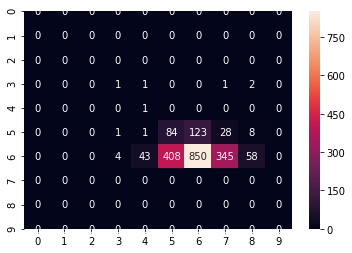

In [9]:
#Initial confusion matrix for white wine

ax = sn.heatmap(conf_matrix_white, annot=True, fmt = 'g')
print("Final Testing Accuracy: ", count_correct/testing_y_values_white.shape[0])

In [11]:
# adjusted target classes

count_correct = 0
conf_matrix_white_new = np.zeros(100).reshape((10,10))
#print(conf_matrix_white)

for i in range(testing_data_white.shape[0]):
    out = tree_white.infer(testing_data_white[i])
    x = int(out)
    y = int(testing_y_values_white[i,class_problem])
    conf_matrix_white_new[x,y] = conf_matrix_white_new[x,y]+1
    is_correct = out == testing_y_values_white[i,class_problem]
    is_correct1 = out == testing_y_values_white[i,class_problem]+1
    is_correct2 = out == testing_y_values_white[i,class_problem]-1
    print('Actual data class: {}'.format(testing_y_values_white[i,class_problem]))
    if is_correct:
        #print('CLASSIFIED CORRECTLY')
        count_correct = count_correct + 1
    elif is_correct1:
        #print('CLASSIFIED CORRECTLY')
        count_correct = count_correct + 1
    elif is_correct2:
        #print('CLASSIFIED CORRECTLY')
        count_correct = count_correct + 1
    else:
        print('CLASSIFIED INCORRECTLY')
    
print('Amount of guesses correct: {}'.format(count_correct))
print('Amount of total guesses: {}'.format(testing_y_values_white.shape[0]))
print("Final Testing Accuracy: ", count_correct/testing_y_values_white.shape[0])

#print(conf_matrix)


[0.49295775 0.10909091 0.1746988  0.15653495 0.11271676 0.14186851
 0.22272727 0.95828601 0.83507853 0.35185185 0.69014085]
1
volatile acidity
0.10909090909090907
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.49295775 0.1746988  0.15653495 0.11271676 0.14186851 0.22272727
 0.95828601 0.83507853 0.35185185 0.69014085]
5
total sulfur dioxide
0.22272727272727272
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.49295775 0.1746988  0.15653495 0.11271676 0.14186851 0.95828601
 0.83507853 0.35185185 0.69014085]
0
fixed acidity
0.49295774647887325
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1746988  0.15653495 0.11271676 0.14186851 0.95828601 0.83507853
 0.35185185 0.69014085]
0
citric acid
0.1746987951807229
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.15653495 0.11271676 0.14186851 0.95828601 0.835

data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.54225352 0.20481928 0.21352584 0.11560694 0.14186851 0.25909091
 0.95895975 0.80366492 0.5462963  0.77464789]
5
total sulfur dioxide
0.2590909090909091
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.54225352 0.20481928 0.21352584 0.11560694 0.14186851 0.95895975
 0.80366492 0.5462963  0.77464789]
0
fixed acidity
0.5422535211267606
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.20481928 0.21352584 0.11560694 0.14186851 0.95895975 0.80366492
 0.5462963  0.77464789]
0
citric acid
0.20481927710843376
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.21352584 0.11560694 0.14186851 0.95895975 0.80366492 0.5462963
 0.77464789]
0
residual sugar
0.21352583586626142
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.1

volatile acidity
0.3454545454545454
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.42957746 0.25301205 0.07598784 0.04624277 0.10726644 0.25681818
 0.95292498 0.82460733 0.28703704 0.87323944]
5
total sulfur dioxide
0.25681818181818183
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.42957746 0.25301205 0.07598784 0.04624277 0.10726644 0.95292498
 0.82460733 0.28703704 0.87323944]
0
fixed acidity
0.4295774647887324
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.25301205 0.07598784 0.04624277 0.10726644 0.95292498 0.82460733
 0.28703704 0.87323944]
0
citric acid
0.25301204819277107
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.07598784 0.04624277 0.10726644 0.95292498 0.82460733 0.28703704
 0.87323944]
0
residual sugar
0.07598784194528875
data point less than split value
sv:  0.32320162107396155
ch

1
volatile acidity
0.1636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47183099 0.1686747  0.1550152  0.11271676 0.10034602 0.26136364
 0.95737165 0.81413613 0.41666667 0.76760563]
5
total sulfur dioxide
0.26136363636363635
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.47183099 0.1686747  0.1550152  0.11271676 0.10034602 0.95737165
 0.81413613 0.41666667 0.76760563]
0
fixed acidity
0.471830985915493
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1686747  0.1550152  0.11271676 0.10034602 0.95737165 0.81413613
 0.41666667 0.76760563]
0
citric acid
0.16867469879518074
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.1550152  0.11271676 0.10034602 0.95737165 0.81413613 0.41666667
 0.76760563]
0
residual sugar
0.15501519756838905
data point less than split value
sv:  0.32320162107396155
c

child sv less:  0.32320162107396155
[0.12537994 0.05780347 0.04844291 0.9563418  0.78272251 0.40740741
 0.8028169 ]
0
residual sugar
0.12537993920972645
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.05780347 0.04844291 0.9563418  0.78272251 0.40740741 0.8028169 ]
1
free sulfur dioxide
0.04844290657439446
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.05780347 0.9563418  0.78272251 0.40740741 0.8028169 ]
1
density
0.9563417967622091
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.05780347 0.78272251 0.40740741 0.8028169 ]
0
chlorides
0.057803468208092484
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.5915493  0.29090909 0.21084337 0.17781155 0.08381503 0.01038062
 0.10454545 0.95708291 0.79057592 0.31481481 0.83098592]
1
volatile acidity
0.2909090909090909

0.47887323943661975
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.22891566 0.12613982 0.1300578  0.17301038 0.95842076 0.82460733
 0.46296296 0.66901408]
0
citric acid
0.22891566265060243
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.12613982 0.1300578  0.17301038 0.95842076 0.82460733 0.46296296
 0.66901408]
0
residual sugar
0.12613981762917933
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.1300578  0.17301038 0.95842076 0.82460733 0.46296296 0.66901408]
1
free sulfur dioxide
0.17301038062283736
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.1300578  0.95842076 0.82460733 0.46296296 0.66901408]
1
density
0.9584207588211514
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.1300578  0.82460733 0.46296296 0.66901408]
0
chlorides
0.13005780346820808


data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.36416185 0.16955017 0.95970086 0.78010471 0.52777778 0.66197183]
1
free sulfur dioxide
0.1695501730103806
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.36416185 0.95970086 0.78010471 0.52777778 0.66197183]
1
density
0.9597008604592967
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.36416185 0.78010471 0.52777778 0.66197183]
0
chlorides
0.36416184971098264
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.3943662  0.18181818 0.39759036 0.1550152  0.12427746 0.26989619
 0.39772727 0.95718878 0.78010471 0.39814815 0.73239437]
1
volatile acidity
0.18181818181818182
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.3943662  0.39759036 0.1550152  0.12427746 0.26989619 0.397

child sv less:  0.34140715109573244
[0.10982659 0.26643599 0.96034572 0.77225131 0.44444444 0.63380282]
1
free sulfur dioxide
0.2664359861591695
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10982659 0.96034572 0.77225131 0.44444444 0.63380282]
1
density
0.9603457236905425
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.10982659 0.77225131 0.44444444 0.63380282]
0
chlorides
0.10982658959537571
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 5.0
[0.51408451 0.25454545 0.25301205 0.01823708 0.09537572 0.10034602
 0.32272727 0.9548307  0.82984293 0.39814815 0.75352113]
1
volatile acidity
0.2545454545454546
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.51408451 0.25301205 0.01823708 0.09537572 0.10034602 0.32272727
 0.9548307  0.82984293 0.39814815 0.75352113]
5
total

 0.38888889 0.83802817]
0
citric acid
0.30722891566265065
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01823708 0.08381503 0.03460208 0.95314636 0.90575916 0.38888889
 0.83802817]
0
residual sugar
0.0182370820668693
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.08381503 0.03460208 0.95314636 0.90575916 0.38888889 0.83802817]
1
free sulfur dioxide
0.03460207612456748
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.08381503 0.95314636 0.90575916 0.38888889 0.83802817]
1
density
0.9531463550790198
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.08381503 0.90575916 0.38888889 0.83802817]
0
chlorides
0.08381502890173409
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.4084507  0.28181818 0.19277108 0.06838906 0.0

0
chlorides
0.0953757225433526
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
[0.47183099 0.12727273 0.30722892 0.06534954 0.08092486 0.19723183
 0.28181818 0.95455158 0.7617801  0.5        0.75352113]
1
volatile acidity
0.1272727272727273
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47183099 0.30722892 0.06534954 0.08092486 0.19723183 0.28181818
 0.95455158 0.7617801  0.5        0.75352113]
5
total sulfur dioxide
0.2818181818181818
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.47183099 0.30722892 0.06534954 0.08092486 0.19723183 0.95455158
 0.7617801  0.5        0.75352113]
0
fixed acidity
0.471830985915493
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.30722892 0.06534954 0.08092486 0.19723183 0.95455158 0.7617801
 0.5        0.75352113]
0
citric acid
0.30

child sv less:  0.6782273603082852
[0.07803468 0.80890052 0.28703704 0.76056338]
0
chlorides
0.07803468208092486
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.43661972 0.22727273 0.25301205 0.12158055 0.1416185  0.183391
 0.46818182 0.95849776 0.82722513 0.43518519 0.64084507]
1
volatile acidity
0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.43661972 0.25301205 0.12158055 0.1416185  0.183391   0.46818182
 0.95849776 0.82722513 0.43518519 0.64084507]
5
total sulfur dioxide
0.4681818181818182
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.43661972 0.25301205 0.12158055 0.1416185  0.183391   0.95849776
 0.82722513 0.43518519 0.64084507]
0
fixed acidity
0.4366197183098592
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.25301205 0.12158055 0.1

sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.48591549 0.2        0.25903614 0.09726444 0.12138728 0.11764706
 0.26136364 0.95567768 0.79842932 0.47222222 0.76056338]
1
volatile acidity
0.19999999999999998
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.48591549 0.25903614 0.09726444 0.12138728 0.11764706 0.26136364
 0.95567768 0.79842932 0.47222222 0.76056338]
5
total sulfur dioxide
0.26136363636363635
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.48591549 0.25903614 0.09726444 0.12138728 0.11764706 0.95567768
 0.79842932 0.47222222 0.76056338]
0
fixed acidity
0.48591549295774655
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.25903614 0.09726444 0.12138728 0.11764706 0.95567768 0.79842932
 0.47222222 0.76056338]
0
citric acid
0.25903614457831325
data point less than split value
sv:  0.666

free sulfur dioxide
0.10380622837370242
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.08381503 0.95279986 0.85078534 0.38888889 0.86619718]
1
density
0.9527998614025294
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.08381503 0.85078534 0.38888889 0.86619718]
0
chlorides
0.08381502890173409
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.50704225 0.36363636 0.22891566 0.03343465 0.0867052  0.1384083
 0.24772727 0.95357947 0.85602094 0.42592593 0.88732394]
1
volatile acidity
0.36363636363636365
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.50704225 0.22891566 0.03343465 0.0867052  0.1384083  0.24772727
 0.95357947 0.85602094 0.42592593 0.88732394]
5
total sulfur dioxide
0.24772727272727274
data point less than split value
sv:  0.7013257575757574
child sv les

[0.12427746 0.09688581 0.95632255 0.80104712 0.53703704 0.6971831 ]
1
free sulfur dioxide
0.09688581314878893
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12427746 0.95632255 0.80104712 0.53703704 0.6971831 ]
1
density
0.9563225471135152
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12427746 0.80104712 0.53703704 0.6971831 ]
0
chlorides
0.12427745664739882
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.53521127 0.15454545 0.27710843 0.01367781 0.10404624 0.21799308
 0.33409091 0.95407034 0.79057592 0.37962963 0.75352113]
1
volatile acidity
0.15454545454545454
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.53521127 0.27710843 0.01367781 0.10404624 0.21799308 0.33409091
 0.95407034 0.79057592 0.37962963 0.75352113]
5
total sulfur dioxide
0.3340909090909091

 0.82198953 0.51851852 0.8028169 ]
0
fixed acidity
0.4366197183098592
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.24698795 0.01519757 0.11560694 0.05882353 0.95274211 0.82198953
 0.51851852 0.8028169 ]
0
citric acid
0.2469879518072289
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01519757 0.11560694 0.05882353 0.95274211 0.82198953 0.51851852
 0.8028169 ]
0
residual sugar
0.015197568389057751
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11560694 0.05882353 0.95274211 0.82198953 0.51851852 0.8028169 ]
1
free sulfur dioxide
0.058823529411764705
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11560694 0.95274211 0.82198953 0.51851852 0.8028169 ]
1
density
0.9527421124564477
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.11560694 0.82198953 0.51

child sv less:  0.7652582159624413
[0.45070423 0.22891566 0.13829787 0.12716763 0.12110727 0.9559953
 0.77748691 0.27777778 0.77464789]
0
fixed acidity
0.45070422535211274
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.22891566 0.13829787 0.12716763 0.12110727 0.9559953  0.77748691
 0.27777778 0.77464789]
0
citric acid
0.22891566265060243
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.13829787 0.12716763 0.12110727 0.9559953  0.77748691 0.27777778
 0.77464789]
0
residual sugar
0.13829787234042554
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.12716763 0.12110727 0.9559953  0.77748691 0.27777778 0.77464789]
1
free sulfur dioxide
0.12110726643598616
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12716763 0.9559953  0.77748691 0.27777778 0.77464789]
1
density
0.9559953030857187
data point less th

0
chlorides
0.13005780346820808
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.45070423 0.19090909 0.20481928 0.24392097 0.11560694 0.19377163
 0.32272727 0.95938324 0.81413613 0.35185185 0.74647887]
1
volatile acidity
0.1909090909090909
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45070423 0.20481928 0.24392097 0.11560694 0.19377163 0.32272727
 0.95938324 0.81413613 0.35185185 0.74647887]
5
total sulfur dioxide
0.32272727272727275
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45070423 0.20481928 0.24392097 0.11560694 0.19377163 0.95938324
 0.81413613 0.35185185 0.74647887]
0
fixed acidity
0.45070422535211274
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.20481928 0.24392097 0.11560694 0.19377163 0.95938324 0.81413613
 0.35185185 0.74647887]
0
citric acid

 0.62962963 0.84507042]
0
citric acid
0.20481927710843376
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01671733 0.10693642 0.14186851 0.95276136 0.78795812 0.62962963
 0.84507042]
0
residual sugar
0.016717325227963528
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10693642 0.14186851 0.95276136 0.78795812 0.62962963 0.84507042]
1
free sulfur dioxide
0.14186851211072665
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10693642 0.95276136 0.78795812 0.62962963 0.84507042]
1
density
0.9527613621051416
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10693642 0.78795812 0.62962963 0.84507042]
0
chlorides
0.1069364161849711
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.57746479 0.27272727 0.26506024 0.18844985 0.

 0.34259259 0.69014085]
0
citric acid
0.1746987951807229
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.03799392 0.17052023 0.12802768 0.95601455 0.80890052 0.34259259
 0.69014085]
0
residual sugar
0.037993920972644375
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.17052023 0.12802768 0.95601455 0.80890052 0.34259259 0.69014085]
1
free sulfur dioxide
0.12802768166089964
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.17052023 0.95601455 0.80890052 0.34259259 0.69014085]
1
density
0.9560145527344125
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.17052023 0.80890052 0.34259259 0.69014085]
0
chlorides
0.17052023121387283
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.46478873 0.30909091 0.14457831 0.05015198 0.

0.12138728323699421
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.52112676 0.17272727 0.18674699 0.22036474 0.1300578  0.1349481
 0.43863636 0.96113496 0.81151832 0.46296296 0.64788732]
1
volatile acidity
0.1727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.52112676 0.18674699 0.22036474 0.1300578  0.1349481  0.43863636
 0.96113496 0.81151832 0.46296296 0.64788732]
5
total sulfur dioxide
0.43863636363636366
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.52112676 0.18674699 0.22036474 0.1300578  0.1349481  0.96113496
 0.81151832 0.46296296 0.64788732]
0
fixed acidity
0.5211267605633804
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18674699 0.22036474 0.1300578  0.1349481  0.96113496 0.81151832
 0.46296296 0.64788732]
0
citric acid
0.18674698795

sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45070423 0.1746988  0.02735562 0.12716763 0.07266436 0.26136364
 0.95445533 0.81151832 0.35185185 0.71830986]
5
total sulfur dioxide
0.26136363636363635
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45070423 0.1746988  0.02735562 0.12716763 0.07266436 0.95445533
 0.81151832 0.35185185 0.71830986]
0
fixed acidity
0.45070422535211274
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1746988  0.02735562 0.12716763 0.07266436 0.95445533 0.81151832
 0.35185185 0.71830986]
0
citric acid
0.1746987951807229
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.02735562 0.12716763 0.07266436 0.95445533 0.81151832 0.35185185
 0.71830986]
0
residual sugar
0.02735562310030395
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.12716763 0.07266436 0.95445533 0

0
citric acid
0.2108433734939759
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.02735562 0.11560694 0.10034602 0.95248224 0.7617801  0.52777778
 0.84507042]
0
residual sugar
0.02735562310030395
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11560694 0.10034602 0.95248224 0.7617801  0.52777778 0.84507042]
1
free sulfur dioxide
0.10034602076124567
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11560694 0.95248224 0.7617801  0.52777778 0.84507042]
1
density
0.9524822421990798
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.11560694 0.7617801  0.52777778 0.84507042]
0
chlorides
0.11560693641618497
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
[0.51408451 0.22727273 0.1686747  0.02279635 0.12427746 0.06574394
 0.25

child sv less:  0.6666666666666666
[0.19879518 0.01671733 0.12138728 0.04844291 0.95297311 0.81151832
 0.34259259 0.83098592]
0
citric acid
0.1987951807228916
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01671733 0.12138728 0.04844291 0.95297311 0.81151832 0.34259259
 0.83098592]
0
residual sugar
0.016717325227963528
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.12138728 0.04844291 0.95297311 0.81151832 0.34259259 0.83098592]
1
free sulfur dioxide
0.04844290657439446
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12138728 0.95297311 0.81151832 0.34259259 0.83098592]
1
density
0.9529731082407747
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12138728 0.81151832 0.34259259 0.83098592]
0
chlorides
0.12138728323699421
data point less than split value
sv:  0.6782273603082852
child sv less:  None

child sv less:  0.6666666666666666
[0.13253012 0.08662614 0.13583815 0.14532872 0.95613005 0.83246073
 0.50925926 0.6971831 ]
0
citric acid
0.13253012048192772
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.08662614 0.13583815 0.14532872 0.95613005 0.83246073 0.50925926
 0.6971831 ]
0
residual sugar
0.08662613981762919
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13583815 0.14532872 0.95613005 0.83246073 0.50925926 0.6971831 ]
1
free sulfur dioxide
0.1453287197231834
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13583815 0.95613005 0.83246073 0.50925926 0.6971831 ]
1
density
0.956130050626576
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13583815 0.83246073 0.50925926 0.6971831 ]
0
chlorides
0.13583815028901733
data point less than split value
sv:  0.6782273603082852
child sv less:  None
C

sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1686747  0.17097264 0.09248555 0.10726644 0.95497507 0.79057592
 0.35185185 0.87323944]
0
citric acid
0.16867469879518074
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.17097264 0.09248555 0.10726644 0.95497507 0.79057592 0.35185185
 0.87323944]
0
residual sugar
0.1709726443768997
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.09248555 0.10726644 0.95497507 0.79057592 0.35185185 0.87323944]
1
free sulfur dioxide
0.10726643598615918
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.09248555 0.95497507 0.79057592 0.35185185 0.87323944]
1
density
0.9549750717049413
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.09248555 0.79057592 0.35185185 0.87323944]
0
chlorides
0.09248554913294797
data point less than split value
sv:  0.67822736030828

sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.14457831 0.03191489 0.0982659  0.16955017 0.95172188 0.78010471
 0.39814815 0.92957746]
0
citric acid
0.14457831325301204
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.03191489 0.0982659  0.16955017 0.95172188 0.78010471 0.39814815
 0.92957746]
0
residual sugar
0.03191489361702128
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.0982659  0.16955017 0.95172188 0.78010471 0.39814815 0.92957746]
1
free sulfur dioxide
0.1695501730103806
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.0982659  0.95172188 0.78010471 0.39814815 0.92957746]
1
density
0.9517218810756704
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.0982659  0.78010471 0.39814815 0.92957746]
0
chlorides
0.09826589595375722
data point less than split value
sv:  0.67822736030828

sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.48591549 0.18072289 0.12613982 0.07514451 0.12802768 0.95419546
 0.78272251 0.35185185 0.86619718]
0
fixed acidity
0.48591549295774655
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18072289 0.12613982 0.07514451 0.12802768 0.95419546 0.78272251
 0.35185185 0.86619718]
0
citric acid
0.18072289156626506
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.12613982 0.07514451 0.12802768 0.95419546 0.78272251 0.35185185
 0.86619718]
0
residual sugar
0.12613981762917933
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.07514451 0.12802768 0.95419546 0.78272251 0.35185185 0.86619718]
1
free sulfur dioxide
0.12802768166089964
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.07514451 0.95419546 0.78272251 0.35185185 0.86619718]
1
density
0.9541954609

[0.10693642 0.08650519 0.95543706 0.85078534 0.4537037  0.78169014]
1
free sulfur dioxide
0.08650519031141868
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10693642 0.95543706 0.85078534 0.4537037  0.78169014]
1
density
0.9554370632735951
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10693642 0.85078534 0.4537037  0.78169014]
0
chlorides
0.1069364161849711
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.42957746 0.3        0.19277108 0.11854103 0.15028902 0.1799308
 0.41590909 0.95918112 0.88743455 0.60185185 0.66901408]
1
volatile acidity
0.3
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.42957746 0.19277108 0.11854103 0.15028902 0.1799308  0.41590909
 0.95918112 0.88743455 0.60185185 0.66901408]
5
total sulfur dioxide
0.4159090909090909
data point less t

data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13583815 0.16262976 0.96195307 0.87434555 0.72222222 0.64084507]
1
free sulfur dioxide
0.16262975778546712
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13583815 0.96195307 0.87434555 0.72222222 0.64084507]
1
density
0.9619530693564842
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.13583815 0.87434555 0.72222222 0.64084507]
0
chlorides
0.13583815028901733
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 6.0
[0.4084507  0.21818182 0.15662651 0.15273556 0.11271676 0.21799308
 0.36818182 0.95646692 0.87172775 0.46296296 0.78873239]
1
volatile acidity
0.21818181818181814
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.4084507  0.15662651 0.15273556 0.11271676 0.21799308 0.36

0.14285714285714288
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.16473988 0.11764706 0.95818976 0.82460733 0.40740741 0.73239437]
1
free sulfur dioxide
0.11764705882352941
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.16473988 0.95818976 0.82460733 0.40740741 0.73239437]
1
density
0.9581897630368246
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.16473988 0.82460733 0.40740741 0.73239437]
0
chlorides
0.16473988439306358
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.42253521 0.15454545 0.1746988  0.14741641 0.12716763 0.11418685
 0.22272727 0.95801652 0.81675393 0.33333333 0.64788732]
1
volatile acidity
0.15454545454545454
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.42253521 0.1746988  0.14741641 0.1271

 0.9084507 ]
0
residual sugar
0.030395136778115502
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11560694 0.13148789 0.95285761 0.84816754 0.41666667 0.9084507 ]
1
free sulfur dioxide
0.1314878892733564
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11560694 0.95285761 0.84816754 0.41666667 0.9084507 ]
1
density
0.9528576103486112
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.11560694 0.84816754 0.41666667 0.9084507 ]
0
chlorides
0.11560693641618497
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.46478873 0.21818182 0.1626506  0.15653495 0.13583815 0.18685121
 0.49772727 0.95999923 0.79581152 0.41666667 0.61971831]
1
volatile acidity
0.21818181818181814
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.4647887

citric acid
0.1987951807228916
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01823708 0.11271676 0.05536332 0.9532426  0.80366492 0.36111111
 0.82394366]
0
residual sugar
0.0182370820668693
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11271676 0.05536332 0.9532426  0.80366492 0.36111111 0.82394366]
1
free sulfur dioxide
0.05536332179930796
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11271676 0.9532426  0.80366492 0.36111111 0.82394366]
1
density
0.9532426033224893
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.11271676 0.80366492 0.36111111 0.82394366]
0
chlorides
0.11271676300578033
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.45774648 0.2        0.11445783 0.01671733 0.1849711  0.12456747
 0.43409

[0.08959538 0.88481675 0.62962963 0.78873239]
0
chlorides
0.08959537572254335
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
[0.52816901 0.3        0.1686747  0.07446809 0.12138728 0.07266436
 0.35227273 0.95656317 0.87958115 0.52777778 0.76760563]
1
volatile acidity
0.3
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.52816901 0.1686747  0.07446809 0.12138728 0.07266436 0.35227273
 0.95656317 0.87958115 0.52777778 0.76760563]
5
total sulfur dioxide
0.3522727272727273
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.52816901 0.1686747  0.07446809 0.12138728 0.07266436 0.95656317
 0.87958115 0.52777778 0.76760563]
0
fixed acidity
0.5281690140845071
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1686747  0.07446809 0.12138728 0.07266436 0.95656317 0.87958115
 0.52777

child sv less:  0.9598484410992834
[0.10982659 0.95423396 0.84554974 0.39814815 0.94366197]
1
density
0.9542339602302257
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10982659 0.84554974 0.39814815 0.94366197]
0
chlorides
0.10982658959537571
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
[0.42253521 0.20909091 0.09036145 0.14741641 0.13872832 0.34948097
 0.47045455 0.95835339 0.79842932 0.27777778 0.64084507]
1
volatile acidity
0.20909090909090908
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.42253521 0.09036145 0.14741641 0.13872832 0.34948097 0.47045455
 0.95835339 0.79842932 0.27777778 0.64084507]
5
total sulfur dioxide
0.47045454545454546
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.42253521 0.09036145 0.14741641 0.13872832 0.34948097 0.95835339
 0.7984

0.1094224924012158
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13294798 0.15570934 0.95815126 0.82198953 0.49074074 0.68309859]
1
free sulfur dioxide
0.15570934256055363
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13294798 0.95815126 0.82198953 0.49074074 0.68309859]
1
density
0.9581512637394368
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13294798 0.82198953 0.49074074 0.68309859]
0
chlorides
0.1329479768786127
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.45070423 0.25454545 0.26506024 0.10790274 0.13872832 0.16955017
 0.40681818 0.95793952 0.82460733 0.44444444 0.64788732]
1
volatile acidity
0.2545454545454546
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45070423 0.26506024 0.10790274 0.1387283

child sv less:  0.34140715109573244
[0.12716763 0.1349481  0.96108684 0.84816754 0.44444444 0.63380282]
1
free sulfur dioxide
0.13494809688581316
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12716763 0.96108684 0.84816754 0.44444444 0.63380282]
1
density
0.9610868351652583
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.12716763 0.84816754 0.44444444 0.63380282]
0
chlorides
0.12716763005780346
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 6.0
[0.40140845 0.2        0.13253012 0.25303951 0.12716763 0.1349481
 0.25       0.96108684 0.84816754 0.44444444 0.63380282]
1
volatile acidity
0.19999999999999998
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.40140845 0.13253012 0.25303951 0.12716763 0.1349481  0.25
 0.96108684 0.84816754 0.44444444 0.63380282]
5
total sulf

free sulfur dioxide
0.07958477508650519
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.14450867 0.95668829 0.7486911  0.32407407 0.63380282]
1
density
0.9566882904386994
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.14450867 0.7486911  0.32407407 0.63380282]
0
chlorides
0.1445086705202312
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.46478873 0.58181818 0.1686747  0.0668693  0.09248555 0.06574394
 0.17727273 0.9532041  0.81413613 0.57407407 0.9084507 ]
1
volatile acidity
0.5818181818181818
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.46478873 0.1686747  0.0668693  0.09248555 0.06574394 0.17727273
 0.9532041  0.81413613 0.57407407 0.9084507 ]
5
total sulfur dioxide
0.17727272727272728
data point less than split value
sv:  0.7013257575757574
child sv less

sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.2218845  0.13872832 0.12110727 0.95940249 0.82198953 0.51851852
 0.74647887]
0
residual sugar
0.22188449848024316
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13872832 0.12110727 0.95940249 0.82198953 0.51851852 0.74647887]
1
free sulfur dioxide
0.12110726643598616
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13872832 0.95940249 0.82198953 0.51851852 0.74647887]
1
density
0.959402490904541
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13872832 0.82198953 0.51851852 0.74647887]
0
chlorides
0.13872832369942195
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.51408451 0.20909091 0.1626506  0.03951368 0.10115607 0.1349481
 0.27272727 0.95418584 0.79581152 0.5462963  0.79577465]
1
volatile acidi

 0.40740741 0.75352113]
0
citric acid
0.16265060240963858
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.05927052 0.12427746 0.1799308  0.95480182 0.87696335 0.40740741
 0.75352113]
0
residual sugar
0.05927051671732523
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.12427746 0.1799308  0.95480182 0.87696335 0.40740741 0.75352113]
1
free sulfur dioxide
0.17993079584775087
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12427746 0.95480182 0.87696335 0.40740741 0.75352113]
1
density
0.9548018248666963
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12427746 0.87696335 0.40740741 0.75352113]
0
chlorides
0.12427745664739882
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
[0.3943662  0.25454545 0.1686747  0.06382979 0.

data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.1337386  0.16184971 0.12110727 0.958902   0.79581152 0.43518519
 0.66197183]
0
residual sugar
0.13373860182370823
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.16184971 0.12110727 0.958902   0.79581152 0.43518519 0.66197183]
1
free sulfur dioxide
0.12110726643598616
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.16184971 0.958902   0.79581152 0.43518519 0.66197183]
1
density
0.9589020000384992
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.16184971 0.79581152 0.43518519 0.66197183]
0
chlorides
0.16184971098265893
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.47887324 0.12727273 0.10843373 0.0212766  0.13583815 0.10380623
 0.20454545 0.95443608 0.85602094 0.5 

sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.33815029 0.21107266 0.9572754  0.84816754 0.39814815 0.66901408]
1
free sulfur dioxide
0.21107266435986158
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.33815029 0.9572754  0.84816754 0.39814815 0.66901408]
1
density
0.9572754047238637
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.33815029 0.84816754 0.39814815 0.66901408]
0
chlorides
0.338150289017341
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.45070423 0.34545455 0.12048193 0.08054711 0.33815029 0.19723183
 0.41136364 0.9572754  0.84816754 0.39814815 0.66901408]
1
volatile acidity
0.3454545454545454
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45070423 0.12048193 0.08054711 0.33815029 0.19723183 0.41136364
 0.9572754  0.84816754 0.3981

0
fixed acidity
0.6126760563380281
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.20481928 0.07294833 0.05202312 0.07958478 0.95741978 0.81675393
 0.4537037  0.78873239]
0
citric acid
0.20481927710843376
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.07294833 0.05202312 0.07958478 0.95741978 0.81675393 0.4537037
 0.78873239]
0
residual sugar
0.0729483282674772
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.05202312 0.07958478 0.95741978 0.81675393 0.4537037  0.78873239]
1
free sulfur dioxide
0.07958477508650519
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.05202312 0.95741978 0.81675393 0.4537037  0.78873239]
1
density
0.9574197770890681
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.05202312 0.81675393 0.4537037  0.78873239]
0
chlorides
0.05202

 0.82722513 0.52777778 0.91549296]
0
fixed acidity
0.4084507042253521
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1686747  0.06534954 0.09248555 0.15916955 0.95233787 0.82722513
 0.52777778 0.91549296]
0
citric acid
0.16867469879518074
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.06534954 0.09248555 0.15916955 0.95233787 0.82722513 0.52777778
 0.91549296]
0
residual sugar
0.06534954407294832
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.09248555 0.15916955 0.95233787 0.82722513 0.52777778 0.91549296]
1
free sulfur dioxide
0.15916955017301038
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.09248555 0.95233787 0.82722513 0.52777778 0.91549296]
1
density
0.9523378698338755
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.09248555 0.82722513 0.527

fixed acidity
0.5
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1626506  0.14589666 0.10693642 0.06574394 0.95713103 0.79581152
 0.34259259 0.73943662]
0
citric acid
0.16265060240963858
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.14589666 0.10693642 0.06574394 0.95713103 0.79581152 0.34259259
 0.73943662]
0
residual sugar
0.1458966565349544
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.10693642 0.06574394 0.95713103 0.79581152 0.34259259 0.73943662]
1
free sulfur dioxide
0.0657439446366782
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10693642 0.95713103 0.79581152 0.34259259 0.73943662]
1
density
0.9571310323586595
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10693642 0.79581152 0.34259259 0.73943662]
0
chlorides
0.1069364161849711
data 

child sv less:  0.32320162107396155
[0.12158055 0.08092486 0.11418685 0.95443608 0.81937173 0.58333333
 0.88732394]
0
residual sugar
0.12158054711246201
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.08092486 0.11418685 0.95443608 0.81937173 0.58333333 0.88732394]
1
free sulfur dioxide
0.11418685121107267
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.08092486 0.95443608 0.81937173 0.58333333 0.88732394]
1
density
0.9544360815415118
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.08092486 0.81937173 0.58333333 0.88732394]
0
chlorides
0.08092485549132947
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
[0.50704225 0.20909091 0.15060241 0.28571429 0.24566474 0.06574394
 0.25227273 0.96290593 0.81151832 0.47222222 0.61267606]
1
volatile acidity
0.20909090909090908

child sv less:  0.32320162107396155
[0.15805471 0.1416185  0.15570934 0.96011473 0.81675393 0.47222222
 0.61971831]
0
residual sugar
0.15805471124620063
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.1416185  0.15570934 0.96011473 0.81675393 0.47222222 0.61971831]
1
free sulfur dioxide
0.15570934256055363
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.1416185  0.96011473 0.81675393 0.47222222 0.61971831]
1
density
0.9601147279062157
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.1416185  0.81675393 0.47222222 0.61971831]
0
chlorides
0.14161849710982657
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 5.0
[0.59859155 0.16363636 0.18072289 0.01671733 0.08092486 0.11764706
 0.21590909 0.95547556 0.7408377  0.33333333 0.70422535]
1
volatile acidity
0.1636363636363636


sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.02431611 0.08381503 0.1349481  0.95241487 0.84031414 0.62962963
 0.88028169]
0
residual sugar
0.024316109422492405
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.08381503 0.1349481  0.95241487 0.84031414 0.62962963 0.88028169]
1
free sulfur dioxide
0.13494809688581316
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.08381503 0.95241487 0.84031414 0.62962963 0.88028169]
1
density
0.9524148684286511
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.08381503 0.84031414 0.62962963 0.88028169]
0
chlorides
0.08381502890173409
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.42253521 0.19090909 0.1746988  0.19908815 0.12138728 0.09688581
 0.28409091 0.96186645 0.88743455 0.41666667 0.6056338 ]
1
volatile ac

 0.63380282]
0
residual sugar
0.16109422492401215
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.20231214 0.23183391 0.95915225 0.7565445  0.38888889 0.63380282]
1
free sulfur dioxide
0.23183391003460208
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.20231214 0.95915225 0.7565445  0.38888889 0.63380282]
1
density
0.9591522454715201
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.20231214 0.7565445  0.38888889 0.63380282]
0
chlorides
0.2023121387283237
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.43661972 0.21818182 0.15060241 0.1899696  0.15895954 0.16262976
 0.30454545 0.96015323 0.86387435 0.47222222 0.63380282]
1
volatile acidity
0.21818181818181814
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.43661972

 0.29545455 0.95240524 0.88743455 0.71296296 0.94366197]
1
volatile acidity
0.41818181818181815
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.38028169 0.09036145 0.03191489 0.07514451 0.10034602 0.29545455
 0.95240524 0.88743455 0.71296296 0.94366197]
5
total sulfur dioxide
0.29545454545454547
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.38028169 0.09036145 0.03191489 0.07514451 0.10034602 0.95240524
 0.88743455 0.71296296 0.94366197]
0
fixed acidity
0.3802816901408451
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.09036145 0.03191489 0.07514451 0.10034602 0.95240524 0.88743455
 0.71296296 0.94366197]
0
citric acid
0.09036144578313253
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.03191489 0.07514451 0.10034602 0.95240524 0.88743455 0.71296296
 0.94366197]
0
residual sugar
0.03191489361702128


[0.05202312 0.95403184 0.84816754 0.2962963  0.85915493]
1
density
0.9540318389189398
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.05202312 0.84816754 0.2962963  0.85915493]
0
chlorides
0.05202312138728324
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.48591549 0.3        0.18674699 0.11702128 0.11560694 0.10034602
 0.30681818 0.95503282 0.81413613 0.52777778 0.86619718]
1
volatile acidity
0.3
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.48591549 0.18674699 0.11702128 0.11560694 0.10034602 0.30681818
 0.95503282 0.81413613 0.52777778 0.86619718]
5
total sulfur dioxide
0.3068181818181818
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.48591549 0.18674699 0.11702128 0.11560694 0.10034602 0.95503282
 0.81413613 0.52777778 0.86619718]
0
fixed acidity
0.485915

 0.83246073 0.44444444 0.66901408]
0
fixed acidity
0.45070422535211274
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.27108434 0.12613982 0.14450867 0.1799308  0.95815126 0.83246073
 0.44444444 0.66901408]
0
citric acid
0.27108433734939763
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.12613982 0.14450867 0.1799308  0.95815126 0.83246073 0.44444444
 0.66901408]
0
residual sugar
0.12613981762917933
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.14450867 0.1799308  0.95815126 0.83246073 0.44444444 0.66901408]
1
free sulfur dioxide
0.17993079584775087
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.14450867 0.95815126 0.83246073 0.44444444 0.66901408]
1
density
0.9581512637394368
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.14450867 0.83246073 0.44

[0.16473988 0.07266436 0.95455158 0.79842932 0.48148148 0.76760563]
1
free sulfur dioxide
0.0726643598615917
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.16473988 0.95455158 0.79842932 0.48148148 0.76760563]
1
density
0.9545515794336754
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.16473988 0.79842932 0.48148148 0.76760563]
0
chlorides
0.16473988439306358
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.50704225 0.15454545 0.20481928 0.09726444 0.12138728 0.05536332
 0.25227273 0.95553331 0.78272251 0.37037037 0.76056338]
1
volatile acidity
0.15454545454545454
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.50704225 0.20481928 0.09726444 0.12138728 0.05536332 0.25227273
 0.95553331 0.78272251 0.37037037 0.76056338]
5
total sulfur dioxide
0.25227272727272726

child sv less:  0.32320162107396155
[0.1337386  0.1300578  0.09688581 0.95795877 0.81675393 0.5462963
 0.6971831 ]
0
residual sugar
0.13373860182370823
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.1300578  0.09688581 0.95795877 0.81675393 0.5462963  0.6971831 ]
1
free sulfur dioxide
0.09688581314878893
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.1300578  0.95795877 0.81675393 0.5462963  0.6971831 ]
1
density
0.9579587672524976
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.1300578  0.81675393 0.5462963  0.6971831 ]
0
chlorides
0.13005780346820808
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.44366197 0.36363636 0.14457831 0.0775076  0.10404624 0.14878893
 0.29772727 0.95464783 0.84816754 0.40740741 0.79577465]
1
volatile acidity
0.36363636363636365


sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.47887324 0.11445783 0.05319149 0.24855491 0.10380623 0.95574506
 0.7408377  0.40740741 0.67605634]
0
fixed acidity
0.47887323943661975
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.11445783 0.05319149 0.24855491 0.10380623 0.95574506 0.7408377
 0.40740741 0.67605634]
0
citric acid
0.11445783132530121
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.05319149 0.24855491 0.10380623 0.95574506 0.7408377  0.40740741
 0.67605634]
0
residual sugar
0.05319148936170213
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.24855491 0.10380623 0.95574506 0.7408377  0.40740741 0.67605634]
1
free sulfur dioxide
0.10380622837370242
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.24855491 0.95574506 0.7408377  0.40740741 0.67605634]
1
density
0.95574505765

data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.06647399 0.06920415 0.95537931 0.87434555 0.32407407 0.88732394]
1
free sulfur dioxide
0.06920415224913495
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.06647399 0.95537931 0.87434555 0.32407407 0.88732394]
1
density
0.9553793143275136
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.06647399 0.87434555 0.32407407 0.88732394]
0
chlorides
0.06647398843930635
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.45070423 0.29090909 0.13855422 0.24620061 0.15895954 0.12456747
 0.4        0.96113496 0.85340314 0.5        0.64084507]
1
volatile acidity
0.2909090909090909
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45070423 0.13855422 0.24620061 0.15895954 0.12456747 0.4
 

[0.1300578  0.82722513 0.31481481 0.71126761]
0
chlorides
0.13005780346820808
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.45774648 0.24545455 0.11445783 0.10030395 0.1300578  0.33910035
 0.39772727 0.95636105 0.82722513 0.31481481 0.71126761]
1
volatile acidity
0.24545454545454545
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45774648 0.11445783 0.10030395 0.1300578  0.33910035 0.39772727
 0.95636105 0.82722513 0.31481481 0.71126761]
5
total sulfur dioxide
0.3977272727272727
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45774648 0.11445783 0.10030395 0.1300578  0.33910035 0.95636105
 0.82722513 0.31481481 0.71126761]
0
fixed acidity
0.45774647887323944
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.11445783 0.10030395 0.1300578  0.33910035 0.95636105 0.

sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.42253521 0.14457831 0.27051672 0.13583815 0.14532872 0.96148145
 0.81151832 0.41666667 0.62676056]
0
fixed acidity
0.4225352112676057
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.14457831 0.27051672 0.13583815 0.14532872 0.96148145 0.81151832
 0.41666667 0.62676056]
0
citric acid
0.14457831325301204
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.27051672 0.13583815 0.14532872 0.96148145 0.81151832 0.41666667
 0.62676056]
0
residual sugar
0.270516717325228
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13583815 0.14532872 0.96148145 0.81151832 0.41666667 0.62676056]
1
free sulfur dioxide
0.1453287197231834
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13583815 0.96148145 0.81151832 0.41666667 0.62676056]
1
density
0.96148145296348

child sv less:  0.9598484410992834
[0.06069364 0.95305973 0.85340314 0.41666667 0.86619718]
1
density
0.9530597316598972
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.06069364 0.85340314 0.41666667 0.86619718]
0
chlorides
0.06069364161849711
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.47183099 0.23636364 0.1746988  0.11702128 0.10982659 0.1384083
 0.40681818 0.9574679  0.84554974 0.51851852 0.73239437]
1
volatile acidity
0.23636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47183099 0.1746988  0.11702128 0.10982659 0.1384083  0.40681818
 0.9574679  0.84554974 0.51851852 0.73239437]
5
total sulfur dioxide
0.4068181818181818
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.47183099 0.1746988  0.11702128 0.10982659 0.1384083  0.9574679
 0.8455497

0
chlorides
0.1069364161849711
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
[0.5        0.33636364 0.18072289 0.09422492 0.11560694 0.16955017
 0.31590909 0.95305973 0.82984293 0.25       0.95774648]
1
volatile acidity
0.3363636363636363
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.5        0.18072289 0.09422492 0.11560694 0.16955017 0.31590909
 0.95305973 0.82984293 0.25       0.95774648]
5
total sulfur dioxide
0.3159090909090909
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.5        0.18072289 0.09422492 0.11560694 0.16955017 0.95305973
 0.82984293 0.25       0.95774648]
0
fixed acidity
0.5
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18072289 0.09422492 0.11560694 0.16955017 0.95305973 0.82984293
 0.25       0.95774648]
0
citric acid
0.180722891566265

[0.16184971 0.83507853 0.30555556 0.6971831 ]
0
chlorides
0.16184971098265893
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.45774648 0.2        0.18674699 0.05927052 0.13294798 0.05882353
 0.24090909 0.95380084 0.82460733 0.28703704 0.80985915]
1
volatile acidity
0.19999999999999998
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45774648 0.18674699 0.05927052 0.13294798 0.05882353 0.24090909
 0.95380084 0.82460733 0.28703704 0.80985915]
5
total sulfur dioxide
0.2409090909090909
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45774648 0.18674699 0.05927052 0.13294798 0.05882353 0.95380084
 0.82460733 0.28703704 0.80985915]
0
fixed acidity
0.45774647887323944
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18674699 0.05927052 0.13294798 0.05882353 0.95380084 0.

1
density
0.9544553311902058
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.15317919 0.83246073 0.43518519 0.78169014]
0
chlorides
0.15317919075144507
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.45070423 0.18181818 0.09036145 0.10030395 0.13294798 0.0899654
 0.25681818 0.95678454 0.78272251 0.53703704 0.6971831 ]
1
volatile acidity
0.18181818181818182
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45070423 0.09036145 0.10030395 0.13294798 0.0899654  0.25681818
 0.95678454 0.78272251 0.53703704 0.6971831 ]
5
total sulfur dioxide
0.25681818181818183
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45070423 0.09036145 0.10030395 0.13294798 0.0899654  0.95678454
 0.78272251 0.53703704 0.6971831 ]
0
fixed acidity
0.45070422535211274
data point less than split va

 0.7539267  0.43518519 0.78873239]
0
fixed acidity
0.49295774647887325
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18072289 0.03951368 0.12427746 0.11764706 0.95330998 0.7539267
 0.43518519 0.78873239]
0
citric acid
0.18072289156626506
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.03951368 0.12427746 0.11764706 0.95330998 0.7539267  0.43518519
 0.78873239]
0
residual sugar
0.03951367781155016
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.12427746 0.11764706 0.95330998 0.7539267  0.43518519 0.78873239]
1
free sulfur dioxide
0.11764705882352941
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12427746 0.95330998 0.7539267  0.43518519 0.78873239]
1
density
0.9533099770929181
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12427746 0.7539267  0.435

sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.11550152 0.1416185  0.12110727 0.95813201 0.82722513 0.5
 0.66197183]
0
residual sugar
0.11550151975683891
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.1416185  0.12110727 0.95813201 0.82722513 0.5        0.66197183]
1
free sulfur dioxide
0.12110726643598616
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.1416185  0.95813201 0.82722513 0.5        0.66197183]
1
density
0.9581320140907428
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.1416185  0.82722513 0.5        0.66197183]
0
chlorides
0.14161849710982657
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 4.0
CLASSIFIED INCORRECTLY
[0.45774648 0.26363636 0.31325301 0.12006079 0.1416185  0.12110727
 0.43636364 0.95816089 0.82722513 0.47222222 0.66901408

density
0.957227280602129
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12716763 0.83769634 0.34259259 0.6971831 ]
0
chlorides
0.12716763005780346
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.51408451 0.20909091 0.24698795 0.2218845  0.13872832 0.25259516
 0.50681818 0.96116383 0.82722513 0.65740741 0.66197183]
1
volatile acidity
0.20909090909090908
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.51408451 0.24698795 0.2218845  0.13872832 0.25259516 0.50681818
 0.96116383 0.82722513 0.65740741 0.66197183]
5
total sulfur dioxide
0.5068181818181818
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.51408451 0.24698795 0.2218845  0.13872832 0.25259516 0.96116383
 0.82722513 0.65740741 0.66197183]
0
fixed acidity
0.5140845070422535
data point less than split value


1
density
0.9516833817782824
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10693642 0.79581152 0.53703704 0.88732394]
0
chlorides
0.1069364161849711
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.45070423 0.22727273 0.34337349 0.01519757 0.17919075 0.07266436
 0.27727273 0.95514832 0.78534031 0.37037037 0.66901408]
1
volatile acidity
0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45070423 0.34337349 0.01519757 0.17919075 0.07266436 0.27727273
 0.95514832 0.78534031 0.37037037 0.66901408]
5
total sulfur dioxide
0.2772727272727273
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45070423 0.34337349 0.01519757 0.17919075 0.07266436 0.95514832
 0.78534031 0.37037037 0.66901408]
0
fixed acidity
0.45070422535211274
data point less than split val

[0.09537572 0.95984523 0.83246073 0.73148148 0.73239437]
1
density
0.959845232824501
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.09537572 0.83246073 0.73148148 0.73239437]
0
chlorides
0.0953757225433526
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.45070423 0.23636364 0.15662651 0.01671733 0.15028902 0.07612457
 0.4        0.95578356 0.80890052 0.5        0.65492958]
1
volatile acidity
0.23636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45070423 0.15662651 0.01671733 0.15028902 0.07612457 0.4
 0.95578356 0.80890052 0.5        0.65492958]
5
total sulfur dioxide
0.4
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45070423 0.15662651 0.01671733 0.15028902 0.07612457 0.95578356
 0.80890052 0.5        0.65492958]
0
fixed acidity
0.45070422535211

sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.26671733 0.14450867 0.11418685 0.96220331 0.76963351 0.39814815
 0.63380282]
0
residual sugar
0.26671732522796354
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.14450867 0.11418685 0.96220331 0.76963351 0.39814815 0.63380282]
1
free sulfur dioxide
0.11418685121107267
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.14450867 0.96220331 0.76963351 0.39814815 0.63380282]
1
density
0.962203314789505
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.14450867 0.76963351 0.39814815 0.63380282]
0
chlorides
0.1445086705202312
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.48591549 0.17272727 0.21084337 0.20516717 0.10982659 0.16955017
 0.26818182 0.95811276 0.78534031 0.58333333 0.753

data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13872832 0.06920415 0.9563418  0.83507853 0.38888889 0.70422535]
1
free sulfur dioxide
0.06920415224913495
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13872832 0.9563418  0.83507853 0.38888889 0.70422535]
1
density
0.9563417967622091
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13872832 0.83507853 0.38888889 0.70422535]
0
chlorides
0.13872832369942195
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.45070423 0.37272727 0.0060241  0.09270517 0.13872832 0.06920415
 0.15909091 0.9563418  0.83507853 0.38888889 0.70422535]
1
volatile acidity
0.3727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45070423 0.0060241  0.09270517 0.13872832 0.06920415 0.159

sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.1899696  0.1416185  0.1816609  0.95950836 0.80628272 0.41666667
 0.66197183]
0
residual sugar
0.1899696048632219
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.1416185  0.1816609  0.95950836 0.80628272 0.41666667 0.66197183]
1
free sulfur dioxide
0.18166089965397925
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.1416185  0.95950836 0.80628272 0.41666667 0.66197183]
1
density
0.9595083639723576
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.1416185  0.80628272 0.41666667 0.66197183]
0
chlorides
0.14161849710982657
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.52112676 0.33636364 0.15662651 0.14589666 0.14450867 0.11418685
 0.30454545 0.9587095  0.81937173 0.42592593 0.73239437]
1
volatile acid

child sv less:  0.6782273603082852
[0.31791908 0.80628272 0.37962963 0.63380282]
0
chlorides
0.3179190751445086
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.45070423 0.22727273 0.1686747  0.07446809 0.0867052  0.10034602
 0.22272727 0.95308861 0.80890052 0.53703704 0.90140845]
1
volatile acidity
0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45070423 0.1686747  0.07446809 0.0867052  0.10034602 0.22272727
 0.95308861 0.80890052 0.53703704 0.90140845]
5
total sulfur dioxide
0.22272727272727272
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.45070423 0.1686747  0.07446809 0.0867052  0.10034602 0.95308861
 0.80890052 0.53703704 0.90140845]
0
fixed acidity
0.45070422535211274
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1686747  0.07446809 

child sv less:  0.7652582159624413
[0.42253521 0.15060241 0.03039514 0.11849711 0.10380623 0.95360835
 0.85602094 0.51851852 0.78169014]
0
fixed acidity
0.4225352112676057
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.15060241 0.03039514 0.11849711 0.10380623 0.95360835 0.85602094
 0.51851852 0.78169014]
0
citric acid
0.15060240963855423
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.03039514 0.11849711 0.10380623 0.95360835 0.85602094 0.51851852
 0.78169014]
0
residual sugar
0.030395136778115502
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11849711 0.10380623 0.95360835 0.85602094 0.51851852 0.78169014]
1
free sulfur dioxide
0.10380622837370242
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11849711 0.95360835 0.85602094 0.51851852 0.78169014]
1
density
0.9536083466476736
data point less t

[0.47183099 0.20481928 0.10334347 0.17052023 0.17647059 0.48863636
 0.95803577 0.87172775 0.51851852 0.72535211]
5
total sulfur dioxide
0.48863636363636365
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.47183099 0.20481928 0.10334347 0.17052023 0.17647059 0.95803577
 0.87172775 0.51851852 0.72535211]
0
fixed acidity
0.471830985915493
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.20481928 0.10334347 0.17052023 0.17647059 0.95803577 0.87172775
 0.51851852 0.72535211]
0
citric acid
0.20481927710843376
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.10334347 0.17052023 0.17647059 0.95803577 0.87172775 0.51851852
 0.72535211]
0
residual sugar
0.1033434650455927
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.17052023 0.17647059 0.95803577 0.87172775 0.51851852 0.72535211]
1
free sulfur dioxide
0.1764

[0.15028902 0.79319372 0.53703704 0.73239437]
0
chlorides
0.15028901734104047
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.5        0.11818182 0.1746988  0.23556231 0.1849711  0.19377163
 0.2625     0.95995111 0.82722513 0.37962963 0.68309859]
1
volatile acidity
0.11818181818181818
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.5        0.1746988  0.23556231 0.1849711  0.19377163 0.2625
 0.95995111 0.82722513 0.37962963 0.68309859]
5
total sulfur dioxide
0.2625
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.5        0.1746988  0.23556231 0.1849711  0.19377163 0.95995111
 0.82722513 0.37962963 0.68309859]
0
fixed acidity
0.5
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1746988  0.23556231 0.1849711  0.19377163 0.95995111 0.82722513
 0.37962963 0.68309859]

[0.16184971 0.11418685 0.96079809 0.7591623  0.40740741 0.61267606]
1
free sulfur dioxide
0.11418685121107267
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.16184971 0.96079809 0.7591623  0.40740741 0.61267606]
1
density
0.9607980904348495
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.16184971 0.7591623  0.40740741 0.61267606]
0
chlorides
0.16184971098265893
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.52112676 0.14545455 0.18072289 0.20820669 0.16184971 0.11418685
 0.38181818 0.96079809 0.7591623  0.40740741 0.61267606]
1
volatile acidity
0.14545454545454545
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.52112676 0.18072289 0.20820669 0.16184971 0.11418685 0.38181818
 0.96079809 0.7591623  0.40740741 0.61267606]
5
total sulfur dio

sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.36746988 0.19756839 0.15317919 0.10726644 0.95967199 0.80890052
 0.46296296 0.65492958]
0
citric acid
0.3674698795180723
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.19756839 0.15317919 0.10726644 0.95967199 0.80890052 0.46296296
 0.65492958]
0
residual sugar
0.19756838905775076
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.15317919 0.10726644 0.95967199 0.80890052 0.46296296 0.65492958]
1
free sulfur dioxide
0.10726643598615918
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.15317919 0.95967199 0.80890052 0.46296296 0.65492958]
1
density
0.9596719859862557
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.15317919 0.80890052 0.46296296 0.65492958]
0
chlorides
0.15317919075144507
data point less than split value
sv:  0.67822736030828

data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.19879518 0.01823708 0.12716763 0.09688581 0.95319448 0.79319372
 0.39814815 0.88028169]
0
citric acid
0.1987951807228916
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01823708 0.12716763 0.09688581 0.95319448 0.79319372 0.39814815
 0.88028169]
0
residual sugar
0.0182370820668693
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.12716763 0.09688581 0.95319448 0.79319372 0.39814815 0.88028169]
1
free sulfur dioxide
0.09688581314878893
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12716763 0.95319448 0.79319372 0.39814815 0.88028169]
1
density
0.9531944792007545
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12716763 0.79319372 0.39814815 0.88028169]
0
chlorides
0.12716763005780346
data point less than s

 0.84293194 0.49074074 0.79577465]
0
fixed acidity
0.4225352112676057
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1746988  0.01823708 0.13294798 0.10034602 0.95317523 0.84293194
 0.49074074 0.79577465]
0
citric acid
0.1746987951807229
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01823708 0.13294798 0.10034602 0.95317523 0.84293194 0.49074074
 0.79577465]
0
residual sugar
0.0182370820668693
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13294798 0.10034602 0.95317523 0.84293194 0.49074074 0.79577465]
1
free sulfur dioxide
0.10034602076124567
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13294798 0.95317523 0.84293194 0.49074074 0.79577465]
1
density
0.9531752295520606
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13294798 0.84293194 0.49074

sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.02735562 0.11849711 0.13148789 0.95287686 0.85602094 0.90740741
 0.83802817]
0
residual sugar
0.02735562310030395
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11849711 0.13148789 0.95287686 0.85602094 0.90740741 0.83802817]
1
free sulfur dioxide
0.1314878892733564
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11849711 0.95287686 0.85602094 0.90740741 0.83802817]
1
density
0.9528768599973052
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.11849711 0.85602094 0.90740741 0.83802817]
0
chlorides
0.11849710982658956
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
[0.45774648 0.23636364 0.14457831 0.16413374 0.12138728 0.16262976
 0.29545455 0.9586325  0.80628272 0.37037037 0.71126761]
1
volatile acid

 0.64788732]
0
residual sugar
0.07750759878419453
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.14739884 0.05536332 0.95686154 0.82460733 0.37962963 0.64788732]
1
free sulfur dioxide
0.05536332179930796
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.14739884 0.95686154 0.82460733 0.37962963 0.64788732]
1
density
0.9568615372769447
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.14739884 0.82460733 0.37962963 0.64788732]
0
chlorides
0.14739884393063582
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.4084507  0.29090909 0.13855422 0.02279635 0.09537572 0.1349481
 0.275      0.95160638 0.77486911 0.32407407 0.84507042]
1
volatile acidity
0.2909090909090909
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.4084507  

 0.96115421 0.84293194 0.42592593 0.62676056]
5
total sulfur dioxide
0.25681818181818183
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.40140845 0.12048193 0.24316109 0.12716763 0.14186851 0.96115421
 0.84293194 0.42592593 0.62676056]
0
fixed acidity
0.4014084507042254
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.12048193 0.24316109 0.12716763 0.14186851 0.96115421 0.84293194
 0.42592593 0.62676056]
0
citric acid
0.12048192771084339
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.24316109 0.12716763 0.14186851 0.96115421 0.84293194 0.42592593
 0.62676056]
0
residual sugar
0.24316109422492402
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.12716763 0.14186851 0.96115421 0.84293194 0.42592593 0.62676056]
1
free sulfur dioxide
0.14186851211072665
data point less than split value
sv:  0.34140715109

child sv less:  0.34140715109573244
[0.1300578  0.23529412 0.9617317  0.85078534 0.7037037  0.66197183]
1
free sulfur dioxide
0.23529411764705882
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.1300578  0.9617317  0.85078534 0.7037037  0.66197183]
1
density
0.9617316983965044
data point more than split value
sv:  0.9598484410992834
child sv more:  0.3439306358381503
[0.1300578  0.85078534 0.7037037  0.66197183]
0
chlorides
0.13005780346820808
data point less than split value
sv:  0.3439306358381503
child sv less:  None
Classified data point as:  5.0
Actual data class: 5.0
[0.48591549 0.2        0.19277108 0.0881459  0.11849711 0.06920415
 0.27045455 0.95570656 0.82984293 0.50925926 0.78873239]
1
volatile acidity
0.19999999999999998
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.48591549 0.19277108 0.0881459  0.11849711 0.06920415 0.27045455
 0.95570656 0.82984293 0.50925926 0.78873239]
5
tot

0.14893617021276598
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.15606936 0.20415225 0.95810314 0.82984293 0.36111111 0.71830986]
1
free sulfur dioxide
0.2041522491349481
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.15606936 0.95810314 0.82984293 0.36111111 0.71830986]
1
density
0.9581031396177019
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.15606936 0.82984293 0.36111111 0.71830986]
0
chlorides
0.15606936416184972
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.5        0.20909091 0.1686747  0.02887538 0.13294798 0.11418685
 0.23409091 0.95282874 0.81675393 0.28703704 0.84507042]
1
volatile acidity
0.20909090909090908
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.5        0.1686747  0.02887538 0.13294

Actual data class: 5.0
[0.52112676 0.34545455 0.20481928 0.12613982 0.15028902 0.15224913
 0.38181818 0.95889238 0.81413613 0.48148148 0.64788732]
1
volatile acidity
0.3454545454545454
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.52112676 0.20481928 0.12613982 0.15028902 0.15224913 0.38181818
 0.95889238 0.81413613 0.48148148 0.64788732]
5
total sulfur dioxide
0.38181818181818183
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.52112676 0.20481928 0.12613982 0.15028902 0.15224913 0.95889238
 0.81413613 0.48148148 0.64788732]
0
fixed acidity
0.5211267605633804
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.20481928 0.12613982 0.15028902 0.15224913 0.95889238 0.81413613
 0.48148148 0.64788732]
0
citric acid
0.20481927710843376
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.12613982 0.15028902 0.152

 0.24772727 0.95510982 0.88219895 0.53703704 0.73239437]
1
volatile acidity
0.19999999999999998
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.4084507  0.15060241 0.02279635 0.06936416 0.07266436 0.24772727
 0.95510982 0.88219895 0.53703704 0.73239437]
5
total sulfur dioxide
0.24772727272727274
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.4084507  0.15060241 0.02279635 0.06936416 0.07266436 0.95510982
 0.88219895 0.53703704 0.73239437]
0
fixed acidity
0.4084507042253521
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.15060241 0.02279635 0.06936416 0.07266436 0.95510982 0.88219895
 0.53703704 0.73239437]
0
citric acid
0.15060240963855423
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.02279635 0.06936416 0.07266436 0.95510982 0.88219895 0.53703704
 0.73239437]
0
residual sugar
0.022796352583586626

sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.12650602 0.14665653 0.11849711 0.12456747 0.9560723  0.78272251
 0.31481481 0.76995305]
0
citric acid
0.12650602409638553
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.14665653 0.11849711 0.12456747 0.9560723  0.78272251 0.31481481
 0.76995305]
0
residual sugar
0.1466565349544073
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11849711 0.12456747 0.9560723  0.78272251 0.31481481 0.76995305]
1
free sulfur dioxide
0.1245674740484429
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11849711 0.9560723  0.78272251 0.31481481 0.76995305]
1
density
0.9560723016804943
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.11849711 0.78272251 0.31481481 0.76995305]
0
chlorides
0.11849710982658956
data point less than split value
sv:  0.678227360308285

1
volatile acidity
0.2818181818181818
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.40140845 0.1746988  0.11094225 0.14450867 0.11418685 0.325
 0.95605305 0.86649215 0.46296296 0.77934272]
5
total sulfur dioxide
0.325
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.40140845 0.1746988  0.11094225 0.14450867 0.11418685 0.95605305
 0.86649215 0.46296296 0.77934272]
0
fixed acidity
0.4014084507042254
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1746988  0.11094225 0.14450867 0.11418685 0.95605305 0.86649215
 0.46296296 0.77934272]
0
citric acid
0.1746987951807229
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.11094225 0.14450867 0.11418685 0.95605305 0.86649215 0.46296296
 0.77934272]
0
residual sugar
0.11094224924012158
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34

Actual data class: 5.0
[0.52112676 0.24545455 0.15662651 0.17933131 0.15317919 0.19031142
 0.39318182 0.95958536 0.81413613 0.55555556 0.69014085]
1
volatile acidity
0.24545454545454545
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.52112676 0.15662651 0.17933131 0.15317919 0.19031142 0.39318182
 0.95958536 0.81413613 0.55555556 0.69014085]
5
total sulfur dioxide
0.3931818181818182
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.52112676 0.15662651 0.17933131 0.15317919 0.19031142 0.95958536
 0.81413613 0.55555556 0.69014085]
0
fixed acidity
0.5211267605633804
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.15662651 0.17933131 0.15317919 0.19031142 0.95958536 0.81413613
 0.55555556 0.69014085]
0
citric acid
0.1566265060240964
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.17933131 0.15317919 0.1903

Actual data class: 6.0
[0.46478873 0.2        0.13855422 0.26291793 0.13583815 0.12802768
 0.26818182 0.9615777  0.80628272 0.42592593 0.61971831]
1
volatile acidity
0.19999999999999998
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.46478873 0.13855422 0.26291793 0.13583815 0.12802768 0.26818182
 0.9615777  0.80628272 0.42592593 0.61971831]
5
total sulfur dioxide
0.2681818181818182
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.46478873 0.13855422 0.26291793 0.13583815 0.12802768 0.9615777
 0.80628272 0.42592593 0.61971831]
0
fixed acidity
0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.13855422 0.26291793 0.13583815 0.12802768 0.9615777  0.80628272
 0.42592593 0.61971831]
0
citric acid
0.13855421686746988
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.26291793 0.13583815 0.1280

Classified data point as:  6.0
Actual data class: 5.0
[0.47183099 0.30909091 0.18674699 0.24924012 0.14739884 0.06920415
 0.33181818 0.96088471 0.80104712 0.5        0.64084507]
1
volatile acidity
0.3090909090909091
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47183099 0.18674699 0.24924012 0.14739884 0.06920415 0.33181818
 0.96088471 0.80104712 0.5        0.64084507]
5
total sulfur dioxide
0.33181818181818185
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.47183099 0.18674699 0.24924012 0.14739884 0.06920415 0.96088471
 0.80104712 0.5        0.64084507]
0
fixed acidity
0.471830985915493
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18674699 0.24924012 0.14739884 0.06920415 0.96088471 0.80104712
 0.5        0.64084507]
0
citric acid
0.18674698795180725
data point less than split value
sv:  0.6666666666666666
child sv less:  0.3232016210739615

Classified data point as:  6.0
Actual data class: 5.0
[0.46478873 0.16363636 0.15662651 0.26291793 0.14739884 0.05882353
 0.33863636 0.96094246 0.78534031 0.39814815 0.66197183]
1
volatile acidity
0.1636363636363636
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.46478873 0.15662651 0.26291793 0.14739884 0.05882353 0.33863636
 0.96094246 0.78534031 0.39814815 0.66197183]
5
total sulfur dioxide
0.3386363636363636
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.46478873 0.15662651 0.26291793 0.14739884 0.05882353 0.96094246
 0.78534031 0.39814815 0.66197183]
0
fixed acidity
0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.15662651 0.26291793 0.14739884 0.05882353 0.96094246 0.78534031
 0.39814815 0.66197183]
0
citric acid
0.1566265060240964
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155

Classified data point as:  6.0
Actual data class: 5.0
[0.41549296 0.2        0.27108434 0.34346505 0.34682081 0.19031142
 0.27727273 0.958979   0.81151832 0.32407407 0.90140845]
1
volatile acidity
0.19999999999999998
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.41549296 0.27108434 0.34346505 0.34682081 0.19031142 0.27727273
 0.958979   0.81151832 0.32407407 0.90140845]
5
total sulfur dioxide
0.2772727272727273
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.41549296 0.27108434 0.34346505 0.34682081 0.19031142 0.958979
 0.81151832 0.32407407 0.90140845]
0
fixed acidity
0.41549295774647893
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.27108434 0.34346505 0.34682081 0.19031142 0.958979   0.81151832
 0.32407407 0.90140845]
0
citric acid
0.27108433734939763
data point less than split value
sv:  0.6666666666666666
child sv less:  0.3232016210739615

sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.54929577 0.19879518 0.03647416 0.15317919 0.12456747 0.39772727
 0.95478258 0.83769634 0.50925926 0.77464789]
5
total sulfur dioxide
0.3977272727272727
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.54929577 0.19879518 0.03647416 0.15317919 0.12456747 0.95478258
 0.83769634 0.50925926 0.77464789]
0
fixed acidity
0.5492957746478874
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.19879518 0.03647416 0.15317919 0.12456747 0.95478258 0.83769634
 0.50925926 0.77464789]
0
citric acid
0.1987951807228916
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.03647416 0.15317919 0.12456747 0.95478258 0.83769634 0.50925926
 0.77464789]
0
residual sugar
0.0364741641337386
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.15317919 0.12456747 0.95478258 0.83

0.2818181818181818
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.4084507  0.18674699 0.11398176 0.15028902 0.19031142 0.52272727
 0.95757377 0.83507853 0.42592593 0.69014085]
5
total sulfur dioxide
0.5227272727272727
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.4084507  0.18674699 0.11398176 0.15028902 0.19031142 0.95757377
 0.83507853 0.42592593 0.69014085]
0
fixed acidity
0.4084507042253521
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18674699 0.11398176 0.15028902 0.19031142 0.95757377 0.83507853
 0.42592593 0.69014085]
0
citric acid
0.18674698795180725
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.11398176 0.15028902 0.19031142 0.95757377 0.83507853 0.42592593
 0.69014085]
0
residual sugar
0.11398176291793313
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34

0.2545454545454546
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.4084507  0.18072289 0.05927052 0.07514451 0.12456747 0.23863636
 0.95250149 0.85340314 0.53703704 0.89788732]
5
total sulfur dioxide
0.23863636363636365
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.4084507  0.18072289 0.05927052 0.07514451 0.12456747 0.95250149
 0.85340314 0.53703704 0.89788732]
0
fixed acidity
0.4084507042253521
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18072289 0.05927052 0.07514451 0.12456747 0.95250149 0.85340314
 0.53703704 0.89788732]
0
citric acid
0.18072289156626506
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.05927052 0.07514451 0.12456747 0.95250149 0.85340314 0.53703704
 0.89788732]
0
residual sugar
0.05927051671732523
data point less than split value
sv:  0.32320162107396155
child sv less:  0.3

volatile acidity
0.24545454545454545
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.38028169 0.13253012 0.06990881 0.06358382 0.10034602 0.24318182
 0.95178925 0.87172775 0.5        0.97183099]
5
total sulfur dioxide
0.2431818181818182
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.38028169 0.13253012 0.06990881 0.06358382 0.10034602 0.95178925
 0.87172775 0.5        0.97183099]
0
fixed acidity
0.3802816901408451
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.13253012 0.06990881 0.06358382 0.10034602 0.95178925 0.87172775
 0.5        0.97183099]
0
citric acid
0.13253012048192772
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.06990881 0.06358382 0.10034602 0.95178925 0.87172775 0.5
 0.97183099]
0
residual sugar
0.06990881458966565
data point less than split value
sv:  0.32320162107396155
child sv 

volatile acidity
0.18181818181818182
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.40140845 0.14457831 0.20972644 0.13583815 0.15224913 0.25454545
 0.96091359 0.77748691 0.61111111 0.61971831]
5
total sulfur dioxide
0.2545454545454545
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.40140845 0.14457831 0.20972644 0.13583815 0.15224913 0.96091359
 0.77748691 0.61111111 0.61971831]
0
fixed acidity
0.4014084507042254
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.14457831 0.20972644 0.13583815 0.15224913 0.96091359 0.77748691
 0.61111111 0.61971831]
0
citric acid
0.14457831325301204
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.20972644 0.13583815 0.15224913 0.96091359 0.77748691 0.61111111
 0.61971831]
0
residual sugar
0.209726443768997
data point less than split value
sv:  0.32320162107396155
chil

1
volatile acidity
0.19999999999999998
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.58450704 0.20481928 0.01671733 0.12427746 0.06920415 0.26363636
 0.95545631 0.78534031 0.43518519 0.71830986]
5
total sulfur dioxide
0.2636363636363636
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.58450704 0.20481928 0.01671733 0.12427746 0.06920415 0.95545631
 0.78534031 0.43518519 0.71830986]
0
fixed acidity
0.5845070422535212
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.20481928 0.01671733 0.12427746 0.06920415 0.95545631 0.78534031
 0.43518519 0.71830986]
0
citric acid
0.20481927710843376
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01671733 0.12427746 0.06920415 0.95545631 0.78534031 0.43518519
 0.71830986]
0
residual sugar
0.016717325227963528
data point less than split value
sv:  0.32320162107396155

0.9574197770890681
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.2716763  0.7591623  0.4537037  0.66901408]
0
chlorides
0.27167630057803466
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.42957746 0.4        0.1686747  0.06458967 0.09248555 0.14878893
 0.3        0.95439758 0.85340314 0.43518519 0.79342723]
1
volatile acidity
0.39999999999999997
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.42957746 0.1686747  0.06458967 0.09248555 0.14878893 0.3
 0.95439758 0.85340314 0.43518519 0.79342723]
5
total sulfur dioxide
0.3
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.42957746 0.1686747  0.06458967 0.09248555 0.14878893 0.95439758
 0.85340314 0.43518519 0.79342723]
0
fixed acidity
0.4295774647887324
data point less than split value
sv:  0.7652582159624413
child

0
fixed acidity
0.39436619718309857
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.20481928 0.03039514 0.11849711 0.04844291 0.95267474 0.79581152
 0.41666667 0.81690141]
0
citric acid
0.20481927710843376
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.03039514 0.11849711 0.04844291 0.95267474 0.79581152 0.41666667
 0.81690141]
0
residual sugar
0.030395136778115502
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.11849711 0.04844291 0.95267474 0.79581152 0.41666667 0.81690141]
1
free sulfur dioxide
0.04844290657439446
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.11849711 0.95267474 0.79581152 0.41666667 0.81690141]
1
density
0.952674738686019
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.11849711 0.79581152 0.41666667 0.81690141]
0
chlorides
0.11

 0.95254962 0.88219895 0.39814815 0.87323944]
5
total sulfur dioxide
0.22272727272727272
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.40140845 0.18072289 0.01975684 0.0867052  0.08650519 0.95254962
 0.88219895 0.39814815 0.87323944]
0
fixed acidity
0.4014084507042254
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18072289 0.01975684 0.0867052  0.08650519 0.95254962 0.88219895
 0.39814815 0.87323944]
0
citric acid
0.18072289156626506
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.01975684 0.0867052  0.08650519 0.95254962 0.88219895 0.39814815
 0.87323944]
0
residual sugar
0.01975683890577508
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.0867052  0.08650519 0.95254962 0.88219895 0.39814815 0.87323944]
1
free sulfur dioxide
0.08650519031141868
data point less than split value
sv:  0.34140715109

[0.10404624 0.84031414 0.43518519 0.94366197]
0
chlorides
0.10404624277456648
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.46478873 0.22727273 0.15060241 0.01975684 0.11560694 0.09688581
 0.19318182 0.95270361 0.7513089  0.44444444 0.78873239]
1
volatile acidity
0.22727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.46478873 0.15060241 0.01975684 0.11560694 0.09688581 0.19318182
 0.95270361 0.7513089  0.44444444 0.78873239]
5
total sulfur dioxide
0.19318181818181818
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.46478873 0.15060241 0.01975684 0.11560694 0.09688581 0.95270361
 0.7513089  0.44444444 0.78873239]
0
fixed acidity
0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.15060241 0.01975684 0.11560694 0.09688581 0.95270361 0.

 0.87696335 0.53703704 0.81924883]
0
fixed acidity
0.4084507042253521
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.1746988  0.04863222 0.0982659  0.14186851 0.95401259 0.87696335
 0.53703704 0.81924883]
0
citric acid
0.1746987951807229
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.04863222 0.0982659  0.14186851 0.95401259 0.87696335 0.53703704
 0.81924883]
0
residual sugar
0.04863221884498481
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.0982659  0.14186851 0.95401259 0.87696335 0.53703704 0.81924883]
1
free sulfur dioxide
0.14186851211072665
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.0982659  0.95401259 0.87696335 0.53703704 0.81924883]
1
density
0.9540125892702458
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.0982659  0.87696335 0.5370

[0.10115607 0.06228374 0.95926774 0.7539267  0.33333333 0.63380282]
1
free sulfur dioxide
0.06228373702422145
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10115607 0.95926774 0.7539267  0.33333333 0.63380282]
1
density
0.9592677433636836
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10115607 0.7539267  0.33333333 0.63380282]
0
chlorides
0.10115606936416185
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.47183099 0.14545455 0.19277108 0.1899696  0.10115607 0.06228374
 0.35454545 0.95926774 0.7539267  0.33333333 0.63380282]
1
volatile acidity
0.14545454545454545
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47183099 0.19277108 0.1899696  0.10115607 0.06228374 0.35454545
 0.95926774 0.7539267  0.33333333 0.63380282]
5
total sulfur dioxide
0.3545454545454545

[0.12716763 0.11764706 0.95747753 0.85340314 0.35185185 0.71126761]
1
free sulfur dioxide
0.11764705882352941
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.12716763 0.95747753 0.85340314 0.35185185 0.71126761]
1
density
0.9574775260351499
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.12716763 0.85340314 0.35185185 0.71126761]
0
chlorides
0.12716763005780346
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.41549296 0.10909091 0.1686747  0.0212766  0.10693642 0.12456747
 0.18863636 0.95356985 0.87172775 0.38888889 0.76760563]
1
volatile acidity
0.10909090909090907
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.41549296 0.1686747  0.0212766  0.10693642 0.12456747 0.18863636
 0.95356985 0.87172775 0.38888889 0.76760563]
5
total sulfur dioxide
0.1886363636363636

data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.46478873 0.24545455 0.19277108 0.01975684 0.12716763 0.06228374
 0.21136364 0.9532811  0.81413613 0.51851852 0.86267606]
1
volatile acidity
0.24545454545454545
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.46478873 0.19277108 0.01975684 0.12716763 0.06228374 0.21136364
 0.9532811  0.81413613 0.51851852 0.86267606]
5
total sulfur dioxide
0.21136363636363636
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.46478873 0.19277108 0.01975684 0.12716763 0.06228374 0.9532811
 0.81413613 0.51851852 0.86267606]
0
fixed acidity
0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.19277108 0.01975684 0.12716763 0.06228374 0.9532811  0.81413613
 0.51851852 0.86267606]
0
citric acid
0.1927710843373494
data point le

data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.42253521 0.29090909 0.27710843 0.02279635 0.14450867 0.19377163
 0.42954545 0.95582206 0.84816754 0.4537037  0.67605634]
1
volatile acidity
0.2909090909090909
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.42253521 0.27710843 0.02279635 0.14450867 0.19377163 0.42954545
 0.95582206 0.84816754 0.4537037  0.67605634]
5
total sulfur dioxide
0.42954545454545456
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.42253521 0.27710843 0.02279635 0.14450867 0.19377163 0.95582206
 0.84816754 0.4537037  0.67605634]
0
fixed acidity
0.4225352112676057
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.27710843 0.02279635 0.14450867 0.19377163 0.95582206 0.84816754
 0.4537037  0.67605634]
0
citric acid
0.27710843373493976
data point l

[0.11560694 0.78010471 0.49074074 0.83098592]
0
chlorides
0.11560693641618497
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.46478873 0.15454545 0.15662651 0.11246201 0.15028902 0.15570934
 0.29090909 0.95659204 0.82722513 0.34259259 0.70422535]
1
volatile acidity
0.15454545454545454
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.46478873 0.15662651 0.11246201 0.15028902 0.15570934 0.29090909
 0.95659204 0.82722513 0.34259259 0.70422535]
5
total sulfur dioxide
0.2909090909090909
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.46478873 0.15662651 0.11246201 0.15028902 0.15570934 0.95659204
 0.82722513 0.34259259 0.70422535]
0
fixed acidity
0.4647887323943662
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.15662651 0.11246201 0.15028902 0.15570934 0.95659204 0.8

data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13872832 0.84816754 0.34259259 0.84507042]
0
chlorides
0.13872832369942195
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
[0.5        0.21818182 0.20481928 0.01823708 0.1300578  0.02076125
 0.3        0.95412809 0.82722513 0.42592593 0.78873239]
1
volatile acidity
0.21818181818181814
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.5        0.20481928 0.01823708 0.1300578  0.02076125 0.3
 0.95412809 0.82722513 0.42592593 0.78873239]
5
total sulfur dioxide
0.3
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.5        0.20481928 0.01823708 0.1300578  0.02076125 0.95412809
 0.82722513 0.42592593 0.78873239]
0
fixed acidity
0.5
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.2

sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.10404624 0.95295386 0.81937173 0.35185185 0.81690141]
1
density
0.9529538585920807
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10404624 0.81937173 0.35185185 0.81690141]
0
chlorides
0.10404624277456648
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.47183099 0.27272727 0.30120482 0.18389058 0.1300578  0.13148789
 0.28863636 0.95997998 0.79581152 0.49074074 0.62676056]
1
volatile acidity
0.2727272727272727
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.47183099 0.30120482 0.18389058 0.1300578  0.13148789 0.28863636
 0.95997998 0.79581152 0.49074074 0.62676056]
5
total sulfur dioxide
0.28863636363636364
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.47183099 0.30120482 0.18389058 0.1300578  0.131

1
volatile acidity
0.15454545454545454
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.42253521 0.18072289 0.11094225 0.11271676 0.1349481  0.23636364
 0.95528307 0.7617801  0.52777778 0.77464789]
5
total sulfur dioxide
0.23636363636363636
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.42253521 0.18072289 0.11094225 0.11271676 0.1349481  0.95528307
 0.7617801  0.52777778 0.77464789]
0
fixed acidity
0.4225352112676057
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.18072289 0.11094225 0.11271676 0.1349481  0.95528307 0.7617801
 0.52777778 0.77464789]
0
citric acid
0.18072289156626506
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.11094225 0.11271676 0.1349481  0.95528307 0.7617801  0.52777778
 0.77464789]
0
residual sugar
0.11094224924012158
data point less than split value
sv:  0.32320162107396155


1
free sulfur dioxide
0.07612456747404844
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.15606936 0.9547152  0.83769634 0.42592593 0.84507042]
1
density
0.9547152014475736
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.15606936 0.83769634 0.42592593 0.84507042]
0
chlorides
0.15606936416184972
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
[0.45070423 0.20909091 0.21084337 0.15653495 0.12138728 0.18685121
 0.31818182 0.95930624 0.84554974 0.43518519 0.64788732]
1
volatile acidity
0.20909090909090908
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.45070423 0.21084337 0.15653495 0.12138728 0.18685121 0.31818182
 0.95930624 0.84554974 0.43518519 0.64788732]
5
total sulfur dioxide
0.3181818181818182
data point less than split value
sv:  0.7013257575757574
child sv l

sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.21686747 0.13525836 0.08381503 0.15224913 0.9559183  0.85863874
 0.32407407 0.8415493 ]
0
citric acid
0.21686746987951808
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.13525836 0.08381503 0.15224913 0.9559183  0.85863874 0.32407407
 0.8415493 ]
0
residual sugar
0.135258358662614
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.08381503 0.15224913 0.9559183  0.85863874 0.32407407 0.8415493 ]
1
free sulfur dioxide
0.1522491349480969
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.08381503 0.9559183  0.85863874 0.32407407 0.8415493 ]
1
density
0.955918304490943
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.08381503 0.85863874 0.32407407 0.8415493 ]
0
chlorides
0.08381502890173409
data point less than split value
sv:  0.6782273603082852


 0.79581152 0.35185185 0.77464789]
0
fixed acidity
0.4225352112676057
data point less than split value
sv:  0.7652582159624413
child sv less:  0.6666666666666666
[0.19879518 0.11702128 0.13294798 0.08304498 0.95501357 0.79581152
 0.35185185 0.77464789]
0
citric acid
0.1987951807228916
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.11702128 0.13294798 0.08304498 0.95501357 0.79581152 0.35185185
 0.77464789]
0
residual sugar
0.11702127659574468
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13294798 0.08304498 0.95501357 0.79581152 0.35185185 0.77464789]
1
free sulfur dioxide
0.08304498269896193
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13294798 0.95501357 0.79581152 0.35185185 0.77464789]
1
density
0.9550135710023292
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13294798 0.79581152 0.3518

density
0.9541280871624094
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.10982659 0.87958115 0.5462963  0.81690141]
0
chlorides
0.10982658959537571
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 7.0
[0.41549296 0.49090909 0.         0.01215805 0.09248555 0.04152249
 0.18636364 0.95561031 0.85078534 0.33333333 0.61971831]
1
volatile acidity
0.4909090909090909
data point less than split value
sv:  0.7734848484848482
child sv less:  0.7013257575757574
[0.41549296 0.         0.01215805 0.09248555 0.04152249 0.18636364
 0.95561031 0.85078534 0.33333333 0.61971831]
5
total sulfur dioxide
0.18636363636363637
data point less than split value
sv:  0.7013257575757574
child sv less:  0.7652582159624413
[0.41549296 0.         0.01215805 0.09248555 0.04152249 0.95561031
 0.85078534 0.33333333 0.61971831]
0
fixed acidity
0.41549295774647893
data point less than split valu

 0.42592593 0.67605634]
0
citric acid
0.21686746987951808
data point less than split value
sv:  0.6666666666666666
child sv less:  0.32320162107396155
[0.12158055 0.13583815 0.19723183 0.95757377 0.82460733 0.42592593
 0.67605634]
0
residual sugar
0.12158054711246201
data point less than split value
sv:  0.32320162107396155
child sv less:  0.34140715109573244
[0.13583815 0.19723183 0.95757377 0.82460733 0.42592593 0.67605634]
1
free sulfur dioxide
0.1972318339100346
data point less than split value
sv:  0.34140715109573244
child sv less:  0.9598484410992834
[0.13583815 0.95757377 0.82460733 0.42592593 0.67605634]
1
density
0.9575737742786194
data point less than split value
sv:  0.9598484410992834
child sv less:  0.6782273603082852
[0.13583815 0.82460733 0.42592593 0.67605634]
0
chlorides
0.13583815028901733
data point less than split value
sv:  0.6782273603082852
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.45774648 0.21818182 0.11445783 0.01823708 0.1

Final Testing Accuracy:  0.9259826442062277


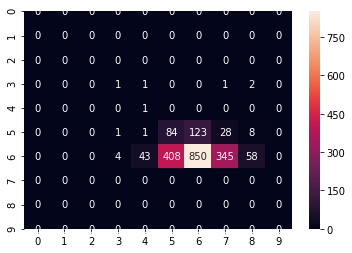

In [12]:
# Final Confusion Matrix for white wine predictions

ax = sn.heatmap(conf_matrix_white_new, annot=True, fmt = 'g')
print("Final Testing Accuracy: ", count_correct/testing_y_values_white.shape[0])

In [13]:
t2 = Tree()
splits_red = 10
tree_red = tree_node(training_data_red, training_y_values_red, t2, f_names, splits_red)
print(t.get_ascii(show_internal=True))

ts = TreeStyle()
ts.show_leaf_name = False
def my_layout(node):
    F = TextFace(node.name, tight_text=True)
    F.rotable = True
    F.border.width = 0
    F.margin_top = 2
    F.margin_bottom = 2
    F.margin_left = 2
    F.margin_right = 2
    add_face_to_node(F, node, column=0, position="branch-right")
ts.layout_fn = my_layout
ts.mode = 'r'
ts.arc_start = 270
ts.arc_span = 185
ts.draw_guiding_lines = True
ts.scale = 100
ts.branch_vertical_margin = 100
ts.min_leaf_separation = 100
ts.show_scale = True

Finding feature for new node
Working on feature:  0
increment : 0.07106918238993712
max: 1.0
min: 0.2893081761006289
Info gain at split 0.36037735849056607 is 1.6760001494773047 

Info gain at split 0.43144654088050316 is 1.6765140471986668 

Info gain at split 0.5025157232704403 is 1.6766026643874417 

Info gain at split 0.5735849056603773 is 1.6765186791799225 

Info gain at split 0.6446540880503144 is 1.6764394158144031 

Info gain at split 0.7157232704402515 is 1.6764549495223957 

Info gain at split 0.7867924528301886 is 1.6765277479788212 

Info gain at split 0.8578616352201257 is 1.676650760362545 

feature_split_value
0.8578616352201257
Working on feature:  1
increment : 0.07658227848101266
max: 0.8417721518987342
min: 0.07594936708860758
Info gain at split 0.15253164556962023 is 1.6767212463931984 

Info gain at split 0.2291139240506329 is 1.6765928698853687 

Info gain at split 0.3056962025316456 is 1.6765985454700478 

Info gain at split 0.38227848101265827 is 1.676669628418

Info gain at split 0.9967619484103658 is 1.677459445613256 

feature_split_value
0.9882184738315616
Working on feature:  6
increment : 0.028927680798004986
max: 0.972568578553616
min: 0.6832917705735662
Info gain at split 0.7122194513715712 is 1.6793166378823787 

Info gain at split 0.7411471321695762 is 1.67725339691874 

Info gain at split 0.7700748129675812 is 1.6775198139952643 

Info gain at split 0.7990024937655862 is 1.6775325626510202 

Info gain at split 0.8279301745635912 is 1.6775324368992008 

Info gain at split 0.8568578553615962 is 1.677545598446615 

Info gain at split 0.8857855361596012 is 1.6772731876265041 

Info gain at split 0.9147132169576062 is 1.6772709389687053 

feature_split_value
0.7122194513715712
Working on feature:  7
increment : 0.08349999999999999
max: 1.0
min: 0.165
Info gain at split 0.2485 is 1.677881646544233 

Info gain at split 0.33199999999999996 is 1.6776419531733064 

Info gain at split 0.4154999999999999 is 1.6773889764837844 

Info gain at spl

Info gain at split 0.5387096774193549 is 1.6782674509148572 

Info gain at split 0.630967741935484 is 1.6779827098544822 

Info gain at split 0.723225806451613 is 1.6788492915740405 

Info gain at split 0.8154838709677421 is 1.6788492915740405 

feature_split_value
0.723225806451613
Working on feature:  1
increment : 0.05501730103806228
max: 0.5709342560553633
min: 0.020761245674740483
Info gain at split 0.07577854671280276 is 1.6768534781153082 

Info gain at split 0.13079584775086506 is 1.6771018349929507 

Info gain at split 0.18581314878892735 is 1.6773564268413501 

Info gain at split 0.24083044982698965 is 1.677547552907852 

Info gain at split 0.29584775086505194 is 1.6777480281050066 

Info gain at split 0.35086505190311423 is 1.6780777357862053 

Info gain at split 0.4058823529411765 is 1.6783241182432052 

Info gain at split 0.4608996539792388 is 1.6782550238837373 

Info gain at split 0.5159169550173011 is 1.6780765601741732 

feature_split_value
0.4058823529411765
Working o

Finding feature for new node
Working on feature:  0
increment : 0.0006451612903225809
max: 0.12903225806451613
min: 0.12258064516129032
Info gain at split 0.1232258064516129 is 0.9182958340544896 

Info gain at split 0.12387096774193547 is 0.9182958340544896 

Info gain at split 0.12451612903225805 is 0.9182958340544896 

Info gain at split 0.1251612903225806 is 0.9182958340544896 

Info gain at split 0.12580645161290321 is 0.9182958340544896 

Info gain at split 0.12645161290322576 is 0.9182958340544896 

Info gain at split 0.12709677419354837 is 0.9182958340544896 

Info gain at split 0.12774193548387092 is 0.9182958340544896 

Info gain at split 0.12838709677419352 is 0.9182958340544896 

feature_split_value
0.1232258064516129
Working on feature:  1
increment : 0.0010380622837370234
max: 0.47058823529411764
min: 0.4602076124567474
Info gain at split 0.46124567474048445 is 0.9182958340544896 

Info gain at split 0.4622837370242215 is 0.9182958340544896 

Info gain at split 0.46332179


Info gain at split 0.7603491271820448 is 0.7202634257094882 

feature_split_value
0.7184538653366583
Working on feature:  4
increment : 0.007000000000000001
max: 0.465
min: 0.395
Info gain at split 0.402 is 0.7202634257094882 

Info gain at split 0.40900000000000003 is 0.7319354494159896 

Info gain at split 0.41600000000000004 is 0.7319354494159896 

Info gain at split 0.42300000000000004 is 0.7319354494159896 

Info gain at split 0.43000000000000005 is 0.7319354494159896 

Info gain at split 0.43700000000000006 is 0.7319354494159896 

Info gain at split 0.44400000000000006 is 0.7319354494159896 

Info gain at split 0.45100000000000007 is 0.7319354494159896 

feature_split_value
0.40900000000000003
Working on feature:  5
increment : 0.024161073825503355
max: 0.8053691275167785
min: 0.5637583892617449
Info gain at split 0.5879194630872483 is 0.7319354494159896 

Info gain at split 0.6120805369127517 is 0.7319354494159896 

Info gain at split 0.636241610738255 is 0.7319354494159896 

I

In [14]:
#initial testing for red wine

count_correct = 0
conf_matrix_red = np.zeros(100).reshape((10,10))
for i in range(testing_data_red.shape[0]):
    out = tree_red.infer(testing_data_red[i])
    x = int(out)
    y = int(testing_y_values_red[i,class_problem])
    conf_matrix_red[x,y] = conf_matrix_red[x,y]+1
    is_correct = out == testing_y_values_red[i,class_problem]
    print('Actual data class: {}'.format(testing_y_values_red[i,class_problem]))
    if is_correct:
        print('CLASSIFIED CORRECTLY')
        count_correct = count_correct + 1
    else:
        print('CLASSIFIED INCORRECTLY')
    
print('Amount of guesses correct: {}'.format(count_correct))
print('Amount of total guesses: {}'.format(testing_y_values_red.shape[0]))
print("Final Testing Accuracy: ", count_correct/testing_y_values_red.shape[0])

[0.50314465 0.37341772 0.05       0.12903226 0.14566285 0.16666667
 0.11072664 0.99368331 0.83790524 0.305      0.67114094]
1
volatile acidity
0.3734177215189873
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.50314465 0.05       0.12903226 0.14566285 0.16666667 0.11072664
 0.99368331 0.83790524 0.305      0.67114094]
0
fixed acidity
0.5031446540880503
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.05       0.12903226 0.14566285 0.16666667 0.11072664 0.99368331
 0.83790524 0.305      0.67114094]
0
citric acid
0.05
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.12903226 0.14566285 0.16666667 0.11072664 0.99368331 0.83790524
 0.305      0.67114094]
1
chlorides
0.1456628477905074
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.12903226 0.16666667 0.11072664 0.99368331 0.83790524 0.305
 0.67114094]
1
free sulfur dioxide
0.1666666666

sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.12258065 0.25       0.13148789 0.99152129 0.78802993 0.425
 0.74496644]
1
free sulfur dioxide
0.25
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.12258065 0.13148789 0.99152129 0.78802993 0.425      0.74496644]
4
sulphates
0.425
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.12258065 0.13148789 0.99152129 0.78802993 0.74496644]
0
residual sugar
0.12258064516129032
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.13148789 0.99152129 0.78802993 0.74496644]
0
total sulfur dioxide
0.1314878892733564
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99152129 0.78802993 0.74496644]
1
pH
0.7880299251870325
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99152129 0.74496644]
0
density
0.9915212864529884
d

child sv less:  0.8
[0.09       0.18709677 0.12929624 0.09722222 0.07612457 0.99302574
 0.86284289 0.305      0.68456376]
0
citric acid
0.09
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.18709677 0.12929624 0.09722222 0.07612457 0.99302574 0.86284289
 0.305      0.68456376]
1
chlorides
0.12929623567921442
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.18709677 0.09722222 0.07612457 0.99302574 0.86284289 0.305
 0.68456376]
1
free sulfur dioxide
0.09722222222222222
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.18709677 0.07612457 0.99302574 0.86284289 0.305      0.68456376]
4
sulphates
0.305
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.18709677 0.07612457 0.99302574 0.86284289 0.68456376]
0
residual sugar
0.1870967741935484
data point less than split value
sv:  0.723225806451613
child sv less:  0.40588235294117

 0.25       0.61073826]
1
chlorides
0.1783960720130933
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.16774194 0.43055556 0.41176471 0.99434088 0.78553616 0.25
 0.61073826]
1
free sulfur dioxide
0.4305555555555556
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.16774194 0.41176471 0.99434088 0.78553616 0.25       0.61073826]
4
sulphates
0.25
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.16774194 0.41176471 0.99434088 0.78553616 0.61073826]
0
residual sugar
0.16774193548387098
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.41176471 0.99434088 0.78553616 0.61073826]
0
total sulfur dioxide
0.4117647058823529
data point more than split value
sv:  0.4058823529411765
child sv more:  0.759731543624161
[0.99434088 0.78553616 0.61073826]
2
alcohol
0.610738255033557
data point less than split value
sv:  0.759

 0.41       0.86577181]
1
chlorides
0.11456628477905074
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.13548387 0.70833333 0.24221453 0.99052496 0.83291771 0.41
 0.86577181]
1
free sulfur dioxide
0.7083333333333334
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.13548387 0.24221453 0.99052496 0.83291771 0.41       0.86577181]
4
sulphates
0.41
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.13548387 0.24221453 0.99052496 0.83291771 0.86577181]
0
residual sugar
0.13548387096774195
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.24221453 0.99052496 0.83291771 0.86577181]
0
total sulfur dioxide
0.2422145328719723
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99052496 0.83291771 0.86577181]
1
pH
0.8329177057356608
data point less than split value
sv:  0.84413

[0.10967742 0.09342561 0.99229842 0.78802993 0.63087248]
0
residual sugar
0.10967741935483871
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.09342561 0.99229842 0.78802993 0.63087248]
0
total sulfur dioxide
0.09342560553633218
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99229842 0.78802993 0.63087248]
1
pH
0.7880299251870325
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99229842 0.63087248]
0
density
0.9922984188345008
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.63087248]
0
alcohol
0.6308724832214765
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 5.0
CLASSIFIED CORRECTLY
[0.61006289 0.18670886 0.4        0.09677419 0.11947627 0.19444444
 0.07266436 0.99189989 0.78304239 0.255      0.73154362]
1
volatile acidity


child sv less:  0.8249999999999997
[0.12903226 0.23529412 0.99327482 0.86034913 0.24       0.63087248]
4
sulphates
0.24
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.12903226 0.23529412 0.99327482 0.86034913 0.63087248]
0
residual sugar
0.12903225806451613
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.23529412 0.99327482 0.86034913 0.63087248]
0
total sulfur dioxide
0.23529411764705882
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99327482 0.86034913 0.63087248]
1
pH
0.8603491271820449
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.99327482 0.63087248]
0
density
0.9932748159292212
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.63087248]
0
alcohol
0.6308724832214765
data point less than split value
sv:  0.6375838926174496
child sv less:  None
Classif

 0.24       0.61073826]
1
chlorides
0.08183306055646482
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.09032258 0.05555556 0.03460208 0.99187996 0.77805486 0.24
 0.61073826]
1
free sulfur dioxide
0.05555555555555555
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.09032258 0.03460208 0.99187996 0.77805486 0.24       0.61073826]
4
sulphates
0.24
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.09032258 0.03460208 0.99187996 0.77805486 0.61073826]
0
residual sugar
0.09032258064516129
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.03460208 0.99187996 0.77805486 0.61073826]
0
total sulfur dioxide
0.03460207612456748
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99187996 0.77805486 0.61073826]
1
pH
0.7780548628428928
data point less than split value
sv:  0.844

 0.42       0.7852349 ]
1
chlorides
0.10310965630114567
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.13225806 0.18055556 0.09342561 0.99150136 0.81296758 0.42
 0.7852349 ]
1
free sulfur dioxide
0.18055555555555555
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.13225806 0.09342561 0.99150136 0.81296758 0.42       0.7852349 ]
4
sulphates
0.42
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.13225806 0.09342561 0.99150136 0.81296758 0.7852349 ]
0
residual sugar
0.132258064516129
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.09342561 0.99150136 0.81296758 0.7852349 ]
0
total sulfur dioxide
0.09342560553633218
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99150136 0.81296758 0.7852349 ]
1
pH
0.8129675810473815
data point less than split value
sv:  0.84413

data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.45       0.10967742 0.1096563  0.09722222 0.04152249 0.98988732
 0.81047382 0.275      0.82550336]
0
citric acid
0.45
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.10967742 0.1096563  0.09722222 0.04152249 0.98988732 0.81047382
 0.275      0.82550336]
1
chlorides
0.10965630114566285
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.10967742 0.09722222 0.04152249 0.98988732 0.81047382 0.275
 0.82550336]
1
free sulfur dioxide
0.09722222222222222
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.10967742 0.04152249 0.98988732 0.81047382 0.275      0.82550336]
4
sulphates
0.275
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.10967742 0.04152249 0.98988732 0.81047382 0.82550336]
0
residual sugar
0.10967741935483871
data point less than split val

sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.98643007 0.72069825 0.85234899]
1
pH
0.7206982543640899
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.98643007 0.85234899]
0
density
0.9864300730305176
data point less than split value
sv:  0.9882184738315616
child sv less:  None
Classified data point as:  7.0
Actual data class: 6.0
CLASSIFIED INCORRECTLY
[0.50314465 0.11392405 0.37       0.05806452 0.0801964  0.5
 0.37716263 0.98643007 0.72069825 0.22       0.85234899]
1
volatile acidity
0.11392405063291139
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.50314465 0.37       0.05806452 0.0801964  0.5        0.37716263
 0.98643007 0.72069825 0.22       0.85234899]
0
fixed acidity
0.5031446540880503
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.37       0.05806452 0.0801964  0.5        0.37716263 0.98643007
 0.72069825 0.22       0.85234899]
0
citri

[0.99275673 0.79865772]
0
density
0.9927567276748798
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.79865772]
0
alcohol
0.7986577181208053
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 6.0
CLASSIFIED INCORRECTLY
[0.44025157 0.32278481 0.09       0.13548387 0.101473   0.05555556
 0.03114187 0.99217886 0.83541147 0.27       0.70469799]
1
volatile acidity
0.3227848101265823
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.44025157 0.09       0.13548387 0.101473   0.05555556 0.03114187
 0.99217886 0.83541147 0.27       0.70469799]
0
fixed acidity
0.44025157232704404
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.09       0.13548387 0.101473   0.05555556 0.03114187 0.99217886
 0.83541147 0.27       0.70469799]
0
citric acid
0.09
data point less than split value
sv:  0.8
child sv less: 

 0.275      0.77181208]
1
chlorides
0.14893617021276595
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.13548387 0.125      0.04844291 0.99122239 0.85286783 0.275
 0.77181208]
1
free sulfur dioxide
0.125
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.13548387 0.04844291 0.99122239 0.85286783 0.275      0.77181208]
4
sulphates
0.275
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.13548387 0.04844291 0.99122239 0.85286783 0.77181208]
0
residual sugar
0.13548387096774195
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.04844291 0.99122239 0.85286783 0.77181208]
0
total sulfur dioxide
0.04844290657439446
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99122239 0.85286783 0.77181208]
1
pH
0.8528678304239402
data point more than split value
sv:  0.844139650872818

0
fixed acidity
0.559748427672956
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.21       0.14193548 0.14402619 0.29166667 0.1349481  0.99325489
 0.83042394 0.415      0.74496644]
0
citric acid
0.21
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.14193548 0.14402619 0.29166667 0.1349481  0.99325489 0.83042394
 0.415      0.74496644]
1
chlorides
0.14402618657937807
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.14193548 0.29166667 0.1349481  0.99325489 0.83042394 0.415
 0.74496644]
1
free sulfur dioxide
0.2916666666666667
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.14193548 0.1349481  0.99325489 0.83042394 0.415      0.74496644]
4
sulphates
0.415
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.14193548 0.1349481  0.99325489 0.83042394 0.74496644]
0
residual sugar
0.141935483870967

[0.08650519 0.98893085 0.88778055 0.86577181]
0
total sulfur dioxide
0.08650519031141868
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.98893085 0.88778055 0.86577181]
1
pH
0.887780548628429
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.98893085 0.86577181]
0
density
0.988930845181281
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.86577181]
0
alcohol
0.8657718120805369
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.52201258 0.20886076 0.42       0.1483871  0.11456628 0.125
 0.06920415 0.99060467 0.84289277 0.385      0.85234899]
1
volatile acidity
0.2088607594936709
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.52201258 0.42       0.1483871  0.11456628 0.125      0.06920415
 0.99060467 

data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.12903226 0.1096563  0.06944444 0.03460208 0.99052496 0.81795511
 0.285      0.79194631]
1
chlorides
0.10965630114566285
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.12903226 0.06944444 0.03460208 0.99052496 0.81795511 0.285
 0.79194631]
1
free sulfur dioxide
0.06944444444444445
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.12903226 0.03460208 0.99052496 0.81795511 0.285      0.79194631]
4
sulphates
0.285
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.12903226 0.03460208 0.99052496 0.81795511 0.79194631]
0
residual sugar
0.12903225806451613
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.03460208 0.99052496 0.81795511 0.79194631]
0
total sulfur dioxide
0.03460207612456748
data point less than split value
sv:  0.40588235

0
total sulfur dioxide
0.12802768166089964
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99353386 0.82543641 0.71812081]
1
pH
0.8254364089775562
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99353386 0.71812081]
0
density
0.9935338600563919
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.71812081]
0
alcohol
0.7181208053691275
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 6.0
CLASSIFIED INCORRECTLY
[0.47169811 0.48734177 0.2        0.52258065 0.1603928  0.41666667
 0.3183391  0.99524754 0.79800499 0.29       0.61744966]
1
volatile acidity
0.4873417721518987
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.47169811 0.2        0.52258065 0.1603928  0.41666667 0.3183391
 0.99524754 0.79800499 0.29       0.61744966]
0
fixe

[0.30322581 0.03114187 0.9937132  0.84289277 0.77852349]
0
residual sugar
0.3032258064516129
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.03114187 0.9937132  0.84289277 0.77852349]
0
total sulfur dioxide
0.031141868512110725
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.9937132  0.84289277 0.77852349]
1
pH
0.8428927680798005
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.9937132  0.77852349]
0
density
0.9937131982982793
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.77852349]
0
alcohol
0.7785234899328859
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.49685535 0.12025316 0.42       0.10322581 0.09328969 0.25
 0.10380623 0.99034562 0.82044888 0.345      0.75167785]
1
volatile acidity
0.12

sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.79194631]
0
alcohol
0.7919463087248323
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 8.0
CLASSIFIED INCORRECTLY
[0.49685535 0.21518987 0.42       0.12903226 0.14075286 0.11111111
 0.06574394 0.99180026 0.83541147 0.3        0.76510067]
1
volatile acidity
0.21518987341772153
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.49685535 0.42       0.12903226 0.14075286 0.11111111 0.06574394
 0.99180026 0.83541147 0.3        0.76510067]
0
fixed acidity
0.4968553459119497
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.42       0.12903226 0.14075286 0.11111111 0.06574394 0.99180026
 0.83541147 0.3        0.76510067]
0
citric acid
0.42
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.12903226 0.14075286 0.11111111 0.06574394 0.99180026 0.83541147

Actual data class: 5.0
CLASSIFIED CORRECTLY
[0.50314465 0.19620253 0.45       0.13548387 0.35351882 0.06944444
 0.05536332 0.98992717 0.78553616 0.405      0.83892617]
1
volatile acidity
0.1962025316455696
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.50314465 0.45       0.13548387 0.35351882 0.06944444 0.05536332
 0.98992717 0.78553616 0.405      0.83892617]
0
fixed acidity
0.5031446540880503
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.45       0.13548387 0.35351882 0.06944444 0.05536332 0.98992717
 0.78553616 0.405      0.83892617]
0
citric acid
0.45
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.13548387 0.35351882 0.06944444 0.05536332 0.98992717 0.78553616
 0.405      0.83892617]
1
chlorides
0.35351882160392806
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.13548387 0.06944444 0.05536332 0.98992717 0.78553616 0.405
 0

sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.13548387 0.16955017 0.99008658 0.85037406 0.8590604 ]
0
residual sugar
0.13548387096774195
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.16955017 0.99008658 0.85037406 0.8590604 ]
0
total sulfur dioxide
0.1695501730103806
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99008658 0.85037406 0.8590604 ]
1
pH
0.8503740648379053
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.99008658 0.8590604 ]
0
density
0.990086580517889
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.8590604]
0
alcohol
0.8590604026845637
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.51572327 0.14556962 0.42       0.12258065 0.11292962 0.125
 0.05882353 0.99010651 0

child sv less:  0.7583333333333333
[0.09032258 0.08333333 0.04844291 0.99226853 0.81047382 0.32
 0.67114094]
1
free sulfur dioxide
0.08333333333333333
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.09032258 0.04844291 0.99226853 0.81047382 0.32       0.67114094]
4
sulphates
0.32
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.09032258 0.04844291 0.99226853 0.81047382 0.67114094]
0
residual sugar
0.09032258064516129
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.04844291 0.99226853 0.81047382 0.67114094]
0
total sulfur dioxide
0.04844290657439446
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99226853 0.81047382 0.67114094]
1
pH
0.8104738154613467
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99226853 0.67114094]
0
density
0.9922685291275195
data point 

sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.49685535 0.34       0.16129032 0.12438625 0.11111111 0.05882353
 0.98870169 0.79800499 0.36       0.87919463]
0
fixed acidity
0.4968553459119497
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.34       0.16129032 0.12438625 0.11111111 0.05882353 0.98870169
 0.79800499 0.36       0.87919463]
0
citric acid
0.34
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.16129032 0.12438625 0.11111111 0.05882353 0.98870169 0.79800499
 0.36       0.87919463]
1
chlorides
0.12438625204582651
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.16129032 0.11111111 0.05882353 0.98870169 0.79800499 0.36
 0.87919463]
1
free sulfur dioxide
0.1111111111111111
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.16129032 0.05882353 0.98870169 0.79800499 0.36       0.87919463]
4
sulphates
0.36
data point 

alcohol
0.7718120805369127
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 4.0
CLASSIFIED INCORRECTLY
[0.55345912 0.15189873 0.35       0.10967742 0.09001637 0.18055556
 0.09342561 0.99028585 0.78304239 0.295      0.75838926]
1
volatile acidity
0.15189873417721517
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.55345912 0.35       0.10967742 0.09001637 0.18055556 0.09342561
 0.99028585 0.78304239 0.295      0.75838926]
0
fixed acidity
0.5534591194968553
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.35       0.10967742 0.09001637 0.18055556 0.09342561 0.99028585
 0.78304239 0.295      0.75838926]
0
citric acid
0.35
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.10967742 0.09001637 0.18055556 0.09342561 0.99028585 0.78304239
 0.295      0.75838926]
1
chlorides
0.09001636661211129
data point less t

[0.35483871 0.06228374 0.99317518 0.840399   0.75167785]
0
residual sugar
0.3548387096774194
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.06228374 0.99317518 0.840399   0.75167785]
0
total sulfur dioxide
0.06228373702422145
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99317518 0.840399   0.75167785]
1
pH
0.8403990024937656
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99317518 0.75167785]
0
density
0.993175183572617
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.75167785]
0
alcohol
0.7516778523489932
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.53459119 0.17721519 0.35       0.10967742 0.09983633 0.08333333
 0.05190311 0.99158107 0.82294264 0.37       0.79194631]
1
volatile acidity


sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.98988732 0.76510067]
0
density
0.9898873158046807
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.76510067]
0
alcohol
0.7651006711409396
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 6.0
CLASSIFIED INCORRECTLY
[0.44025157 0.13924051 0.3        0.11612903 0.10638298 0.22222222
 0.06920415 0.99305562 0.90024938 0.41       0.67114094]
1
volatile acidity
0.13924050632911392
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.44025157 0.3        0.11612903 0.10638298 0.22222222 0.06920415
 0.99305562 0.90024938 0.41       0.67114094]
0
fixed acidity
0.44025157232704404
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.3        0.11612903 0.10638298 0.22222222 0.06920415 0.99305562
 0.90024938 0.41       0.67114094]
0
citric acid
0.

[0.99335452 0.79194631]
0
density
0.9933545218145046
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.79194631]
0
alcohol
0.7919463087248323
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.49056604 0.24683544 0.42       0.12903226 0.14075286 0.125
 0.07266436 0.99160099 0.84538653 0.33       0.77852349]
1
volatile acidity
0.2468354430379747
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.49056604 0.42       0.12903226 0.14075286 0.125      0.07266436
 0.99160099 0.84538653 0.33       0.77852349]
0
fixed acidity
0.49056603773584906
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.42       0.12903226 0.14075286 0.125      0.07266436 0.99160099
 0.84538653 0.33       0.77852349]
0
citric acid
0.42
data point less than split value
sv:  0.8
child sv less:  0.80

data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.         0.14193548 0.16366612 0.69444444 0.21799308 0.99178033
 0.89526185 0.34       0.76510067]
0
citric acid
0.0
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.14193548 0.16366612 0.69444444 0.21799308 0.99178033 0.89526185
 0.34       0.76510067]
1
chlorides
0.16366612111292964
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.14193548 0.69444444 0.21799308 0.99178033 0.89526185 0.34
 0.76510067]
1
free sulfur dioxide
0.6944444444444444
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.14193548 0.21799308 0.99178033 0.89526185 0.34       0.76510067]
4
sulphates
0.34
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.14193548 0.21799308 0.99178033 0.89526185 0.76510067]
0
residual sugar
0.14193548387096774
data point less than split value
s

sv:  0.8
child sv less:  0.8039279869067104
[0.10967742 0.12765957 0.13888889 0.07266436 0.99325489 0.82044888
 0.335      0.67114094]
1
chlorides
0.1276595744680851
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.10967742 0.13888889 0.07266436 0.99325489 0.82044888 0.335
 0.67114094]
1
free sulfur dioxide
0.1388888888888889
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.10967742 0.07266436 0.99325489 0.82044888 0.335      0.67114094]
4
sulphates
0.335
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.10967742 0.07266436 0.99325489 0.82044888 0.67114094]
0
residual sugar
0.10967741935483871
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.07266436 0.99325489 0.82044888 0.67114094]
0
total sulfur dioxide
0.0726643598615917
data point less than split value
sv:  0.4058823529411765
child sv less:  0.844139650

child sv less:  0.8578616352201257
[0.47798742 0.29       0.1483871  0.14075286 0.06944444 0.04844291
 0.99136187 0.82793017 0.31       0.77181208]
0
fixed acidity
0.47798742138364775
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.29       0.1483871  0.14075286 0.06944444 0.04844291 0.99136187
 0.82793017 0.31       0.77181208]
0
citric acid
0.29
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.1483871  0.14075286 0.06944444 0.04844291 0.99136187 0.82793017
 0.31       0.77181208]
1
chlorides
0.14075286415711946
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.1483871  0.06944444 0.04844291 0.99136187 0.82793017 0.31
 0.77181208]
1
free sulfur dioxide
0.06944444444444445
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.1483871  0.04844291 0.99136187 0.82793017 0.31       0.77181208]
4
sulphates
0.31
data point less than split value


 0.03806228 0.98952864 0.83541147 0.33       0.85234899]
1
volatile acidity
0.4177215189873418
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.44654088 0.         0.15483871 0.08510638 0.08333333 0.03806228
 0.98952864 0.83541147 0.33       0.85234899]
0
fixed acidity
0.4465408805031446
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.         0.15483871 0.08510638 0.08333333 0.03806228 0.98952864
 0.83541147 0.33       0.85234899]
0
citric acid
0.0
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.15483871 0.08510638 0.08333333 0.03806228 0.98952864 0.83541147
 0.33       0.85234899]
1
chlorides
0.08510638297872342
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.15483871 0.08333333 0.03806228 0.98952864 0.83541147 0.33
 0.85234899]
1
free sulfur dioxide
0.08333333333333333
data point less than split value
sv:  0.7583333333333333
chi

[0.76510067]
0
alcohol
0.7651006711409396
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 5.0
CLASSIFIED CORRECTLY
[0.64150943 0.25316456 0.4        0.16129032 0.11129296 0.56944444
 0.18685121 0.99387261 0.84289277 0.43       0.70469799]
1
volatile acidity
0.25316455696202533
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.64150943 0.4        0.16129032 0.11129296 0.56944444 0.18685121
 0.99387261 0.84289277 0.43       0.70469799]
0
fixed acidity
0.6415094339622641
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.4        0.16129032 0.11129296 0.56944444 0.18685121 0.99387261
 0.84289277 0.43       0.70469799]
0
citric acid
0.4
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.16129032 0.11129296 0.56944444 0.18685121 0.99387261 0.84289277
 0.43       0.70469799]
1
chlorides
0.11129296235679216
data 

data point more than split value
sv:  0.4058823529411765
child sv more:  0.759731543624161
[0.99172055 0.83790524 0.73154362]
2
alcohol
0.7315436241610739
data point less than split value
sv:  0.759731543624161
child sv less:  0.9918002570514801
[0.99172055 0.83790524]
0
density
0.9917205511661967
data point less than split value
sv:  0.9918002570514801
child sv less:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.55345912 0.60443038 0.05       0.11612903 0.12274959 0.06944444
 0.06574394 0.99249768 0.82294264 0.22       0.6442953 ]
1
volatile acidity
0.6044303797468354
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.55345912 0.05       0.11612903 0.12274959 0.06944444 0.06574394
 0.99249768 0.82294264 0.22       0.6442953 ]
0
fixed acidity
0.5534591194968553
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.05       0.11612903 0.12274959 0.06944444 0.06574394 0.99249768


 0.04152249 0.99185007 0.88778055 0.255      0.72483221]
1
volatile acidity
0.560126582278481
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.40251572 0.         0.1483871  0.27168576 0.08333333 0.04152249
 0.99185007 0.88778055 0.255      0.72483221]
0
fixed acidity
0.4025157232704403
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.         0.1483871  0.27168576 0.08333333 0.04152249 0.99185007
 0.88778055 0.255      0.72483221]
0
citric acid
0.0
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.1483871  0.27168576 0.08333333 0.04152249 0.99185007 0.88778055
 0.255      0.72483221]
1
chlorides
0.27168576104746317
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.1483871  0.08333333 0.04152249 0.99185007 0.88778055 0.255
 0.72483221]
1
free sulfur dioxide
0.08333333333333333
data point less than split value
sv:  0.7583333333333333
chi

child sv less:  0.8249999999999997
[0.12903226 0.26643599 0.99144158 0.78553616 0.395      0.73154362]
4
sulphates
0.395
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.12903226 0.26643599 0.99144158 0.78553616 0.73154362]
0
residual sugar
0.12903225806451613
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.26643599 0.99144158 0.78553616 0.73154362]
0
total sulfur dioxide
0.2664359861591695
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99144158 0.78553616 0.73154362]
1
pH
0.7855361596009975
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99144158 0.73154362]
0
density
0.9914415805677051
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.73154362]
0
alcohol
0.7315436241610739
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classif

sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.73825503]
0
alcohol
0.7382550335570469
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.62264151 0.4556962  0.55       0.10967742 0.22258592 0.33333333
 0.1799308  0.99385268 0.83541147 0.47       0.67114094]
1
volatile acidity
0.45569620253164556
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.62264151 0.55       0.10967742 0.22258592 0.33333333 0.1799308
 0.99385268 0.83541147 0.47       0.67114094]
0
fixed acidity
0.6226415094339622
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.55       0.10967742 0.22258592 0.33333333 0.1799308  0.99385268
 0.83541147 0.47       0.67114094]
0
citric acid
0.55
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.10967742 0.22258592 0.33333333 0.1799308  0.99385268 0.83541147


[0.99310544 0.82044888 0.63758389]
1
pH
0.8204488778054864
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99310544 0.63758389]
0
density
0.9931054409229942
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.63758389]
0
alcohol
0.6375838926174496
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 6.0
CLASSIFIED INCORRECTLY
[0.51572327 0.21518987 0.37       0.12258065 0.09328969 0.59722222
 0.25605536 0.99042533 0.80548628 0.405      0.80536913]
1
volatile acidity
0.21518987341772153
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.51572327 0.37       0.12258065 0.09328969 0.59722222 0.25605536
 0.99042533 0.80548628 0.405      0.80536913]
0
fixed acidity
0.5157232704402516
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.37       0.12258065 0.09

child sv less:  0.4058823529411765
[0.30795848 0.9931154  0.81296758 0.6442953 ]
0
total sulfur dioxide
0.3079584775086505
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.9931154  0.81296758 0.6442953 ]
1
pH
0.8129675810473815
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.9931154 0.6442953]
0
density
0.9931154041586545
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.6442953]
0
alcohol
0.6442953020134228
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 6.0
CLASSIFIED INCORRECTLY
[0.66037736 0.2278481  0.47       0.14193548 0.12111293 0.125
 0.07958478 0.99271687 0.80548628 0.38       0.80536913]
1
volatile acidity
0.22784810126582278
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.66037736 0.47       0.14193548 0.12111293 

4
sulphates
0.36
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.12903226 0.07266436 0.99402206 0.81546135 0.6442953 ]
0
residual sugar
0.12903225806451613
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.07266436 0.99402206 0.81546135 0.6442953 ]
0
total sulfur dioxide
0.0726643598615917
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99402206 0.81546135 0.6442953 ]
1
pH
0.8154613466334165
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99402206 0.6442953 ]
0
density
0.9940220586037521
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.6442953]
0
alcohol
0.6442953020134228
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 5.0
CLASSIFIED CORRECTLY
[0.32075472 0.26582278 0.         0.1

child sv less:  0.723225806451613
[0.14193548 0.06228374 0.98877143 0.84538653 0.8590604 ]
0
residual sugar
0.14193548387096774
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.06228374 0.98877143 0.84538653 0.8590604 ]
0
total sulfur dioxide
0.06228373702422145
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.98877143 0.84538653 0.8590604 ]
1
pH
0.8453865336658355
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.98877143 0.8590604 ]
0
density
0.9887714334107146
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.8590604]
0
alcohol
0.8590604026845637
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.50943396 0.46202532 0.         0.16129032 0.13256956 0.16666667
 0.08304498 0.99431099 0.84289277 0.23     

 0.81879195]
1
free sulfur dioxide
0.20833333333333334
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.12903226 0.1384083  0.99048511 0.80299252 0.3        0.81879195]
4
sulphates
0.3
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.12903226 0.1384083  0.99048511 0.80299252 0.81879195]
0
residual sugar
0.12903225806451613
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.1384083  0.99048511 0.80299252 0.81879195]
0
total sulfur dioxide
0.1384083044982699
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99048511 0.80299252 0.81879195]
1
pH
0.802992518703242
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99048511 0.81879195]
0
density
0.9904851099443055
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.81879195]
0
alc

sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.04844291 0.99260728 0.86034913 0.65771812]
0
total sulfur dioxide
0.04844290657439446
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99260728 0.86034913 0.65771812]
1
pH
0.8603491271820449
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.99260728 0.65771812]
0
density
0.9926072791399736
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.65771812]
0
alcohol
0.6577181208053692
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.49685535 0.41772152 0.         0.09032258 0.15711948 0.08333333
 0.0449827  0.99202941 0.8553616  0.29       0.63758389]
1
volatile acidity
0.4177215189873418
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.49685535 0.

child sv less:  0.8249999999999997
[0.30967742 0.23875433 0.99266706 0.82793017 0.35       0.73825503]
4
sulphates
0.35
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.30967742 0.23875433 0.99266706 0.82793017 0.73825503]
0
residual sugar
0.3096774193548387
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.23875433 0.99266706 0.82793017 0.73825503]
0
total sulfur dioxide
0.23875432525951557
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99266706 0.82793017 0.73825503]
1
pH
0.8279301745635911
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99266706 0.73825503]
0
density
0.9926670585539359
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.73825503]
0
alcohol
0.7382550335570469
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classifi

sv:  0.8578616352201257
child sv less:  0.8
[0.5        0.1483871  0.11129296 0.18055556 0.06574394 0.99233827
 0.77306733 0.435      0.76510067]
0
citric acid
0.5
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.1483871  0.11129296 0.18055556 0.06574394 0.99233827 0.77306733
 0.435      0.76510067]
1
chlorides
0.11129296235679216
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.1483871  0.18055556 0.06574394 0.99233827 0.77306733 0.435
 0.76510067]
1
free sulfur dioxide
0.18055555555555555
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.1483871  0.06574394 0.99233827 0.77306733 0.435      0.76510067]
4
sulphates
0.435
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.1483871  0.06574394 0.99233827 0.77306733 0.76510067]
0
residual sugar
0.14838709677419354
data point less than split value
sv:  0.723225806451613
child sv

child sv less:  0.8441396508728182
[0.99193974 0.840399   0.69798658]
1
pH
0.8403990024937656
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99193974 0.69798658]
0
density
0.9919397423507259
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.69798658]
0
alcohol
0.697986577181208
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 6.0
CLASSIFIED INCORRECTLY
[0.49685535 0.48417722 0.         0.12903226 0.13747954 0.125
 0.07612457 0.99252757 0.83042394 0.34       0.73154362]
1
volatile acidity
0.4841772151898734
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.49685535 0.         0.12903226 0.13747954 0.125      0.07612457
 0.99252757 0.83042394 0.34       0.73154362]
0
fixed acidity
0.4968553459119497
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8

data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.13548387 0.20761246 0.99271687 0.82044888 0.375      0.73154362]
4
sulphates
0.375
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.13548387 0.20761246 0.99271687 0.82044888 0.73154362]
0
residual sugar
0.13548387096774195
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.20761246 0.99271687 0.82044888 0.73154362]
0
total sulfur dioxide
0.20761245674740483
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99271687 0.82044888 0.73154362]
1
pH
0.8204488778054864
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99271687 0.73154362]
0
density
0.992716874732238
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.73154362]
0
alcohol
0.7315436241610739
data point more than split v

Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.57232704 0.23417722 0.32       0.13548387 0.10474632 0.05555556
 0.05190311 0.99209915 0.82294264 0.4        0.75167785]
1
volatile acidity
0.23417721518987342
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.57232704 0.32       0.13548387 0.10474632 0.05555556 0.05190311
 0.99209915 0.82294264 0.4        0.75167785]
0
fixed acidity
0.5723270440251572
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.32       0.13548387 0.10474632 0.05555556 0.05190311 0.99209915
 0.82294264 0.4        0.75167785]
0
citric acid
0.32
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.13548387 0.10474632 0.05555556 0.05190311 0.99209915 0.82294264
 0.4        0.75167785]
1
chlorides
0.10474631751227496
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.13548387 0.05555556 0.0519031

density
0.9916607717522343
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.70469799]
0
alcohol
0.7046979865771812
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 5.0
CLASSIFIED CORRECTLY
[0.44025157 0.2278481  0.21       0.1483871  0.14075286 0.27777778
 0.22491349 0.99191982 0.8478803  0.27       0.67785235]
1
volatile acidity
0.22784810126582278
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.44025157 0.21       0.1483871  0.14075286 0.27777778 0.22491349
 0.99191982 0.8478803  0.27       0.67785235]
0
fixed acidity
0.44025157232704404
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.21       0.1483871  0.14075286 0.27777778 0.22491349 0.99191982
 0.8478803  0.27       0.67785235]
0
citric acid
0.21
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.1483

0
total sulfur dioxide
0.15916955017301038
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.98893085 1.         0.83892617]
1
pH
1.0
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.98893085 0.83892617]
0
density
0.988930845181281
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.83892617]
0
alcohol
0.8389261744966443
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.57232704 0.21518987 0.42       0.11612903 0.09492635 0.125
 0.06228374 0.99026592 0.79301746 0.275      0.76510067]
1
volatile acidity
0.21518987341772153
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.57232704 0.42       0.11612903 0.09492635 0.125      0.06228374
 0.99026592 0.79301746 0.275      0.76510067]
0
fixed acidity
0.572327044

 0.65771812]
1
free sulfur dioxide
0.2361111111111111
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.13548387 0.31487889 0.99249768 0.82044888 0.28       0.65771812]
4
sulphates
0.28
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.13548387 0.31487889 0.99249768 0.82044888 0.65771812]
0
residual sugar
0.13548387096774195
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.31487889 0.99249768 0.82044888 0.65771812]
0
total sulfur dioxide
0.314878892733564
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99249768 0.82044888 0.65771812]
1
pH
0.8204488778054864
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99249768 0.65771812]
0
density
0.9924976835477091
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.65771812]
0
alc

sv:  0.8
child sv less:  0.8039279869067104
[0.10967742 0.1391162  0.23611111 0.10726644 0.99222868 0.840399
 0.255      0.69798658]
1
chlorides
0.1391162029459902
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.10967742 0.23611111 0.10726644 0.99222868 0.840399   0.255
 0.69798658]
1
free sulfur dioxide
0.2361111111111111
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.10967742 0.10726644 0.99222868 0.840399   0.255      0.69798658]
4
sulphates
0.255
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.10967742 0.10726644 0.99222868 0.840399   0.69798658]
0
residual sugar
0.10967741935483871
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.10726644 0.99222868 0.840399   0.69798658]
0
total sulfur dioxide
0.10726643598615918
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508

1
chlorides
0.14075286415711946
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.12258065 0.19444444 0.19723183 0.99323496 0.840399   0.23
 0.69127517]
1
free sulfur dioxide
0.19444444444444445
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.12258065 0.19723183 0.99323496 0.840399   0.23       0.69127517]
4
sulphates
0.23
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.12258065 0.19723183 0.99323496 0.840399   0.69127517]
0
residual sugar
0.12258064516129032
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.19723183 0.99323496 0.840399   0.69127517]
0
total sulfur dioxide
0.1972318339100346
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99323496 0.840399   0.69127517]
1
pH
0.8403990024937656
data point less than split value
sv:  0.8441396508728182
child sv le

 0.67785235]
1
free sulfur dioxide
0.18055555555555555
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.16129032 0.18685121 0.99357371 0.83790524 0.27       0.67785235]
4
sulphates
0.27
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.16129032 0.18685121 0.99357371 0.83790524 0.67785235]
0
residual sugar
0.16129032258064516
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.18685121 0.99357371 0.83790524 0.67785235]
0
total sulfur dioxide
0.18685121107266436
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99357371 0.83790524 0.67785235]
1
pH
0.8379052369077307
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99357371 0.67785235]
0
density
0.9935737129990336
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.67785235]
0


 0.66442953]
1
free sulfur dioxide
0.18055555555555555
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.12903226 0.34602076 0.99219879 0.81296758 0.26       0.66442953]
4
sulphates
0.26
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.12903226 0.34602076 0.99219879 0.81296758 0.66442953]
0
residual sugar
0.12903225806451613
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.34602076 0.99219879 0.81296758 0.66442953]
0
total sulfur dioxide
0.3460207612456747
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99219879 0.81296758 0.66442953]
1
pH
0.8129675810473815
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99219879 0.66442953]
0
density
0.9921987864778967
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.66442953]
0
a

[0.07958478 0.9924379  0.82294264 0.6442953 ]
0
total sulfur dioxide
0.07958477508650519
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.9924379  0.82294264 0.6442953 ]
1
pH
0.8229426433915212
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.9924379 0.6442953]
0
density
0.9924379041337464
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.6442953]
0
alcohol
0.6442953020134228
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 5.0
CLASSIFIED CORRECTLY
[0.41509434 0.40506329 0.31       0.39354839 0.13584288 0.09722222
 0.16955017 0.99351393 0.83541147 0.34       0.69127517]
1
volatile acidity
0.4050632911392405
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.41509434 0.31       0.39354839 0.13584288 0.09722222 0.16955017
 0.9935139

0.18055555555555555
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.14193548 0.09688581 0.99293607 0.87780549 0.31       0.68456376]
4
sulphates
0.31
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.14193548 0.09688581 0.99293607 0.87780549 0.68456376]
0
residual sugar
0.14193548387096774
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.09688581 0.99293607 0.87780549 0.68456376]
0
total sulfur dioxide
0.09688581314878893
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99293607 0.87780549 0.68456376]
1
pH
0.8778054862842893
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.99293607 0.68456376]
0
density
0.9929360659167672
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.68456376]
0
alcohol
0.6845637583892616
data poi

sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.30795848 0.99263717 0.75810474 0.67785235]
0
total sulfur dioxide
0.3079584775086505
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99263717 0.75810474 0.67785235]
1
pH
0.7581047381546135
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99263717 0.67785235]
0
density
0.9926371688469547
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.67785235]
0
alcohol
0.6778523489932885
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 5.0
CLASSIFIED CORRECTLY
[0.62893082 0.20253165 0.59       0.14193548 0.12602291 0.04166667
 0.05190311 0.99572577 0.79800499 0.39       0.6442953 ]
1
volatile acidity
0.20253164556962025
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.62893082 0.59

[0.2516129  0.10726644 0.99313533 0.87281796 0.73825503]
0
residual sugar
0.25161290322580643
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.10726644 0.99313533 0.87281796 0.73825503]
0
total sulfur dioxide
0.10726643598615918
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99313533 0.87281796 0.73825503]
1
pH
0.8728179551122195
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.99313533 0.73825503]
0
density
0.9931353306299754
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.73825503]
0
alcohol
0.7382550335570469
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 4.0
CLASSIFIED INCORRECTLY
[0.52201258 0.16455696 0.37       0.09032258 0.12438625 0.11111111
 0.07958478 0.99373312 0.81296758 0.35       0.6442953 ]
1
volatile acidit

0
alcohol
0.6912751677852349
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.4591195  0.42405063 0.02       0.14193548 0.11783961 0.43055556
 0.3183391  0.99199952 0.82793017 0.34       0.74272931]
1
volatile acidity
0.4240506329113924
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.4591195  0.02       0.14193548 0.11783961 0.43055556 0.3183391
 0.99199952 0.82793017 0.34       0.74272931]
0
fixed acidity
0.45911949685534587
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.02       0.14193548 0.11783961 0.43055556 0.3183391  0.99199952
 0.82793017 0.34       0.74272931]
0
citric acid
0.02
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.14193548 0.11783961 0.43055556 0.3183391  0.99199952 0.82793017
 0.34       0.74272931]
1
chlorides
0.11783960720130934
data point less 

child sv less:  0.8039279869067104
[0.17419355 0.17021277 0.11111111 0.05882353 0.99365342 0.83042394
 0.39       0.73825503]
1
chlorides
0.17021276595744683
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.17419355 0.11111111 0.05882353 0.99365342 0.83042394 0.39
 0.73825503]
1
free sulfur dioxide
0.1111111111111111
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.17419355 0.05882353 0.99365342 0.83042394 0.39       0.73825503]
4
sulphates
0.39
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.17419355 0.05882353 0.99365342 0.83042394 0.73825503]
0
residual sugar
0.17419354838709677
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.05882353 0.99365342 0.83042394 0.73825503]
0
total sulfur dioxide
0.058823529411764705
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182


sv:  0.8578616352201257
child sv less:  0.8
[0.01       0.15483871 0.12438625 0.19444444 0.1349481  0.99156114
 0.83291771 0.265      0.72483221]
0
citric acid
0.01
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.15483871 0.12438625 0.19444444 0.1349481  0.99156114 0.83291771
 0.265      0.72483221]
1
chlorides
0.12438625204582651
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.15483871 0.19444444 0.1349481  0.99156114 0.83291771 0.265
 0.72483221]
1
free sulfur dioxide
0.19444444444444445
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.15483871 0.1349481  0.99156114 0.83291771 0.265      0.72483221]
4
sulphates
0.265
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.15483871 0.1349481  0.99156114 0.83291771 0.72483221]
0
residual sugar
0.15483870967741936
data point less than split value
sv:  0.723225806451613
child s

sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.36774194 0.04844291 0.99441062 0.8478803  0.26       0.68456376]
4
sulphates
0.26
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.36774194 0.04844291 0.99441062 0.8478803  0.68456376]
0
residual sugar
0.36774193548387096
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.04844291 0.99441062 0.8478803  0.68456376]
0
total sulfur dioxide
0.04844290657439446
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99441062 0.8478803  0.68456376]
1
pH
0.8478802992518704
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.99441062 0.68456376]
0
density
0.9944106247945083
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.68456376]
0
alcohol
0.6845637583892616
data point more than split value
sv:  0.6375838926174496
chil

Classified data point as:  6.0
Actual data class: 5.0
CLASSIFIED INCORRECTLY
[0.48427673 0.34177215 0.26       0.12258065 0.14566285 0.31944444
 0.50865052 0.99269695 0.81296758 0.295      0.65100671]
1
volatile acidity
0.34177215189873417
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.48427673 0.26       0.12258065 0.14566285 0.31944444 0.50865052
 0.99269695 0.81296758 0.295      0.65100671]
0
fixed acidity
0.48427672955974843
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.26       0.12258065 0.14566285 0.31944444 0.50865052 0.99269695
 0.81296758 0.295      0.65100671]
0
citric acid
0.26
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.12258065 0.14566285 0.31944444 0.50865052 0.99269695 0.81296758
 0.295      0.65100671]
1
chlorides
0.1456628477905074
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.12258065 0.31944444 0.50865

[0.72483221]
0
alcohol
0.7248322147651007
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 6.0
CLASSIFIED CORRECTLY
[0.47169811 0.24050633 0.57       0.1483871  0.17348609 0.06944444
 0.04152249 0.99238809 0.83790524 0.275      0.76510067]
1
volatile acidity
0.24050632911392406
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.47169811 0.57       0.1483871  0.17348609 0.06944444 0.04152249
 0.99238809 0.83790524 0.275      0.76510067]
0
fixed acidity
0.4716981132075472
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.57       0.1483871  0.17348609 0.06944444 0.04152249 0.99238809
 0.83790524 0.275      0.76510067]
0
citric acid
0.57
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.1483871  0.17348609 0.06944444 0.04152249 0.99238809 0.83790524
 0.275      0.76510067]
1
chlorides
0.1734860883797054
data 

sv:  0.8
child sv less:  0.8039279869067104
[0.12903226 0.10310966 0.40277778 0.15224913 0.99123235 0.84289277
 0.415      0.69127517]
1
chlorides
0.10310965630114567
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.12903226 0.40277778 0.15224913 0.99123235 0.84289277 0.415
 0.69127517]
1
free sulfur dioxide
0.4027777777777778
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.12903226 0.15224913 0.99123235 0.84289277 0.415      0.69127517]
4
sulphates
0.415
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.12903226 0.15224913 0.99123235 0.84289277 0.69127517]
0
residual sugar
0.12903225806451613
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.15224913 0.99123235 0.84289277 0.69127517]
0
total sulfur dioxide
0.1522491349480969
data point less than split value
sv:  0.4058823529411765
child sv less:  0.84413965

 0.09688581 0.99264713 0.89775561 0.33       0.68456376]
1
volatile acidity
0.44620253164556956
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.3836478  0.1        0.18064516 0.13256956 0.18055556 0.09688581
 0.99264713 0.89775561 0.33       0.68456376]
0
fixed acidity
0.38364779874213834
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.1        0.18064516 0.13256956 0.18055556 0.09688581 0.99264713
 0.89775561 0.33       0.68456376]
0
citric acid
0.1
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.18064516 0.13256956 0.18055556 0.09688581 0.99264713 0.89775561
 0.33       0.68456376]
1
chlorides
0.132569558101473
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.18064516 0.18055556 0.09688581 0.99264713 0.89775561 0.33
 0.68456376]
1
free sulfur dioxide
0.18055555555555555
data point less than split value
sv:  0.7583333333333333
chi

sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.14193548 0.16955017 0.99299585 0.8478803  0.73154362]
0
residual sugar
0.14193548387096774
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.16955017 0.99299585 0.8478803  0.73154362]
0
total sulfur dioxide
0.1695501730103806
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99299585 0.8478803  0.73154362]
1
pH
0.8478802992518704
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.99299585 0.73154362]
0
density
0.9929958453307296
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.73154362]
0
alcohol
0.7315436241610739
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.42138365 0.54113924 0.02       0.12258065 0.10474632 0.40277778
 0.13148789 0.991

CLASSIFIED CORRECTLY
[0.39622642 0.43037975 0.01       0.23870968 0.1685761  0.44444444
 0.18685121 0.99219879 0.87531172 0.33       0.75838926]
1
volatile acidity
0.43037974683544306
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.39622642 0.01       0.23870968 0.1685761  0.44444444 0.18685121
 0.99219879 0.87531172 0.33       0.75838926]
0
fixed acidity
0.3962264150943396
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.01       0.23870968 0.1685761  0.44444444 0.18685121 0.99219879
 0.87531172 0.33       0.75838926]
0
citric acid
0.01
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.23870968 0.1685761  0.44444444 0.18685121 0.99219879 0.87531172
 0.33       0.75838926]
1
chlorides
0.16857610474631754
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.23870968 0.44444444 0.18685121 0.99219879 0.87531172 0.33
 0.75838926]
1
free sulfu

sv:  0.8
child sv less:  0.8039279869067104
[0.12903226 0.12438625 0.16666667 0.06920415 0.99180026 0.82044888
 0.27       0.67785235]
1
chlorides
0.12438625204582651
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.12903226 0.16666667 0.06920415 0.99180026 0.82044888 0.27
 0.67785235]
1
free sulfur dioxide
0.16666666666666666
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.12903226 0.06920415 0.99180026 0.82044888 0.27       0.67785235]
4
sulphates
0.27
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.12903226 0.06920415 0.99180026 0.82044888 0.67785235]
0
residual sugar
0.12903225806451613
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.06920415 0.99180026 0.82044888 0.67785235]
0
total sulfur dioxide
0.06920415224913495
data point less than split value
sv:  0.4058823529411765
child sv less:  0.84413965

sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.10322581 0.22222222 0.10034602 0.99221871 0.82294264 0.39
 0.72483221]
1
free sulfur dioxide
0.2222222222222222
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.10322581 0.10034602 0.99221871 0.82294264 0.39       0.72483221]
4
sulphates
0.39
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.10322581 0.10034602 0.99221871 0.82294264 0.72483221]
0
residual sugar
0.1032258064516129
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.10034602 0.99221871 0.82294264 0.72483221]
0
total sulfur dioxide
0.10034602076124567
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99221871 0.82294264 0.72483221]
1
pH
0.8229426433915212
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99221871 0.72483221]
0
density
0.992218

child sv less:  0.4058823529411765
[0.35294118 0.99048511 0.81546135 0.8590604 ]
0
total sulfur dioxide
0.35294117647058826
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99048511 0.81546135 0.8590604 ]
1
pH
0.8154613466334165
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99048511 0.8590604 ]
0
density
0.9904851099443055
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.8590604]
0
alcohol
0.8590604026845637
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 6.0
CLASSIFIED INCORRECTLY
[0.41509434 0.45886076 0.2        0.50322581 0.11947627 0.40277778
 0.2733564  0.99403202 0.82044888 0.27       0.61744966]
1
volatile acidity
0.45886075949367083
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.41509434 0.2        0.50322581 0.1

In [16]:
# adjusted target classes

count_correct = 0
conf_matrix_red = np.zeros(100).reshape((10,10))
#print(conf_matrix_white)

for i in range(testing_data_red.shape[0]):
    out = tree_red.infer(testing_data_red[i])
    x = int(out)
    y = int(testing_y_values_red[i,class_problem])
    conf_matrix_red[x,y] = conf_matrix_red[x,y]+1
    is_correct = out == testing_y_values_red[i,class_problem]
    is_correct1 = out == testing_y_values_red[i,class_problem]+1
    is_correct2 = out == testing_y_values_red[i,class_problem]-1
    print('Actual data class: {}'.format(testing_y_values_red[i,class_problem]))
    if is_correct:
        #print('CLASSIFIED CORRECTLY')
        count_correct = count_correct + 1
    elif is_correct1:
        #print('CLASSIFIED CORRECTLY')
        count_correct = count_correct + 1
    elif is_correct2:
        #print('CLASSIFIED CORRECTLY')
        count_correct = count_correct + 1
    else:
        print('CLASSIFIED INCORRECTLY')
    
print('Amount of guesses correct: {}'.format(count_correct))
print('Amount of total guesses: {}'.format(testing_y_values_red.shape[0]))
print("Final Testing Accuracy: ", count_correct/testing_y_values_red.shape[0])

[0.50314465 0.37341772 0.05       0.12903226 0.14566285 0.16666667
 0.11072664 0.99368331 0.83790524 0.305      0.67114094]
1
volatile acidity
0.3734177215189873
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.50314465 0.05       0.12903226 0.14566285 0.16666667 0.11072664
 0.99368331 0.83790524 0.305      0.67114094]
0
fixed acidity
0.5031446540880503
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.05       0.12903226 0.14566285 0.16666667 0.11072664 0.99368331
 0.83790524 0.305      0.67114094]
0
citric acid
0.05
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.12903226 0.14566285 0.16666667 0.11072664 0.99368331 0.83790524
 0.305      0.67114094]
1
chlorides
0.1456628477905074
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.12903226 0.16666667 0.11072664 0.99368331 0.83790524 0.305
 0.67114094]
1
free sulfur dioxide
0.1666666666

 0.9933346  0.85785536 0.26       0.63087248]
0
fixed acidity
0.4528301886792453
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.3        0.13548387 0.13584288 0.48611111 0.24913495 0.9933346
 0.85785536 0.26       0.63087248]
0
citric acid
0.3
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.13548387 0.13584288 0.48611111 0.24913495 0.9933346  0.85785536
 0.26       0.63087248]
1
chlorides
0.13584288052373159
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.13548387 0.48611111 0.24913495 0.9933346  0.85785536 0.26
 0.63087248]
1
free sulfur dioxide
0.4861111111111111
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.13548387 0.24913495 0.9933346  0.85785536 0.26       0.63087248]
4
sulphates
0.26
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.13548387 0.24913495 0.9933346  0.85785536 0.6

[0.09677419 0.07266436 0.99189989 0.78304239 0.255      0.73154362]
4
sulphates
0.255
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.09677419 0.07266436 0.99189989 0.78304239 0.73154362]
0
residual sugar
0.0967741935483871
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.07266436 0.99189989 0.78304239 0.73154362]
0
total sulfur dioxide
0.0726643598615917
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99189989 0.78304239 0.73154362]
1
pH
0.7830423940149627
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99189989 0.73154362]
0
density
0.9918998894080842
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.73154362]
0
alcohol
0.7315436241610739
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data 

data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.04152249 0.98797437 0.86533666 0.86577181]
0
total sulfur dioxide
0.04152249134948097
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.98797437 0.86533666 0.86577181]
1
pH
0.8653366583541148
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.98797437 0.86577181]
0
density
0.9879743745578815
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.86577181]
0
alcohol
0.8657718120805369
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.47169811 0.2721519  0.3        0.14193548 0.101473   0.08333333
 0.04152249 0.99129213 0.85785536 0.36       0.77181208]
1
volatile acidity
0.2721518987341772
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.4

0
residual sugar
0.12903225806451613
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.06574394 0.99203937 0.79052369 0.69798658]
0
total sulfur dioxide
0.0657439446366782
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99203937 0.79052369 0.69798658]
1
pH
0.7905236907730674
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99203937 0.69798658]
0
density
0.9920393747073301
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.69798658]
0
alcohol
0.697986577181208
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 6.0
[0.48427673 0.63607595 0.15       0.13548387 0.16693944 0.15277778
 0.11072664 0.99237812 0.80548628 0.24       0.67114094]
1
volatile acidity
0.6360759493670886
data point less than split value
sv:  0.7651898734177216
chil

child sv less:  0.8
[0.01       0.11612903 0.14402619 0.16666667 0.06228374 0.99201945
 0.82793017 0.28       0.70469799]
0
citric acid
0.01
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.11612903 0.14402619 0.16666667 0.06228374 0.99201945 0.82793017
 0.28       0.70469799]
1
chlorides
0.14402618657937807
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.11612903 0.16666667 0.06228374 0.99201945 0.82793017 0.28
 0.70469799]
1
free sulfur dioxide
0.16666666666666666
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.11612903 0.06228374 0.99201945 0.82793017 0.28       0.70469799]
4
sulphates
0.28
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.11612903 0.06228374 0.99201945 0.82793017 0.70469799]
0
residual sugar
0.11612903225806452
data point less than split value
sv:  0.723225806451613
child sv less:  0.405882352941176

density
0.9916408452809135
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.84563758]
0
alcohol
0.8456375838926175
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.55974843 0.3164557  0.21       0.14193548 0.14402619 0.29166667
 0.1349481  0.99325489 0.83042394 0.415      0.74496644]
1
volatile acidity
0.3164556962025316
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.55974843 0.21       0.14193548 0.14402619 0.29166667 0.1349481
 0.99325489 0.83042394 0.415      0.74496644]
0
fixed acidity
0.559748427672956
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.21       0.14193548 0.14402619 0.29166667 0.1349481  0.99325489
 0.83042394 0.415      0.74496644]
0
citric acid
0.21
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.141935

sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.1483871  0.06920415 0.99060467 0.84289277 0.85234899]
0
residual sugar
0.14838709677419354
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.06920415 0.99060467 0.84289277 0.85234899]
0
total sulfur dioxide
0.06920415224913495
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99060467 0.84289277 0.85234899]
1
pH
0.8428927680798005
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99060467 0.85234899]
0
density
0.9906046687722305
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.85234899]
0
alcohol
0.8523489932885905
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 7.0
CLASSIFIED INCORRECTLY
[0.51572327 0.40506329 0.27       0.12903226 0.15548282 0.06944444
 0.26643599 0.99

 0.83892617]
1
free sulfur dioxide
0.18055555555555555
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.15483871 0.0899654  0.98992717 0.8478803  0.36       0.83892617]
4
sulphates
0.36
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.15483871 0.0899654  0.98992717 0.8478803  0.83892617]
0
residual sugar
0.15483870967741936
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.0899654  0.98992717 0.8478803  0.83892617]
0
total sulfur dioxide
0.08996539792387544
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.98992717 0.8478803  0.83892617]
1
pH
0.8478802992518704
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.98992717 0.83892617]
0
density
0.9899271687473223
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.83892617]
0


0.7382550335570469
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 5.0
[0.5408805  0.23417722 0.65       0.41290323 0.1309329  0.04166667
 0.02768166 0.99450029 0.81546135 0.29       0.73825503]
1
volatile acidity
0.23417721518987342
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.5408805  0.65       0.41290323 0.1309329  0.04166667 0.02768166
 0.99450029 0.81546135 0.29       0.73825503]
0
fixed acidity
0.5408805031446541
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.65       0.41290323 0.1309329  0.04166667 0.02768166 0.99450029
 0.81546135 0.29       0.73825503]
0
citric acid
0.65
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.41290323 0.1309329  0.04166667 0.02768166 0.99450029 0.81546135
 0.29       0.73825503]
1
chlorides
0.1309328968903437
data point less than split value
sv:  0.803927986

sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.12903226 0.06574394 0.99180026 0.83541147 0.76510067]
0
residual sugar
0.12903225806451613
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.06574394 0.99180026 0.83541147 0.76510067]
0
total sulfur dioxide
0.0657439446366782
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99180026 0.83541147 0.76510067]
1
pH
0.8354114713216958
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99180026 0.76510067]
0
density
0.9918002570514801
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.76510067]
0
alcohol
0.7651006711409396
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 6.0
[0.44025157 0.34177215 0.09       0.12903226 0.13256956 0.13888889
 0.05536332 0.99113272 0.8553616  0.295 

[0.99036555 0.86034913 0.75167785]
1
pH
0.8603491271820449
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.99036555 0.75167785]
0
density
0.9903655511163807
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.75167785]
0
alcohol
0.7516778523489932
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.46540881 0.31012658 0.27       0.13548387 0.11620295 0.19444444
 0.08650519 0.99022607 0.83541147 0.315      0.80536913]
1
volatile acidity
0.310126582278481
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.46540881 0.27       0.13548387 0.11620295 0.19444444 0.08650519
 0.99022607 0.83541147 0.315      0.80536913]
0
fixed acidity
0.46540880503144655
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.27       0.13548387 0.11620295 0.19444444 0.0865

 0.07266436 0.9920593  0.84289277 0.3        0.75838926]
1
volatile acidity
0.4367088607594936
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.44025157 0.07       0.16129032 0.14893617 0.20833333 0.07266436
 0.9920593  0.84289277 0.3        0.75838926]
0
fixed acidity
0.44025157232704404
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.07       0.16129032 0.14893617 0.20833333 0.07266436 0.9920593
 0.84289277 0.3        0.75838926]
0
citric acid
0.07
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.16129032 0.14893617 0.20833333 0.07266436 0.9920593  0.84289277
 0.3        0.75838926]
1
chlorides
0.14893617021276595
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.16129032 0.20833333 0.07266436 0.9920593  0.84289277 0.3
 0.75838926]
1
free sulfur dioxide
0.20833333333333334
data point less than split value
sv:  0.7583333333333333
chi

[0.         0.18709677 0.11783961 0.36111111 0.1799308  0.9901364
 0.87531172 0.3        0.77181208]
0
citric acid
0.0
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.18709677 0.11783961 0.36111111 0.1799308  0.9901364  0.87531172
 0.3        0.77181208]
1
chlorides
0.11783960720130934
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.18709677 0.36111111 0.1799308  0.9901364  0.87531172 0.3
 0.77181208]
1
free sulfur dioxide
0.3611111111111111
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.18709677 0.1799308  0.9901364  0.87531172 0.3        0.77181208]
4
sulphates
0.3
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.18709677 0.1799308  0.9901364  0.87531172 0.77181208]
0
residual sugar
0.1870967741935484
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.1799308  0.9901364  0

 0.2733564  0.99323496 0.85037406 0.325      0.63758389]
1
volatile acidity
0.25316455696202533
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.4591195  0.3        0.10967742 0.1309329  0.45833333 0.2733564
 0.99323496 0.85037406 0.325      0.63758389]
0
fixed acidity
0.45911949685534587
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.3        0.10967742 0.1309329  0.45833333 0.2733564  0.99323496
 0.85037406 0.325      0.63758389]
0
citric acid
0.3
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.10967742 0.1309329  0.45833333 0.2733564  0.99323496 0.85037406
 0.325      0.63758389]
1
chlorides
0.1309328968903437
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.10967742 0.45833333 0.2733564  0.99323496 0.85037406 0.325
 0.63758389]
1
free sulfur dioxide
0.4583333333333333
data point less than split value
sv:  0.7583333333333333
chi

sv:  0.8578616352201257
child sv less:  0.8
[0.25       0.14193548 0.19312602 0.125      0.13148789 0.99249768
 0.78553616 0.265      0.65771812]
0
citric acid
0.25
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.14193548 0.19312602 0.125      0.13148789 0.99249768 0.78553616
 0.265      0.65771812]
1
chlorides
0.19312602291325698
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.14193548 0.125      0.13148789 0.99249768 0.78553616 0.265
 0.65771812]
1
free sulfur dioxide
0.125
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.14193548 0.13148789 0.99249768 0.78553616 0.265      0.65771812]
4
sulphates
0.265
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.14193548 0.13148789 0.99249768 0.78553616 0.65771812]
0
residual sugar
0.14193548387096774
data point less than split value
sv:  0.723225806451613
child sv less:  0.405

child sv more:  0.6013422818791946
[0.67114094]
0
alcohol
0.6711409395973155
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 5.0
[0.56603774 0.49683544 0.24       0.10967742 0.12765957 0.13888889
 0.07266436 0.99325489 0.82044888 0.335      0.67114094]
1
volatile acidity
0.49683544303797467
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.56603774 0.24       0.10967742 0.12765957 0.13888889 0.07266436
 0.99325489 0.82044888 0.335      0.67114094]
0
fixed acidity
0.5660377358490566
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.24       0.10967742 0.12765957 0.13888889 0.07266436 0.99325489
 0.82044888 0.335      0.67114094]
0
citric acid
0.24
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.10967742 0.12765957 0.13888889 0.07266436 0.99325489 0.82044888
 0.335      0.67114094]
1
chlorides
0.12765957

free sulfur dioxide
0.6666666666666666
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.14193548 0.20415225 0.99175044 0.90024938 0.35       0.77181208]
4
sulphates
0.35
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.14193548 0.20415225 0.99175044 0.90024938 0.77181208]
0
residual sugar
0.14193548387096774
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.20415225 0.99175044 0.90024938 0.77181208]
0
total sulfur dioxide
0.2041522491349481
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99175044 0.90024938 0.77181208]
1
pH
0.9002493765586035
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.99175044 0.77181208]
0
density
0.991750440873178
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.77181208]
0
alcohol
0.77181208

sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.44025157 0.2721519  0.3        0.12903226 0.1391162  0.08333333
 0.1349481  0.98980761 0.83042394 0.23       0.79865772]
1
volatile acidity
0.2721518987341772
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.44025157 0.3        0.12903226 0.1391162  0.08333333 0.1349481
 0.98980761 0.83042394 0.23       0.79865772]
0
fixed acidity
0.44025157232704404
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.3        0.12903226 0.1391162  0.08333333 0.1349481  0.98980761
 0.83042394 0.23       0.79865772]
0
citric acid
0.3
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.12903226 0.1391162  0.08333333 0.1349481  0.98980761 0.83042394
 0.23       0.79865772]
1
chlorides
0.1391162029459902
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.12903226

child sv more:  None
Classified data point as:  5.0
Actual data class: 6.0
[0.49685535 0.36708861 0.23       0.1483871  0.12438625 0.31944444
 0.32525952 0.99319511 0.80049875 0.29       0.63758389]
1
volatile acidity
0.36708860759493667
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.49685535 0.23       0.1483871  0.12438625 0.31944444 0.32525952
 0.99319511 0.80049875 0.29       0.63758389]
0
fixed acidity
0.4968553459119497
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.23       0.1483871  0.12438625 0.31944444 0.32525952 0.99319511
 0.80049875 0.29       0.63758389]
0
citric acid
0.23
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.1483871  0.12438625 0.31944444 0.32525952 0.99319511 0.80049875
 0.29       0.63758389]
1
chlorides
0.12438625204582651
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.1483871  0.31944444 0.3252595

0
density
0.9913220217397802
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.69798658]
0
alcohol
0.697986577181208
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 6.0
[0.41509434 0.27848101 0.15       0.13548387 0.12438625 0.30555556
 0.183391   0.99203937 0.82793017 0.31       0.62416107]
1
volatile acidity
0.27848101265822783
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.41509434 0.15       0.13548387 0.12438625 0.30555556 0.183391
 0.99203937 0.82793017 0.31       0.62416107]
0
fixed acidity
0.4150943396226415
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.15       0.13548387 0.12438625 0.30555556 0.183391   0.99203937
 0.82793017 0.31       0.62416107]
0
citric acid
0.15
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.13548387 0.12438625 0.30555

[0.14193548 0.30795848 0.9931154  0.81296758 0.23       0.6442953 ]
4
sulphates
0.23
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.14193548 0.30795848 0.9931154  0.81296758 0.6442953 ]
0
residual sugar
0.14193548387096774
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.30795848 0.9931154  0.81296758 0.6442953 ]
0
total sulfur dioxide
0.3079584775086505
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.9931154  0.81296758 0.6442953 ]
1
pH
0.8129675810473815
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.9931154 0.6442953]
0
density
0.9931154041586545
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.6442953]
0
alcohol
0.6442953020134228
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data cla

residual sugar
0.832258064516129
data point more than split value
sv:  0.723225806451613
child sv more:  None
Classified data point as:  5.0
Actual data class: 4.0
[0.49056604 0.34810127 0.         0.10967742 0.11456628 0.09722222
 0.05882353 0.9929261  0.81296758 0.32       0.63087248]
1
volatile acidity
0.34810126582278483
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.49056604 0.         0.10967742 0.11456628 0.09722222 0.05882353
 0.9929261  0.81296758 0.32       0.63087248]
0
fixed acidity
0.49056603773584906
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.         0.10967742 0.11456628 0.09722222 0.05882353 0.9929261
 0.81296758 0.32       0.63087248]
0
citric acid
0.0
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.10967742 0.11456628 0.09722222 0.05882353 0.9929261  0.81296758
 0.32       0.63087248]
1
chlorides
0.11456628477905074
data point less than split value
sv:

[0.99136187 0.67114094]
0
density
0.991361874682422
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.67114094]
0
alcohol
0.6711409395973155
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 5.0
[0.46540881 0.34810127 0.19       0.11612903 0.13420622 0.20833333
 0.11764706 0.99288625 0.87032419 0.34       0.70469799]
1
volatile acidity
0.34810126582278483
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.46540881 0.19       0.11612903 0.13420622 0.20833333 0.11764706
 0.99288625 0.87032419 0.34       0.70469799]
0
fixed acidity
0.46540880503144655
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.19       0.11612903 0.13420622 0.20833333 0.11764706 0.99288625
 0.87032419 0.34       0.70469799]
0
citric acid
0.19
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.

1
volatile acidity
0.4050632911392405
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.42767296 0.         0.17419355 0.20130933 0.20833333 0.11418685
 0.99172055 0.85785536 0.315      0.75838926]
0
fixed acidity
0.42767295597484273
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.         0.17419355 0.20130933 0.20833333 0.11418685 0.99172055
 0.85785536 0.315      0.75838926]
0
citric acid
0.0
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.17419355 0.20130933 0.20833333 0.11418685 0.99172055 0.85785536
 0.315      0.75838926]
1
chlorides
0.20130932896890347
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.17419355 0.20833333 0.11418685 0.99172055 0.85785536 0.315
 0.75838926]
1
free sulfur dioxide
0.20833333333333334
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.17419355 0.11418685 

child sv less:  0.8441396508728182
[0.98719724 0.92269327 0.93959732]
1
pH
0.9226932668329177
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.98719724 0.93959732]
0
density
0.9871972421763692
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.93959732]
0
alcohol
0.9395973154362416
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.4591195  0.27848101 0.2        0.10322581 0.0801964  0.33333333
 0.22145329 0.98984746 0.84289277 0.285      0.7852349 ]
1
volatile acidity
0.27848101265822783
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.4591195  0.2        0.10322581 0.0801964  0.33333333 0.22145329
 0.98984746 0.84289277 0.285      0.7852349 ]
0
fixed acidity
0.45911949685534587
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.2        0.

data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.11612903 0.16262976 0.99367335 0.78553616 0.285      0.70469799]
4
sulphates
0.285
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.11612903 0.16262976 0.99367335 0.78553616 0.70469799]
0
residual sugar
0.11612903225806452
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.16262976 0.99367335 0.78553616 0.70469799]
0
total sulfur dioxide
0.16262975778546712
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99367335 0.78553616 0.70469799]
1
pH
0.7855361596009975
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99367335 0.70469799]
0
density
0.9936733453556378
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.70469799]
0
alcohol
0.7046979865771812
data point more than split 

child sv more:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.42138365 0.5443038  0.07       0.12903226 0.16366612 0.27777778
 0.19723183 0.99231835 0.89775561 0.37       0.7852349 ]
1
volatile acidity
0.5443037974683544
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.42138365 0.07       0.12903226 0.16366612 0.27777778 0.19723183
 0.99231835 0.89775561 0.37       0.7852349 ]
0
fixed acidity
0.42138364779874216
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.07       0.12903226 0.16366612 0.27777778 0.19723183 0.99231835
 0.89775561 0.37       0.7852349 ]
0
citric acid
0.07
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.12903226 0.16366612 0.27777778 0.19723183 0.99231835 0.89775561
 0.37       0.7852349 ]
1
chlorides
0.16366612111292964
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.12903226 0.27777778 0.1972318

data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99249768 0.81296758 0.65771812]
1
pH
0.8129675810473815
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99249768 0.65771812]
0
density
0.9924976835477091
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.65771812]
0
alcohol
0.6577181208053692
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 6.0
[0.33962264 0.46835443 0.         0.07741935 0.06710311 0.22222222
 0.15916955 0.98893085 1.         0.295      0.83892617]
1
volatile acidity
0.46835443037974683
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.33962264 0.         0.07741935 0.06710311 0.22222222 0.15916955
 0.98893085 1.         0.295      0.83892617]
0
fixed acidity
0.339622641509434
data point less than split value
sv:

child sv less:  0.7583333333333333
[0.13548387 0.23611111 0.31487889 0.99249768 0.82044888 0.28
 0.65771812]
1
free sulfur dioxide
0.2361111111111111
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.13548387 0.31487889 0.99249768 0.82044888 0.28       0.65771812]
4
sulphates
0.28
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.13548387 0.31487889 0.99249768 0.82044888 0.65771812]
0
residual sugar
0.13548387096774195
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.31487889 0.99249768 0.82044888 0.65771812]
0
total sulfur dioxide
0.314878892733564
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99249768 0.82044888 0.65771812]
1
pH
0.8204488778054864
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99249768 0.65771812]
0
density
0.9924976835477091
data point mor

data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.16774194 0.06920415 0.99484901 0.77057357 0.265      0.73825503]
4
sulphates
0.265
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.16774194 0.06920415 0.99484901 0.77057357 0.73825503]
0
residual sugar
0.16774193548387098
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.06920415 0.99484901 0.77057357 0.73825503]
0
total sulfur dioxide
0.06920415224913495
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99484901 0.77057357 0.73825503]
1
pH
0.770573566084788
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99484901 0.73825503]
0
density
0.9948490071635665
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.73825503]
0
alcohol
0.7382550335570469
data point more than split v

sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.67114094]
0
alcohol
0.6711409395973155
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 5.0
[0.3836478  0.20253165 0.25       0.11612903 0.14075286 0.06944444
 0.11072664 0.99098327 0.83790524 0.22       0.67785235]
1
volatile acidity
0.20253164556962025
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.3836478  0.25       0.11612903 0.14075286 0.06944444 0.11072664
 0.99098327 0.83790524 0.22       0.67785235]
0
fixed acidity
0.38364779874213834
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.25       0.11612903 0.14075286 0.06944444 0.11072664 0.99098327
 0.83790524 0.22       0.67785235]
0
citric acid
0.25
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.11612903 0.14075286 0.06944444 0.11072664 0.99098327 0.83790524
 0.22       0.6778523

 0.70469799]
1
free sulfur dioxide
0.125
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.14193548 0.3633218  0.99358368 0.81047382 0.59       0.70469799]
4
sulphates
0.59
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.14193548 0.3633218  0.99358368 0.81047382 0.70469799]
0
residual sugar
0.14193548387096774
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.3633218  0.99358368 0.81047382 0.70469799]
0
total sulfur dioxide
0.3633217993079585
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99358368 0.81047382 0.70469799]
1
pH
0.8104738154613467
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99358368 0.70469799]
0
density
0.993583676234694
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.70469799]
0
alcohol
0.704697

child sv less:  0.7583333333333333
[0.16774194 0.15277778 0.12110727 0.99190985 0.83790524 0.31
 0.72483221]
1
free sulfur dioxide
0.1527777777777778
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.16774194 0.12110727 0.99190985 0.83790524 0.31       0.72483221]
4
sulphates
0.31
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.16774194 0.12110727 0.99190985 0.83790524 0.72483221]
0
residual sugar
0.16774193548387098
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.12110727 0.99190985 0.83790524 0.72483221]
0
total sulfur dioxide
0.12110726643598616
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99190985 0.83790524 0.72483221]
1
pH
0.8379052369077307
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99190985 0.72483221]
0
density
0.9919098526437446
data point m

 0.65771812]
1
free sulfur dioxide
0.06944444444444445
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.08387097 0.04152249 0.99054489 0.79052369 0.24       0.65771812]
4
sulphates
0.24
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.08387097 0.04152249 0.99054489 0.79052369 0.65771812]
0
residual sugar
0.08387096774193549
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.04152249 0.99054489 0.79052369 0.65771812]
0
total sulfur dioxide
0.04152249134948097
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99054489 0.79052369 0.65771812]
1
pH
0.7905236907730674
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99054489 0.65771812]
0
density
0.990544889358268
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.65771812]
0
a

 0.8553616  0.31       0.71812081]
0
citric acid
0.39
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.16774194 0.13420622 0.16666667 0.15916955 0.99482908 0.8553616
 0.31       0.71812081]
1
chlorides
0.13420621931260227
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.16774194 0.16666667 0.15916955 0.99482908 0.8553616  0.31
 0.71812081]
1
free sulfur dioxide
0.16666666666666666
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.16774194 0.15916955 0.99482908 0.8553616  0.31       0.71812081]
4
sulphates
0.31
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.16774194 0.15916955 0.99482908 0.8553616  0.71812081]
0
residual sugar
0.16774193548387098
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.15916955 0.99482908 0.8553616  0.71812081]
0
total sulfur dioxide
0.159169550173010

 0.83541147 0.385      0.81208054]
0
citric acid
0.33
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.16129032 0.10474632 0.29166667 0.12802768 0.99154121 0.83541147
 0.385      0.81208054]
1
chlorides
0.10474631751227496
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.16129032 0.29166667 0.12802768 0.99154121 0.83541147 0.385
 0.81208054]
1
free sulfur dioxide
0.2916666666666667
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.16129032 0.12802768 0.99154121 0.83541147 0.385      0.81208054]
4
sulphates
0.385
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.16129032 0.12802768 0.99154121 0.83541147 0.81208054]
0
residual sugar
0.16129032258064516
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.12802768 0.99154121 0.83541147 0.81208054]
0
total sulfur dioxide
0.1280276816608

chlorides
0.11783960720130934
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.12258065 0.375      0.19031142 0.99253754 0.82543641 0.315
 0.73825503]
1
free sulfur dioxide
0.375
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.12258065 0.19031142 0.99253754 0.82543641 0.315      0.73825503]
4
sulphates
0.315
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.12258065 0.19031142 0.99253754 0.82543641 0.73825503]
0
residual sugar
0.12258064516129032
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.19031142 0.99253754 0.82543641 0.73825503]
0
total sulfur dioxide
0.1903114186851211
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99253754 0.82543641 0.73825503]
1
pH
0.8254364089775562
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184

[0.99346412 0.64205817]
0
density
0.993464117406769
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.64205817]
0
alcohol
0.6420581655480987
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 6.0
[0.43396226 0.39873418 0.02       0.12258065 0.12765957 0.25
 0.10380623 0.99345415 0.8478803  0.375      0.65771812]
1
volatile acidity
0.39873417721518983
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.43396226 0.02       0.12258065 0.12765957 0.25       0.10380623
 0.99345415 0.8478803  0.375      0.65771812]
0
fixed acidity
0.4339622641509434
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.02       0.12258065 0.12765957 0.25       0.10380623 0.99345415
 0.8478803  0.375      0.65771812]
0
citric acid
0.02
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.1225806

 0.60402685]
1
free sulfur dioxide
0.375
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.12258065 0.29411765 0.99339437 0.85037406 0.29       0.60402685]
4
sulphates
0.29
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.12258065 0.29411765 0.99339437 0.85037406 0.60402685]
0
residual sugar
0.12258064516129032
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.29411765 0.99339437 0.85037406 0.60402685]
0
total sulfur dioxide
0.29411764705882354
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99339437 0.85037406 0.60402685]
1
pH
0.8503740648379053
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.99339437 0.60402685]
0
density
0.9933943747571462
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.60402685]
0
alcohol
0.6040

1
chlorides
0.10147299509001637
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.13548387 0.43055556 0.18685121 0.99361357 0.82294264 0.325
 0.67114094]
1
free sulfur dioxide
0.4305555555555556
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.13548387 0.18685121 0.99361357 0.82294264 0.325      0.67114094]
4
sulphates
0.325
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.13548387 0.18685121 0.99361357 0.82294264 0.67114094]
0
residual sugar
0.13548387096774195
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.18685121 0.99361357 0.82294264 0.67114094]
0
total sulfur dioxide
0.18685121107266436
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99361357 0.82294264 0.67114094]
1
pH
0.8229426433915212
data point less than split value
sv:  0.8441396508728182
child sv 

 0.84538653 0.34       0.7114094 ]
0
citric acid
0.6
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.19354839 0.17021277 0.13888889 0.07612457 0.99460989 0.84538653
 0.34       0.7114094 ]
1
chlorides
0.17021276595744683
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.19354839 0.13888889 0.07612457 0.99460989 0.84538653 0.34
 0.7114094 ]
1
free sulfur dioxide
0.1388888888888889
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.19354839 0.07612457 0.99460989 0.84538653 0.34       0.7114094 ]
4
sulphates
0.34
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.19354839 0.07612457 0.99460989 0.84538653 0.7114094 ]
0
residual sugar
0.1935483870967742
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.07612457 0.99460989 0.84538653 0.7114094 ]
0
total sulfur dioxide
0.07612456747404844

child sv less:  0.8249999999999997
[0.10967742 0.0449827  0.99054489 0.9276808  0.29       0.76510067]
4
sulphates
0.29
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.10967742 0.0449827  0.99054489 0.9276808  0.76510067]
0
residual sugar
0.10967741935483871
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.0449827  0.99054489 0.9276808  0.76510067]
0
total sulfur dioxide
0.04498269896193772
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99054489 0.9276808  0.76510067]
1
pH
0.9276807980049876
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.99054489 0.76510067]
0
density
0.990544889358268
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.76510067]
0
alcohol
0.7651006711409396
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classifi

child sv less:  0.723225806451613
[0.15483871 0.20761246 0.99271687 0.82543641 0.65771812]
0
residual sugar
0.15483870967741936
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.20761246 0.99271687 0.82543641 0.65771812]
0
total sulfur dioxide
0.20761245674740483
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99271687 0.82543641 0.65771812]
1
pH
0.8254364089775562
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99271687 0.65771812]
0
density
0.992716874732238
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.65771812]
0
alcohol
0.6577181208053692
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 5.0
[0.38993711 0.27848101 0.39       0.16129032 0.12602291 0.08333333
 0.04844291 0.99188993 0.87531172 0.345      0.73825503]
1
volat

fixed acidity
0.46540880503144655
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.46       0.14193548 0.18657938 0.09722222 0.06920415 0.99280654
 0.82793017 0.315      0.70469799]
0
citric acid
0.46
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.14193548 0.18657938 0.09722222 0.06920415 0.99280654 0.82793017
 0.315      0.70469799]
1
chlorides
0.18657937806873978
data point less than split value
sv:  0.8039279869067104
child sv less:  0.7583333333333333
[0.14193548 0.09722222 0.06920415 0.99280654 0.82793017 0.315
 0.70469799]
1
free sulfur dioxide
0.09722222222222222
data point less than split value
sv:  0.7583333333333333
child sv less:  0.8249999999999997
[0.14193548 0.06920415 0.99280654 0.82793017 0.315      0.70469799]
4
sulphates
0.315
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.14193548 0.06920415 0.99280654 0.82793017 0.70469799]
0
residual sugar
0.14193548387096

0
density
0.9920692644143111
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.66442953]
0
alcohol
0.6644295302013423
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 6.0
[0.50314465 0.24683544 0.3        0.12258065 0.12111293 0.44444444
 0.29065744 0.99350397 0.84538653 0.305      0.60402685]
1
volatile acidity
0.2468354430379747
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.50314465 0.3        0.12258065 0.12111293 0.44444444 0.29065744
 0.99350397 0.84538653 0.305      0.60402685]
0
fixed acidity
0.5031446540880503
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.3        0.12258065 0.12111293 0.44444444 0.29065744 0.99350397
 0.84538653 0.305      0.60402685]
0
citric acid
0.3
data point less than split value
sv:  0.8
child sv less:  0.8039279869067104
[0.12258065 0.12111293 0.4444

sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.10322581 0.0899654  0.98940908 0.88528678 0.81208054]
0
residual sugar
0.1032258064516129
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.0899654  0.98940908 0.88528678 0.81208054]
0
total sulfur dioxide
0.08996539792387544
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.98940908 0.88528678 0.81208054]
1
pH
0.885286783042394
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.98940908 0.81208054]
0
density
0.9894090804929809
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.81208054]
0
alcohol
0.8120805369127516
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 5.0
[0.70440252 0.25316456 0.5        0.12903226 0.16202946 0.26388889
 0.17301038 0.99416154 0.77306733 0.29   

1
pH
0.8204488778054864
data point less than split value
sv:  0.8441396508728182
child sv less:  0.9882184738315616
[0.99180026 0.67785235]
0
density
0.9918002570514801
data point more than split value
sv:  0.9882184738315616
child sv more:  0.6013422818791946
[0.67785235]
0
alcohol
0.6778523489932885
data point more than split value
sv:  0.6013422818791946
child sv more:  None
Classified data point as:  5.0
Actual data class: 5.0
[0.45283019 0.43987342 0.13       0.12903226 0.12438625 0.16666667
 0.06920415 0.99180026 0.82044888 0.27       0.67785235]
1
volatile acidity
0.43987341772151894
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.45283019 0.13       0.12903226 0.12438625 0.16666667 0.06920415
 0.99180026 0.82044888 0.27       0.67785235]
0
fixed acidity
0.4528301886792453
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.13       0.12903226 0.12438625 0.16666667 0.06920415 0.99180026
 0.82044888 0.27  

child sv more:  0.9954348454203991
[0.99255746 0.79865772]
0
density
0.9925574629616716
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.79865772]
0
alcohol
0.7986577181208053
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.42767296 0.42405063 0.15       0.11612903 0.19312602 0.18055556
 0.06920415 0.99174048 0.85286783 0.335      0.75838926]
1
volatile acidity
0.4240506329113924
data point less than split value
sv:  0.7651898734177216
child sv less:  0.8578616352201257
[0.42767296 0.15       0.11612903 0.19312602 0.18055556 0.06920415
 0.99174048 0.85286783 0.335      0.75838926]
0
fixed acidity
0.42767295597484273
data point less than split value
sv:  0.8578616352201257
child sv less:  0.8
[0.15       0.11612903 0.19312602 0.18055556 0.06920415 0.99174048
 0.85286783 0.335      0.75838926]
0
citric acid
0.15
data point less than split value
sv:  0.8
chi

sulphates
0.375
data point less than split value
sv:  0.8249999999999997
child sv less:  0.723225806451613
[0.1483871  0.1384083  0.99207923 0.85286783 0.73825503]
0
residual sugar
0.14838709677419354
data point less than split value
sv:  0.723225806451613
child sv less:  0.4058823529411765
[0.1384083  0.99207923 0.85286783 0.73825503]
0
total sulfur dioxide
0.1384083044982699
data point less than split value
sv:  0.4058823529411765
child sv less:  0.8441396508728182
[0.99207923 0.85286783 0.73825503]
1
pH
0.8528678304239402
data point more than split value
sv:  0.8441396508728182
child sv more:  0.9954348454203991
[0.99207923 0.73825503]
0
density
0.9920792276499716
data point less than split value
sv:  0.9954348454203991
child sv less:  0.6375838926174496
[0.73825503]
0
alcohol
0.7382550335570469
data point more than split value
sv:  0.6375838926174496
child sv more:  None
Classified data point as:  6.0
Actual data class: 6.0
[0.42767296 0.39240506 0.08       0.12258065 0.11129296 0.

Final Testing Accuracy:  0.8703125


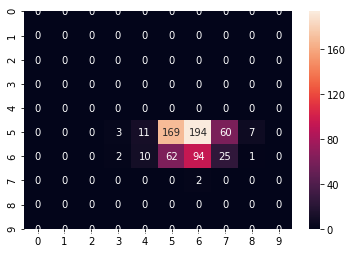

In [17]:
# Final testing for red wine

ax_red = sn.heatmap(conf_matrix_red, annot=True, fmt = 'g')
print("Final Testing Accuracy: ", count_correct/testing_y_values_red.shape[0])